# Multi-morbidity networks in the oldest old (90yo+) via Bayesian network reconstruction

This notebook applies the Bayesian inference techniques from [`MLTC_inference.ipynb`](MLTC_inference.ipynb) to PCCIU dataset divided into age and sex, while using results from [`MLTC_atomic.ipynb`](MLTC_atomic.ipynb) as a reference. It is recommended to view those notebooks first.

**Author**: Guillermo Romero Moreno <Guillermo.RomeroMoreno@ed.ac.uk> <br/>
**Date**: November 2022 <br/>
**License**: CC-BY-4.0<br/>

In [1]:
%load_ext autoreload
# https://ipython.readthedocs.io/en/stable/config/extensions/autoreload.html

import os, sys
thisdir = os.path.abspath('')
libdir = os.path.join(thisdir, '../')

if libdir not in sys.path:
    sys.path.insert(0, libdir)
    
import nest_asyncio
nest_asyncio.apply()

# core python modules
import time
import re
import itertools as it
import warnings

# external
import numpy as np
import scipy as sp
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns

# internal
from lib.utils import MLTC_count, identify_LTC, compute_RR
from lib.data import load_dataset, stratify_dataset, beautify_index, beautify_name
from lib.results import compute_communities, get_top_associations, plot_ABC_vs_RR, plot_tops, build_network, plot_network
from lib.model import ABCModel, probability_of_larger

print('python', sys.version)
print('numpy', np.__version__)
print('scipy', sp.__version__)
print('pandas', pd.__version__)
print('networkx', nx.__version__)
print('seaborn', sns.__version__)

python 3.9.16 (main, Mar  8 2023, 14:00:05) 
[GCC 11.2.0]
numpy 1.22.3
scipy 1.8.0
pandas 1.4.2
networkx 2.8
seaborn 0.13.1


For [using bokeh with jupyterLab](https://docs.bokeh.org/en/latest/docs/user_guide/jupyter.html):

In [2]:
from bokeh.io import output_notebook, show, save
from bokeh.layouts import grid
output_notebook()

Loading BokehJS ...

## Load the dataset and basic functions

In [3]:
data, names = load_dataset()
N = len(names)  # Number of conditions

Loading dataset...
Dataset loaded (elapsed time: 30.45s)
Length of dataset: 1751841


In [4]:
def stratify(data, stratification_variable):
    stratified_dataframes, stratified_labels, stratified_fnames = stratify_dataset(data, stratification_variable)

    n_strata = len(stratified_dataframes)
    stratified_X = np.array([np.array(MLTC_count(df_l, names), dtype=int) for df_l in stratified_dataframes])
    stratified_P = np.array([np.array([df_l[LTC].sum() for LTC in names]) for df_l in stratified_dataframes])
    stratified_M = np.array([len(df_l) for df_l in stratified_dataframes])
    
    return stratified_dataframes, stratified_labels, stratified_fnames, n_strata, stratified_X, stratified_P, stratified_M

In [5]:
def load_model(dat, num_warmup, num_samples, fname, pval, bonferroni=False, num_chains=5):
    model = ABCModel()
    model.load_fit(dat, fname + model.create_file_name(num_warmup), column_names=names, num_warmup=num_warmup, random_seed=1, num_samples=int(num_samples/num_chains))
    assert np.isclose(model._get_var("r").shape[-1], num_samples), f"{model._get_var('r').shape[-1]} != {num_samples}"

    # Compute RR and significance of RR and ABC
    triu = np.triu_indices(n=len(model.morb_names), k=1)
    corrected_pval = pval if not bonferroni else pval / len(triu[0])
    print(f"Corrected p-value: {corrected_pval}, min # of samples for assessing: {1/corrected_pval}, required percentile: {corrected_pval * 100 / 2}")

    results_df = model.get_results_dataframe(pval, corrected_pval)
    results_df["i_abs"] = results_df["namei"].apply(lambda x: identify_LTC(x, names)[0])
    results_df["j_abs"] = results_df["namej"].apply(lambda x: identify_LTC(x, names)[0])

    print(f"Significant associatons:   Fisher (RR): {results_df['fisher_sig'].sum():.0f} ({100*results_df['fisher_sig'].sum()/len(triu[0]):.1f}%), "
          f"ABC: {results_df['a_sig'].sum():3.0f} ({100*results_df['a_sig'].sum()/len(triu[0]):.1f}%)")
    
    return model, results_df

In [33]:
def beautify_node_label(name, sep="\n"):
    beautify_dict = {"AnyCancer_Last5Yrs": "Any Cancer\nLast 5 Years",
                    "ChronicLiverDisease": "Chronic Liver\nDisease",
                    "PeripheralVascularDisease": "Peripheral Vascular\nDisease",
                    "RheumatoidArthritisEtc": "Rheumaotid\nArthritis",
                    "IrritableBowelSyndrome": "IBS", }
    return sep.join(re.findall('[A-Z]+[a-z]*|\d+', name)) if name not in beautify_dict else beautify_dict[name]

def build_and_plot_network(data, var, build_kwargs={}, **plot_kwargs):
    all_conditions = True if "layout" in plot_kwargs and plot_kwargs["layout"] == nx.circular_layout and ("communities" not in plot_kwargs or plot_kwargs["communities"] == False) else False
    network, network_df = build_network(data, var, morbidity_names=names, all_conditions=all_conditions, **build_kwargs)
    return plot_network(network, network_df, var, beautify_name_func=beautify_node_label, **plot_kwargs)

# Results WITHOUT sex stratification

These experiments are taking the whole cohort --- i.e. both men and women together.

In [7]:
dfs, labels, fnames, L, Xs, Ps, Ms = stratify(data, "Age")  # This stratifies the data in bands of 10 years old
df_eld, fname_eld = dfs[9], fnames[9]  # The 90yo+ population is the index 9
X, P, M = Xs[9], Ps[9], Ms[9]

## Descriptive analysis of the 90+ age group

In [8]:
df_men = df_eld[df_eld["Sex"]=="Men"]
df_women = df_eld[df_eld["Sex"]=="Women"]
print(f"N of patients: Total {M}, men:{len(df_men)} ({100 * len(df_men)/M:.2f}%), women:{len(df_women)} ({100 * len(df_women)/M:.2f}%)")

N of patients: Total 12009, men:3039 (25.31%), women:8970 (74.69%)


Ttest_indResult(statistic=-3.123012026426313, pvalue=0.005875790295814911)


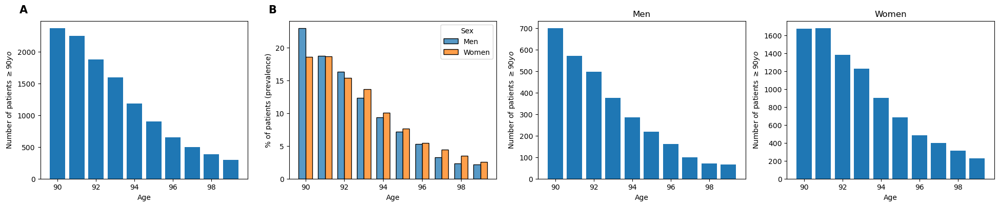

In [9]:
def describe_group(dfo, ax, label, legend=True):
    counts, _ = np.histogram(dfo["Age"], bins=np.linspace(89.5,99.5,11))
    ax.bar(range(len(counts)), counts, label=label);
    ax.set(xlabel="Age", ylabel=f"Number of patients $\geq90yo$", title=label)
    ax.legend() if legend else None
    ax.xaxis.set(ticks=range(10)[::2], ticklabels=[str(el) for el in range(90,100)][::2])
    return counts

fig, axes = plt.subplots(1, 4, figsize=(24, 4))
describe_group(df_eld, axes[0], "", legend=False)  # , axes[3]
axes[0].annotate("A", xy=(-0.1, 1.05), xycoords='axes fraction', fontweight='bold', fontsize=15)

sns.histplot(df_eld, x="Age", hue="Sex", stat="percent", discrete=True, common_norm=False, multiple="dodge", shrink=0.7, ax=axes[1]);
axes[1].set(xlabel="Age", ylabel="% of patients (prevalence)");
axes[1].annotate("B", xy=(-0.1, 1.05), xycoords='axes fraction', fontweight='bold', fontsize=15)

men = describe_group(df_men, axes[2], "Men", legend=False)
women = describe_group(df_women, axes[3], "Women", legend=False)
print(sp.stats.ttest_ind(men, women))

       | >=3 morb:  7814 (65.07%), >=2 morb: 81.46%, mean morb: 3.65+-0.02
Men    | >=3 morb:  1823 (59.99%), >=2 morb: 77.59%, mean morb: 3.43+-0.04
Women  | >=3 morb:  5991 (66.79%), >=2 morb: 82.76%, mean morb: 3.72+-0.02
Ttest_indResult(statistic=-5.969869800347804, pvalue=2.441509268749974e-09)


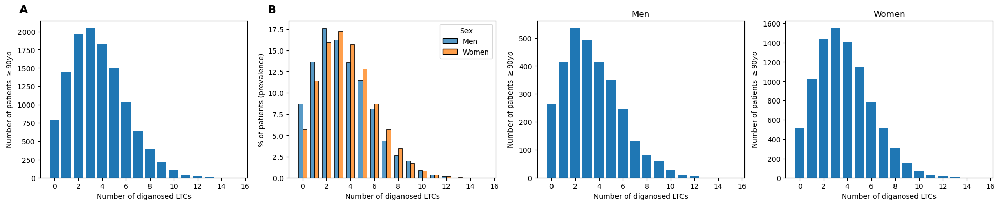

In [10]:
morb_cols = df_eld.columns[11:51]
def describe_group(dfo, ax, label, legend=True):
    individuals = dfo[morb_cols].values.sum(axis=1)
    counts, _ = np.histogram(individuals, bins=range(17))
    ax.bar(range(len(counts)), counts, label=label);
    ax.set(xlabel="Number of diganosed LTCs", ylabel=f"Number of patients $\geq90yo$", title=label)
    ax.legend() if legend else None

    print(f"{label:7}| >=3 morb: {counts[3:].sum():5} ({100*counts[3:].sum()/len(dfo):.2f}%), >=2 morb: {100*counts[2:].sum()/len(dfo):.2f}%, mean morb: {(mean:= sum(i * count for i, count in enumerate(counts))/len(dfo)):.2f}+-{np.sqrt(sum((i - mean)**2 * count for i, count in enumerate(counts)))/len(dfo):.2f}")
    return individuals

fig, axes = plt.subplots(1, 4, figsize=(24, 4))
describe_group(df_eld, axes[0], "", legend=False)  # , axes[3]
axes[0].annotate("A", xy=(-0.1, 1.05), xycoords='axes fraction', fontweight='bold', fontsize=15)

sns.histplot(df_eld, x="n_morb", hue="Sex", stat="percent", discrete=True, common_norm=False, multiple="dodge", shrink=0.7, ax=axes[1]);
axes[1].set(xlabel="Number of diganosed LTCs", ylabel="% of patients (prevalence)");
axes[1].annotate("B", xy=(-0.1, 1.05), xycoords='axes fraction', fontweight='bold', fontsize=15)

men = describe_group(df_men, axes[2], "Men", legend=False)
women = describe_group(df_women, axes[3], "Women", legend=False)
print(sp.stats.ttest_ind(men, women))

Prevalence of conditions in the whole cohort.

In [11]:
LTC_prev_df = pd.DataFrame(index=names, columns=["Counts", "Prevalence"], data=np.array([P,P/M]).T).sort_values("Counts", ascending=False)
LTC_prev_df["Counts"] = LTC_prev_df["Counts"].astype(int)
LTC_prev_df["Prevalence"] = LTC_prev_df["Prevalence"].apply(lambda x: f'{100*x:.2g}%')
LTC_prev_df["name+"] = LTC_prev_df.index + " (" + LTC_prev_df["Counts"].astype(int).astype(str) + ")"
LTC_prev_df[["Counts", "Prevalence"]]

,Counts,Prevalence
Hypertension,5475,46%
CHD,3070,26%
TreatedConstipation,3015,25%
HearingLoss,2357,20%
StrokeTIA,2059,17%
Dementia,1906,16%
Depression,1850,15%
CKD,1829,15%
OtherPsychoactiveMisuse,1821,15%
AnxietyEtc,1812,15%


## Results with 99% CI

In [12]:
model, dat_eld = load_model(df_eld, num_warmup=500, num_samples=20000, fname=fname_eld, pval=0.01)

Model loaded from /disk/scratch/gromero/output/Age10-9_MLTC_atomic_hyp_mult_wu500.
Corrected p-value: 0.01, min # of samples for assessing: 100.0, required percentile: 0.5
Elapsed time (computing modes): 00 hours, 00 minutes, 05 seconds.


/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/utils.py:150: RuntimeWarning: divide by zero encountered in true_divide
  sigmas = 1 / X - 1 / M + 1 / P_abs[None, :] / P_abs[:, None] - 1 / M ** 2
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/utils.py:152: RuntimeWarning: invalid value encountered in multiply
  RRs_conf = RRs * np.exp(zs[0] * sigmas), RRs * np.exp(zs[1] * sigmas)


Significant associatons:   Fisher (RR): 195 (25.0%), ABC: 164 (21.0%)


### Top associations

Plot them.

/tmp/ipykernel_23694/1814687895.py:23: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  sub_fig.tight_layout()
/tmp/ipykernel_23694/1814687895.py:23: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  sub_fig.tight_layout()


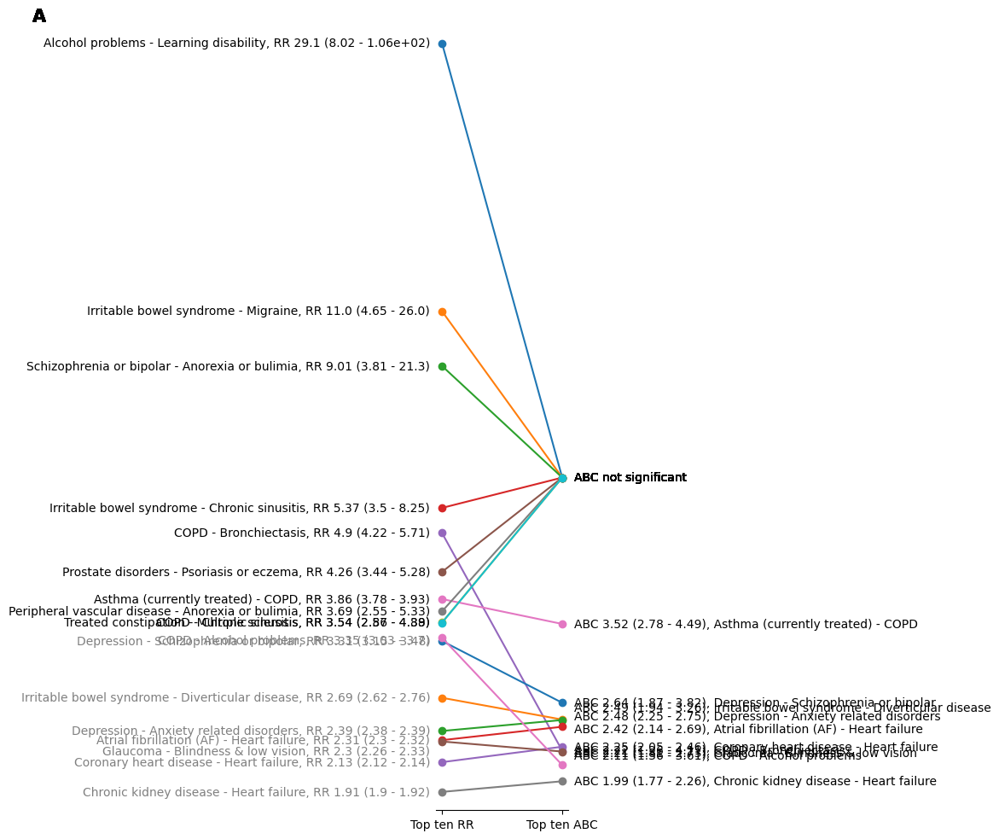

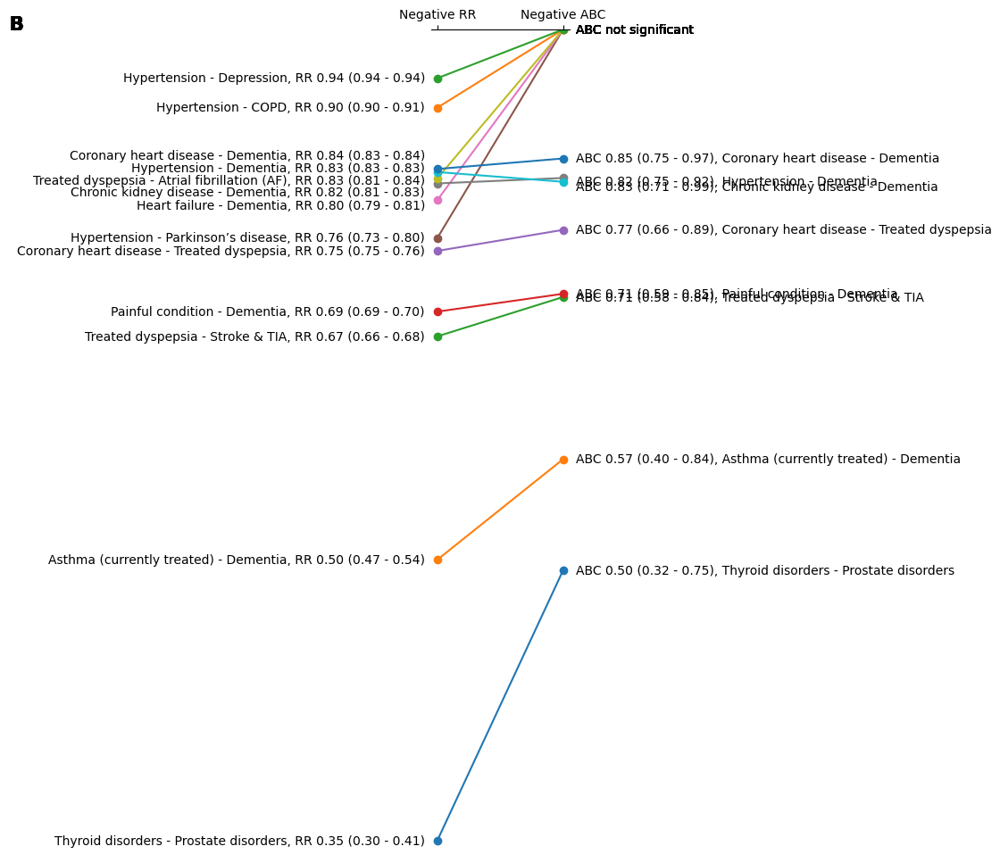

In [15]:
# fig, axes = plt.subplots(2, 1, figsize=(2,12*2))
for i, panel in enumerate("AB"):
    # ax = axes[i]
    fig2_kwargs = dict(NS_pos=6 if panel == "A" else 1, negative=panel == "B", top_N=10 if panel == "A" else 20,
                       y_dict={"RR": {"COPD - Alcohol problems": -2,
                                         "Glaucoma - Blindness & low vision": -8,},
                                  "ABC": {"COPD - Alcohol problems": 8,
                                         "Irritable bowel syndrome - Diverticular disease": 10,
                                         "Depression - Anxiety related disorders": 3,
                                         "Atrial fibrillation (AF) - Heart failure": -2,
                                         "Glaucoma - Blindness & low vision": -1}} if panel == "A" else {
                            "RR": {"Coronary heart disease - Dementia": 11,
                                        "Hypertension - Dementia": 3,
                                         "Treated dyspepsia - Atrial fibrillation (AF)": -2,
                                        "Chronic kidney disease - Dementia":-7,
                                        "Heart failure - Dementia": -4,},
                                  "ABC": {"Heart failure - Dementia": 6,
                                         "Chronic kidney disease - Dementia":-7}},)
    # plot_fig2(ax, panel)
    
    sub_fig, ax = plt.subplots(figsize=(2,12))
    plot_tops(dat_eld, ax, panel, **fig2_kwargs)
    sub_fig.tight_layout()
    sub_fig.savefig(f"../figs/fig2{panel}.eps")

# fig.tight_layout()
# fig.savefig("figs/fig2.eps")

Produce tables.

In [16]:
tops = get_top_associations(dat_eld)

Top associations by ABC:

In [17]:
tops[0]

,a_f_sig_CI,RR_f_sig_CI
Asthma (currently treated) - Chronic obstructive pulmonary disease (COPD),3.52 (2.78 - 4.49),3.86 (3.78 - 3.93)
Depression - Schizophrenia (and related non-organic psychosis) or bipolar disorder,2.64 (1.87 - 3.82),3.31 (3.15 - 3.48)
Irritable bowel syndrome (IBS) - Diverticular disease of intestine,2.49 (1.94 - 3.26),2.69 (2.62 - 2.76)
"Depression - Anxiety & other neurotic, stress related & somatoform disorders",2.48 (2.25 - 2.75),2.39 (2.38 - 2.39)
Atrial fibrillation (AF) - Heart failure,2.42 (2.14 - 2.69),2.31 (2.3 - 2.32)
Coronary heart disease (CHD) - Heart failure,2.25 (2.05 - 2.46),2.13 (2.12 - 2.14)
Chronic obstructive pulmonary disease (COPD) - Bronchiectasis,2.22 (1.26 - 4.11),4.9 (4.22 - 5.71)
Glaucoma - Blindness & low vision,2.21 (1.81 - 2.73),2.3 (2.26 - 2.33)
Chronic obstructive pulmonary disease (COPD) - Alcohol problems,2.11 (1.36 - 3.61),3.35 (3.03 - 3.7)
Chronic kidney disease (CKD) - Heart failure,1.99 (1.77 - 2.26),1.91 (1.9 - 1.92)


Top associations by RR:

In [18]:
tops[2]

,RR_f_sig_CI,a_f_sig_CI
Alcohol problems - Learning disability,29.1 (8.02 - 1.06e+02),NS
Irritable bowel syndrome (IBS) - Migraine,11.0 (4.65 - 26.0),NS
Schizophrenia (and related non-organic psychosis) or bipolar disorder - Anorexia or bulimia,9.01 (3.81 - 21.3),NS
Irritable bowel syndrome (IBS) - Chronic sinusitis,5.37 (3.5 - 8.25),NS
Chronic obstructive pulmonary disease (COPD) - Bronchiectasis,4.9 (4.22 - 5.71),2.22 (1.26 - 4.11)
Prostate disorders - Psoriasis or eczema,4.26 (3.44 - 5.28),NS
Asthma (currently treated) - Chronic obstructive pulmonary disease (COPD),3.86 (3.78 - 3.93),3.52 (2.78 - 4.49)
Peripheral vascular disease - Anorexia or bulimia,3.69 (2.55 - 5.33),NS
Treated constipation - Multiple sclerosis,3.54 (2.57 - 4.88),NS
Chronic obstructive pulmonary disease (COPD) - Chronic sinusitis,3.54 (2.86 - 4.39),NS


In [19]:
f'Median significant association by RR: {dat_eld[dat_eld["fisher_sig"]]["RR"].median():.2f} ' + \
f'[IQR {np.percentile(dat_eld[dat_eld["fisher_sig"]]["RR"], 25):.2f}, {np.percentile(dat_eld[dat_eld["fisher_sig"]]["RR"], 75):.2f}]'

'Median significant association by RR: 1.35 [IQR 1.21, 1.62]'

Top negative associations by RR:

In [20]:
tops[3]

,RR_f_sig_CI,a_f_sig_CI
Thyroid disorders - Prostate disorders,0.351 (0.305 - 0.405),0.498 (0.324 - 0.75)
Asthma (currently treated) - Dementia,0.505 (0.469 - 0.543),0.575 (0.402 - 0.841)
Treated dyspepsia - Stroke & transient ischaemic attack (TIA),0.673 (0.663 - 0.683),0.708 (0.576 - 0.843)
Painful condition - Dementia,0.695 (0.686 - 0.704),0.711 (0.593 - 0.853)
Coronary heart disease (CHD) - Treated dyspepsia,0.752 (0.745 - 0.758),0.772 (0.664 - 0.892)
Hypertension - Parkinson’s disease,0.764 (0.729 - 0.801),NS
Heart failure - Dementia,0.802 (0.792 - 0.813),NS
Chronic kidney disease (CKD) - Dementia,0.82 (0.811 - 0.829),0.826 (0.715 - 0.993)
Treated dyspepsia - Atrial fibrillation (AF),0.825 (0.814 - 0.837),NS
Hypertension - Dementia,0.832 (0.829 - 0.835),0.822 (0.748 - 0.917)


### Heatmaps

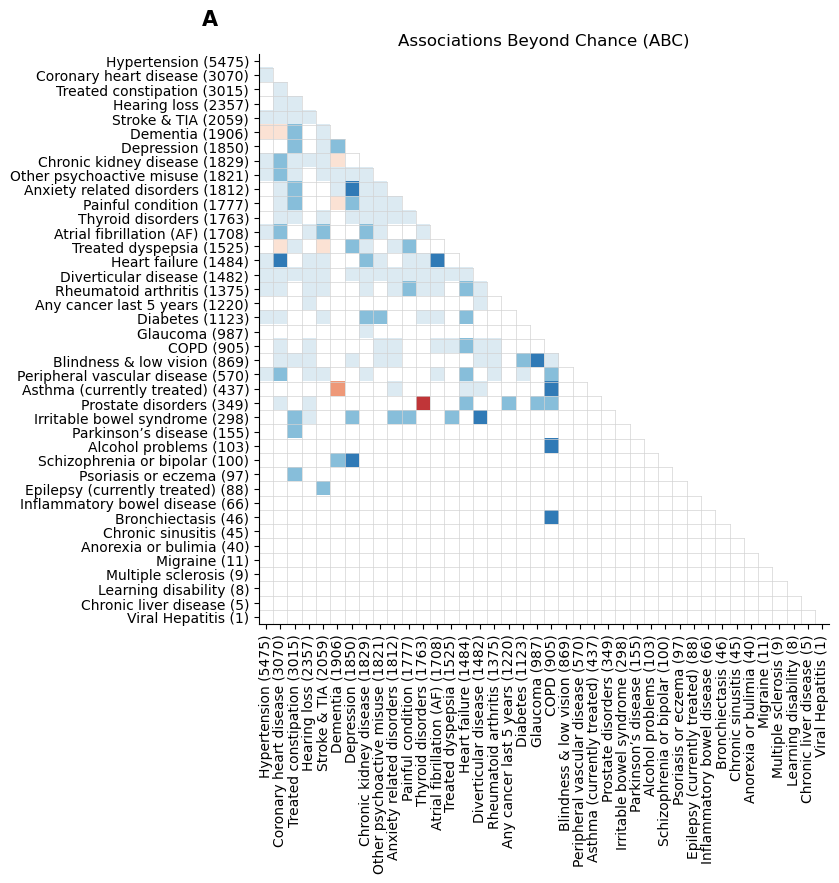

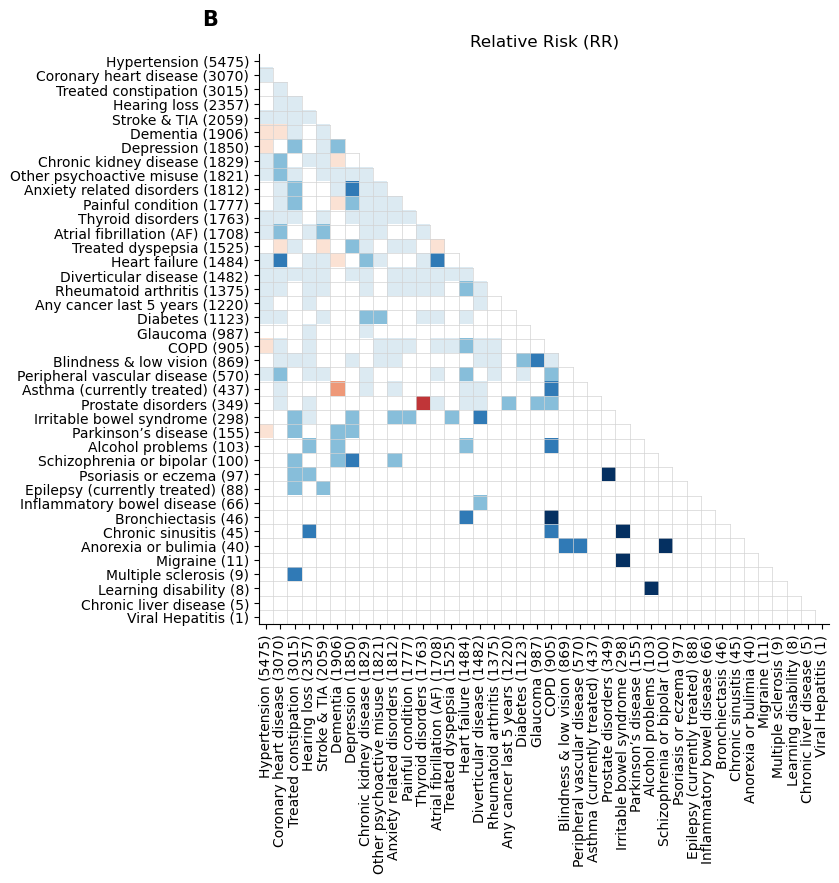

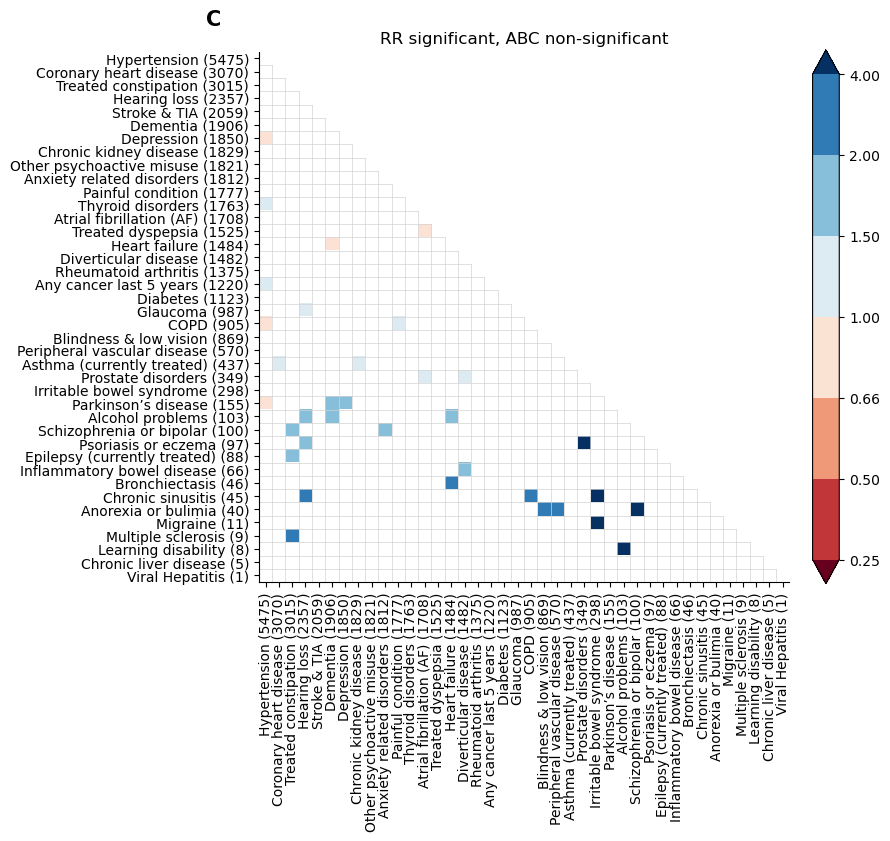

In [21]:
def plot_fig1(ax, panel):
    # heatmap_kwargs = {"norm_kwargs": {"extend":"both"}, "max_val": max_val, "cbar_ticklabels": ["0.3", "0.5", "0.7", "1", "2", "3", "4", "5"]}
    heatmap_kwargs = dict(norm_kwargs={"extend":"both"}, boundaries=(0.25, 0.5, 0.66, 1, 1.5, 2, 4), highlight_top=False, ax=ax,
                          beautify_name_func=beautify_name, beautify_name_kwargs={"short":True})
    if panel == "A":
        model.plot_heatmap("ABC", title="Associations Beyond Chance (ABC)", cbar=False, **heatmap_kwargs)
    elif panel == "B":
        model.plot_heatmap("RR", title="Relative Risk (RR)", cbar=False, **heatmap_kwargs)
    elif panel == "C":
        model.plot_heatmap("RR_only", title="RR significant, ABC non-significant", **heatmap_kwargs)
    
    ax.annotate(panel, xy=(-0.1, 1.05), xycoords='axes fraction', fontweight='bold', fontsize=15)
    
    
# fig, axes = plt.subplots(1, 3, figsize=(9*3, 9))
for i, panel in enumerate("ABC"):
    # ax = axes[i]
    # plot_fig1(ax, panel)
    
    sub_fig, ax = plt.subplots(figsize=(9,)*2)
    plot_fig1(ax, panel)
    sub_fig.tight_layout()
    sub_fig.savefig(f"../figs/fig1{panel}.eps")

# fig.tight_layout()
# fig.savefig("figs/fig1.eps")

### ABC vs RR scatterplots

161/780 data points
3/780 data points
34/780 data points
582/780 data points


/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(xlim=lim if xlim is None else xlim, ylim=lim if ylim is None else ylim,
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(xlim=lim if xlim is None else xlim, ylim=lim if ylim is None else ylim,
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(xlim=lim if xlim is None else xlim, ylim=lim if ylim is None else ylim,
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive bottom ylim on a l

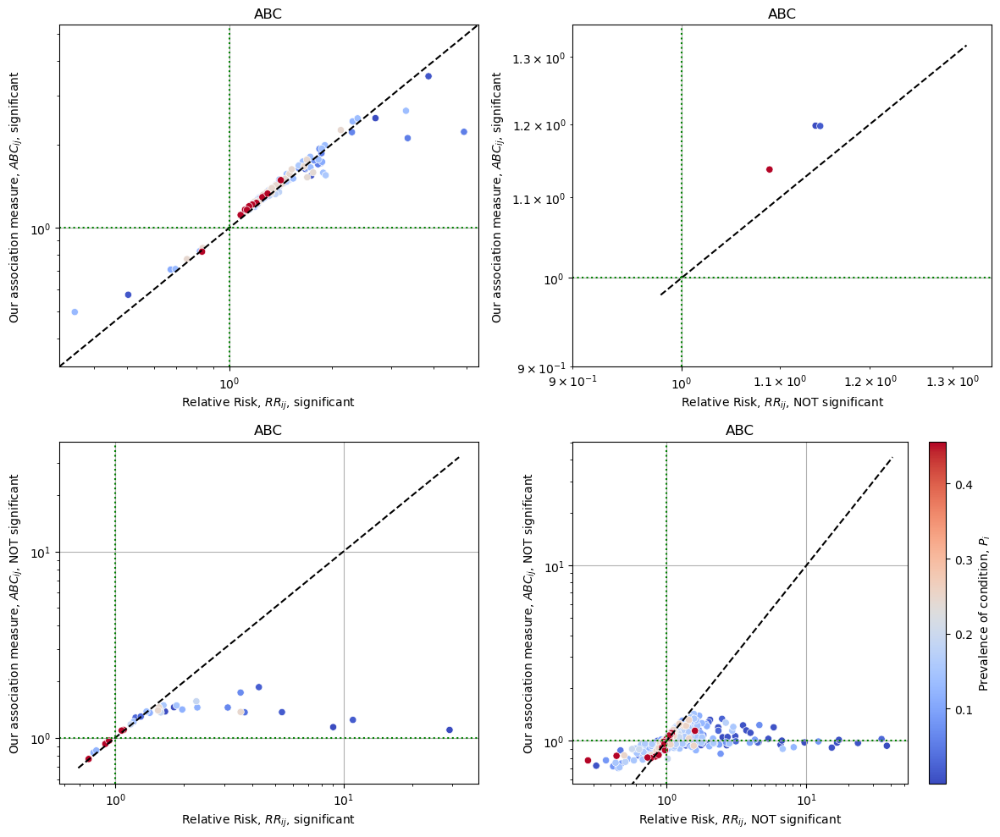

In [22]:
fig, axes = plt.subplots(2,2, figsize=(12,10)) #, sharex=True) #, sharey=True)
plot_kwargs = dict(log=True)
plot_ABC_vs_RR(axes[0][0], dat_eld, **plot_kwargs)  # xlim=[0, 5.1], ylim=[0, 4])
plot_ABC_vs_RR(axes[0][1], dat_eld, RR_conf=False, xlim=[0.9,1.35], ylim=[0.9,1.35], **plot_kwargs)
plot_ABC_vs_RR(axes[1][0], dat_eld, a_conf=False, xlim=0, ylim=0, **plot_kwargs)
plot_ABC_vs_RR(axes[1][1], dat_eld, RR_conf=False, a_conf=False, colorbar=True, xlim=0, ylim=0, **plot_kwargs)
fig.tight_layout();

Associations significant by ABC but not by RR:

In [23]:
model.association_df[(model.association_df["fisher_sig"]==False) & (model.association_df["a_sig"]==True)].loc[:,['Xij', 'namei+', 'namej+', 
       'fisher_sig', 'a_f_sig_CI', 'RR_f', 'RR CI (99%)', 'RR_f_sig_CI']]

,Xij,namei+,namej+,fisher_sig,a_f_sig_CI,RR_f,RR CI (99%),RR_f_sig_CI
names,,,,,,,,
PainfulCondition-HeartFailure,250,PainfulCondition1777,HeartFailure1484,False,1.2 (1.01 - 1.38),1.14,1.13 - 1.15,NS
OtherPsychoactiveMisuse-Diverticular,257,OtherPsychoactiveMisuse1821,Diverticular1482,False,1.2 (1.01 - 1.39),1.14,1.13 - 1.15,NS
TreatedConstipation-CKD,500,TreatedConstipation3015,CKD1829,False,1.14 (1.01 - 1.27),1.09,1.08 - 1.09,NS


### Network visualisation and analysis

No communities.

In [34]:
plot_kwargs = dict(communities=False, figsize=(600, 550), interactive=True, prev_size=True)
# plot_kwargs = {"communities": False, "figsize":(600, 550), "layout":nx.circular_layout}

G_ABC, ax1, _ = build_and_plot_network(dat_eld, var="ABC", title=f"A: ABC", **plot_kwargs)
G_RR, ax2, _ = build_and_plot_network(dat_eld, var="RR", title=f"B: RR", **plot_kwargs)
gr = grid([[ax1, ax2]])
show(gr)

Original size: 164 edges, 32 nodes, filtered size: 164 edges, 32 nodes.
Original size: 195 edges, 38 nodes, filtered size: 195 edges, 38 nodes.


With communities.

In [35]:
plot_kwargs = dict(communities=True, figsize=(600, 550), interactive=True, prev_size=True, community_weight=True, span=10)  # layout=nx.kamada_kawai_layout)
# plot_kwargs = {"communities": True, "layout":nx.circular_layout, "figsize":(600, 550), "build_kwargs": {"cutoff":0.25}}

G_ABC, ax1, comm_ABC = build_and_plot_network(dat_eld, var="ABC", title=f"A: ABC", **plot_kwargs)
G_RR, ax2, comm_RR = build_and_plot_network(dat_eld, var="RR", title=f"B: RR", **plot_kwargs)
gr = grid([[ax1, ax2]])
show(gr)

Original size: 164 edges, 32 nodes, filtered size: 164 edges, 32 nodes.
Modularity: 0.352594381512914 coverage-performance (0.5609756097560976, 0.7237903225806451)
Original size: 195 edges, 38 nodes, filtered size: 195 edges, 38 nodes.
Modularity: 0.3836453673903479 coverage-performance (0.49230769230769234, 0.7339971550497866)


List of communities

In [36]:
comm_ABC, comm_RR

([['Hypertension',
   'CHD',
   'Diabetes',
   'ThyroidDisorders',
   'RheumatoidArthritisEtc',
   'OtherPsychoactiveMisuse',
   'StrokeTIA',
   'CKD',
   'AtrialFib',
   'PeripheralVascularDisease',
   'HeartFailure',
   'Epilepsy'],
  ['Depression',
   'PainfulCondition',
   'Parkinsons',
   'TreatedDyspepsia',
   'AnxietyEtc',
   'IrritableBowelSyndrome',
   'TreatedConstipation',
   'Diverticular',
   'Dementia',
   'SchizophreniaBipolar',
   'PsoriasisEczema'],
  ['ActiveAsthma',
   'Bronchiectasis',
   'HearingLoss',
   'COPD',
   'AnyCancer_Last5Yrs',
   'AlcoholProblems',
   'Prostate',
   'Glaucoma',
   'Blindness']],
 [['Hypertension',
   'ActiveAsthma',
   'CHD',
   'Bronchiectasis',
   'Diabetes',
   'ThyroidDisorders',
   'RheumatoidArthritisEtc',
   'COPD',
   'OtherPsychoactiveMisuse',
   'StrokeTIA',
   'CKD',
   'AtrialFib',
   'HeartFailure',
   'Epilepsy'],
  ['Depression',
   'PainfulCondition',
   'AnorexiaBulimia',
   'Parkinsons',
   'TreatedDyspepsia',
   'Multi

### Average associations (and node degrees)

Node degrees (left, sorted by prevalence; right, sorted by strength)

/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/model.py:1006: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(sorted_labels)
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/model.py:1006: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(sorted_labels)


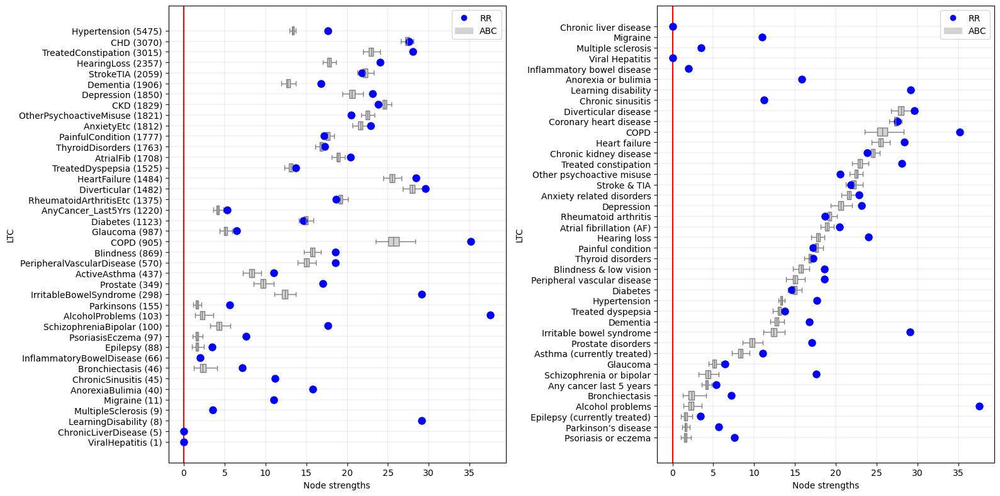

In [38]:
node_deg_kwargs = dict(pvalue=0.01, beautify_name_func=beautify_name, beautify_name_kwargs={"short":True})

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
model.plot_node_degrees(axes[0], **node_deg_kwargs);
model.plot_node_degrees(axes[1], sort_by="degree", **node_deg_kwargs);
fig.tight_layout();

Average associations (sorted by prevalence)

/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/model.py:1006: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(sorted_labels)


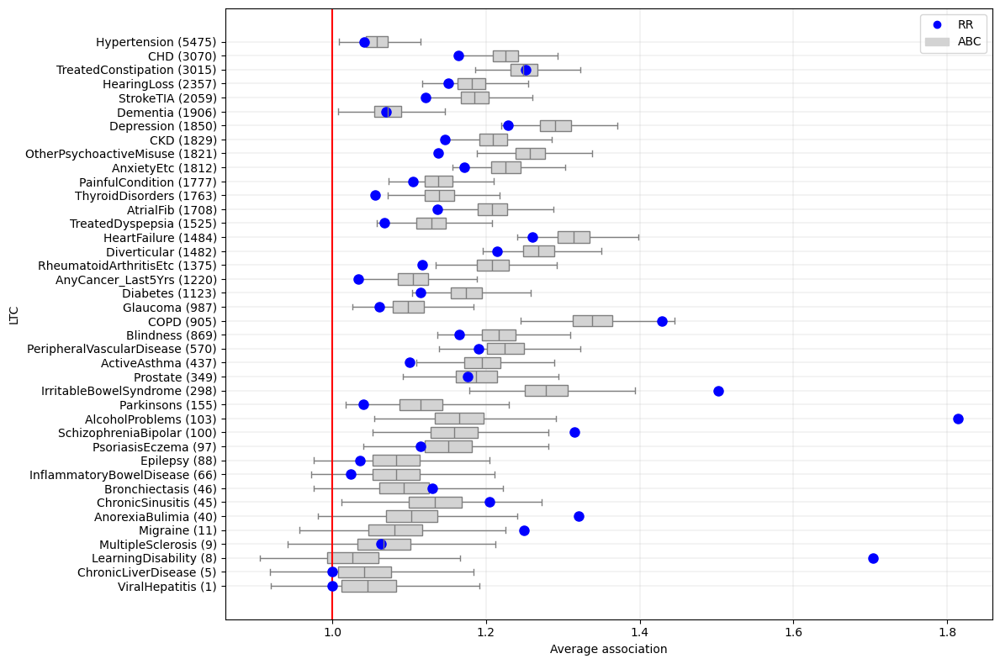

In [39]:
fig, ax = plt.subplots(figsize=(12, 8))
model.plot_node_degrees(ax, catch_all=True, log=False, **node_deg_kwargs);
fig.tight_layout();

Average associations (sorted by strength)

/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/model.py:1006: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(sorted_labels)


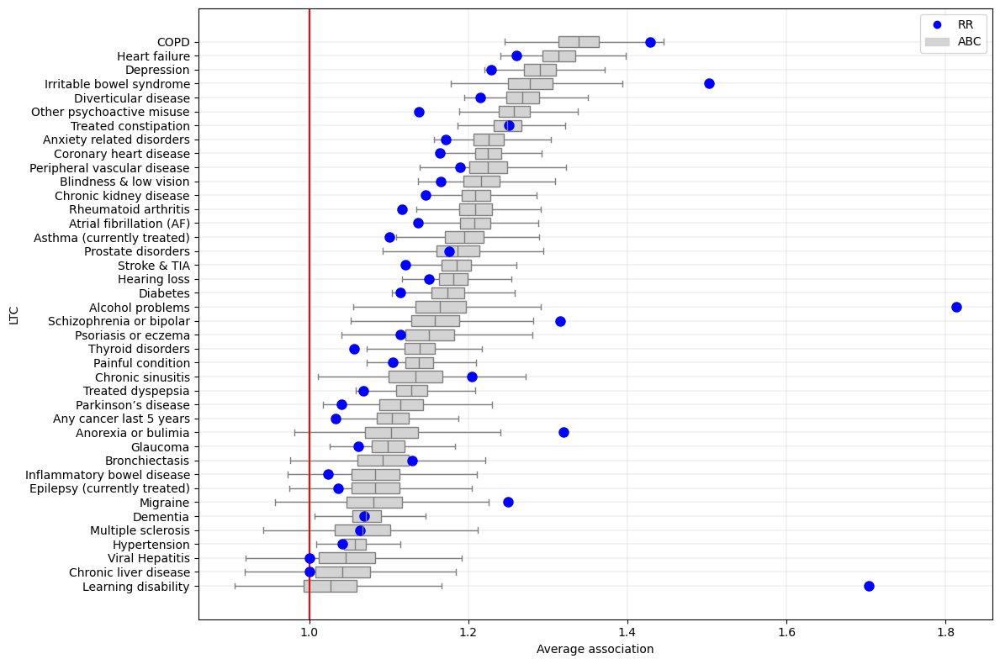

In [40]:
fig, ax = plt.subplots(figsize=(12, 8))
strengths = model.plot_node_degrees(ax, catch_all=True, sort_by="degree", **node_deg_kwargs);
fig.tight_layout();

In [41]:
avg_assocs = {}
for LTC, avgs in strengths[0].items():
    avg_assocs[LTC] = [f"{np.median(avgs):.3} ({np.percentile(avgs, 0.5):.3} - {np.percentile(avgs, 99.5):.3})", f"{float(strengths[1][LTC]):.3}"]
                                        
avg_assocs = pd.DataFrame.from_dict(avg_assocs, orient="index", columns=["ABC (CI 99%)", "RR"])
# avg_assocs.loc[strengths[3]]
avg_assocs.sort_values("RR", ascending=False).loc[:, ["RR", "ABC (CI 99%)"]]

,RR,ABC (CI 99%)
AlcoholProblems,1.81,1.16 (1.06 - 1.29)
LearningDisability,1.7,1.03 (0.906 - 1.17)
IrritableBowelSyndrome,1.5,1.28 (1.18 - 1.39)
COPD,1.43,1.34 (1.25 - 1.45)
SchizophreniaBipolar,1.32,1.16 (1.05 - 1.28)
AnorexiaBulimia,1.32,1.1 (0.982 - 1.24)
HeartFailure,1.26,1.31 (1.24 - 1.4)
Migraine,1.25,1.08 (0.957 - 1.23)
TreatedConstipation,1.25,1.25 (1.19 - 1.32)
Depression,1.23,1.29 (1.22 - 1.37)


In [42]:
print(beautify_index(avg_assocs.sort_values("RR", ascending=False).loc[:, ["RR", "ABC (CI 99%)"]], short=False).style.to_latex())

\begin{tabular}{lll}
 & RR & ABC (CI 99%) \\
Alcohol problems & 1.81 & 1.16 (1.06 - 1.29) \\
Learning disability & 1.7 & 1.03 (0.906 - 1.17) \\
Irritable bowel syndrome (IBS) & 1.5 & 1.28 (1.18 - 1.39) \\
Chronic obstructive pulmonary disease (COPD) & 1.43 & 1.34 (1.25 - 1.45) \\
Schizophrenia (and related non-organic psychosis) or bipolar disorder & 1.32 & 1.16 (1.05 - 1.28) \\
Anorexia or bulimia & 1.32 & 1.1 (0.982 - 1.24) \\
Heart failure & 1.26 & 1.31 (1.24 - 1.4) \\
Migraine & 1.25 & 1.08 (0.957 - 1.23) \\
Treated constipation & 1.25 & 1.25 (1.19 - 1.32) \\
Depression & 1.23 & 1.29 (1.22 - 1.37) \\
Diverticular disease of intestine & 1.21 & 1.27 (1.2 - 1.35) \\
Chronic sinusitis & 1.2 & 1.13 (1.01 - 1.27) \\
Peripheral vascular disease & 1.19 & 1.22 (1.14 - 1.32) \\
Prostate disorders & 1.18 & 1.19 (1.09 - 1.29) \\
Anxiety & other neurotic, stress related & somatoform disorders & 1.17 & 1.23 (1.16 - 1.3) \\
Blindness & low vision & 1.17 & 1.22 (1.14 - 1.31) \\
Coronary heart dise

#### Bootstrapped results

In [43]:
def compute_mean_RR_degree(RRs, dat, catch_all=True, sort_by="prev"):
    RR_dat_sig = dat[dat["fisher_sig"]].loc[:, ["namei", "namej"]]
    
    RR_deg = {}
    for LTC1 in model.morb_names:
        if LTC1 in RR_dat_sig.values:
            LTC1_id = identify_LTC(LTC1, model.morb_names)[0]
            sig_RRs = []
            for LTC2 in model.morb_names:
                if (((RR_dat_sig["namei"] == LTC1) & (RR_dat_sig["namej"] == LTC2)).sum() > 0) or (
                        ((RR_dat_sig["namej"] == LTC1) & (RR_dat_sig["namei"] == LTC2)).sum() > 0):
                    RR_values = RRs[LTC1_id, identify_LTC(LTC2, model.morb_names)[0]]
                    sig_RRs.append(RR_values)  # if not log else np.log(RR_values))
                else:
                    # pass
                    sig_RRs.append(1 if catch_all else 0)
            RR_deg[LTC1] = sum(sig_RRs) if not catch_all else np.mean(sig_RRs)
        else:
            RR_deg[LTC1] = 0 if not catch_all else 1  # np.NaN

    return RR_deg


def non_parametric_bootstrap(nsim=5):
    """
    
    Params:
    x, y - data (numpy arrays)
    f - test function to calculate
    nsim - number of simulations to run
    """
    
    M = len(df_eld)
    statistic = {LTC: np.zeros(nsim) for LTC in model.morb_names}
    
    t0 = time.time()
    t_i = t0
    for i in range(nsim):
        # Re-sample the data
        indices = np.random.randint(0, M, M)
        dat_i = df_eld.loc[df_eld.index[indices]]
        X = np.array(MLTC_count(dat_i, names), dtype=int)
        P = np.array([dat_i[name].sum() for name in names])
        
        # Compute the average RR per LTC=
        RR_i, res_i = compute_RR(X, P, M, pval=pval, corrected_pval=corrected_pval, conf_intervals=False)
        RR_i_df = pd.DataFrame(
            [{"i": i, "j": j, "namei": model.morb_names[i], "namej": model.morb_names[j], "names": f"{model.morb_names[i]}-{model.morb_names[j]}",
              "Xi": P_abs[i], "Xj": P_abs[j], "Xij": X[i, j], "Pi": P_abs[i] / M, "Pj": P_abs[j] / M, "Cij": X[i, j] / M,
              "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),
              "namei+": f"{model.morb_names[i]}{P_abs[i]}", "namej+": f"{model.morb_names[j]}{P_abs[j]}",
              "RR": RRs[i, j], "fisher_sig": fishers_sig[i, j]} for (i, j) in it.combinations(range(len(model.morb_names)), 2)])

        RR_i_df["RR_f"] = RR_i_df["RR"].apply(lambda x: f"{x:.3}")
        RR_i_df = RR_i_df.set_index(res["names"])
        
        RR_deg_i = compute_mean_RR_degree(RR_i, RR_i_df)
        for LTC in statistic.keys(): statistic[LTC][i] = RR_deg_i[LTC]
        
        if nsim <= 20:
            print(f"Sample {i} computed. Elapsed time:", time.strftime("%H hours, %M minutes, %S seconds.", time.gmtime(-(t_i - (t_i := time.time())))))
        else:
            print(i, end=" ")
    
    print(f"Total elapsed time:", time.strftime("%H hours, %M minutes, %S seconds.", time.gmtime(t_i - t0)))
    
    return statistic

In [104]:
bootstrapped_RR = non_parametric_bootstrap(nsim=1000)

0 1 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


2 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


3 4 5 6 7 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


8 9 10 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


11 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


12 13 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


14 15 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


16 17 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


18 19 20 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


21 22 23 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


24 25 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


26 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


27 28 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


29 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


30 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


31 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


32 33 34 35 36 37 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


38 39 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


40 41 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


42 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


43 44 45 46 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


47 48 49 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


50 51 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


52 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


53 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


54 55 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


56 57 58 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


59 60 61 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


62 63 64 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


65 66 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


67 68 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


69 70 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


71 72 73 74 75 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


76 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


77 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


78 79 80 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


81 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


82 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


83 84 85 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


86 87 88 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


89 90 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


91 92 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


93 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


94 95 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


96 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


97 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


98 99 100 101 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


102 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


103 104 105 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


106 107 108 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


109 110 111 112 113 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


114 115 116 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


117 118 119 120 121 122 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


123 124 125 126 127 128 129 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


130 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


131 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


132 133 134 135 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


136 137 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


138 139 140 141 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


142 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


143 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


144 145 146 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


147 148 149 150 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


151 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


152 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


153 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


154 155 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


156 157 158 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


159 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


160 161 162 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


163 164 165 166 167 168 169 170 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


171 172 173 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


174 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


175 176 177 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


178 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


179 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


180 181 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


182 183 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


184 185 186 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


187 188 189 190 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


191 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


192 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


193 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


194 195 196 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


197 198 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


199 200 201 202 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


203 204 205 206 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


207 208 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


209 210 211 212 213 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


214 215 216 217 218 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


219 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


220 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


221 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


222 223 224 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


225 226 227 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


228 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


229 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


230 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


231 232 233 234 235 236 237 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


238 239 240 241 242 243 244 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


245 246 247 248 249 250 251 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


252 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


253 254 255 256 257 258 259 260 261 262 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


263 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


264 265 266 267 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


268 269 270 271 272 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


273 274 275 276 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


277 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


278 279 280 281 282 283 284 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


285 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


286 287 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


288 289 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


290 291 292 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


293 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


294 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


295 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


296 297 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


298 299 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


300 301 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


302 303 304 305 306 307 308 309 310 311 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


312 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


313 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


314 315 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


316 317 318 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


319 320 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)


321 322 323 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


324 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


325 326 327 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


328 329 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


330 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


331 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


332 333 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


334 335 336 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


337 338 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


339 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


340 341 342 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


343 344 345 346 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


347 348 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


349 350 351 352 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


353 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


354 355 356 357 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


358 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


359 360 361 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


362 363 364 365 366 367 368 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


369 370 371 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


372 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


373 374 375 376 377 378 379 380 381 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


382 383 384 385 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


386 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


387 388 389 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


390 391 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


392 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


393 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


394 395 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


396 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


397 398 399 400 401 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


402 403 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


404 405 406 407 408 409 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


410 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


411 412 413 414 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


415 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


416 417 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


418 419 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


420 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


421 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


422 423 424 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


425 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


426 427 428 429 430 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


431 432 433 434 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


435 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


436 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


437 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


438 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


439 440 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


441 442 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


443 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


444 445 446 447 448 449 450 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


451 452 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


453 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


454 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


455 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


456 457 458 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


459 460 461 462 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


463 464 465 466 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


467 468 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


469 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


470 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


471 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


472 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


473 474 475 476 477 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


478 479 480 481 482 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


483 484 485 486 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


487 488 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


489 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


490 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


491 492 493 494 495 496 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


497 498 499 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


500 501 502 503 504 505 506 507 508 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


509 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


510 511 512 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


513 514 515 516 517 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


518 519 520 521 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


522 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


523 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


524 525 526 527 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


528 529 530 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


531 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


532 533 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


534 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


535 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


536 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


537 538 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


539 540 541 542 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


543 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


544 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


545 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


546 547 548 549 550 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


551 552 553 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


554 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


555 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


556 557 558 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


559 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


560 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


561 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


562 563 564 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


565 566 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


567 568 569 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


570 571 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


572 573 574 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)


575 576 577 578 579 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


580 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


581 582 583 584 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


585 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


586 587 588 589 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


590 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


591 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


592 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


593 594 595 596 597 598 599 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


600 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


601 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


602 603 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


604 605 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


606 607 608 609 610 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


611 612 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


613 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


614 615 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


616 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


617 618 619 620 621 622 623 624 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


625 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


626 627 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


628 629 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


630 631 632 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


633 634 635 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


636 637 638 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


639 640 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


641 642 643 644 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


645 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


646 647 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


648 649 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


650 651 652 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


653 654 655 656 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


657 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


658 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


659 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


660 661 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


662 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


663 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


664 665 666 667 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


668 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


669 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


670 671 672 673 674 675 676 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


677 678 679 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


680 681 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


682 683 684 685 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


686 687 688 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


689 690 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


691 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


692 693 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


694 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


695 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


696 697 698 699 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


700 701 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


702 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


703 704 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


705 706 707 708 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


709 710 711 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


712 713 714 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


715 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


716 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


717 718 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


719 720 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


721 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


722 723 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


724 725 726 727 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


728 729 730 731 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


732 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


733 734 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


735 736 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


737 738 739 740 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


741 742 743 744 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


745 746 747 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


748 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


749 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


750 751 752 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


753 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


754 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


755 756 757 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


758 759 760 761 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


762 763 764 765 766 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


767 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


768 769 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


770 771 772 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


773 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


774 775 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


776 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


777 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


778 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


779 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


780 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


781 782 783 784 785 786 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


787 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


788 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


789 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


790 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


791 792 793 794 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


795 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


796 797 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


798 799 800 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


801 802 803 804 805 806 807 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


808 809 810 811 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


812 813 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


814 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


815 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


816 817 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


818 819 820 821 822 823 824 825 826 827 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


828 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


829 830 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


831 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


832 833 834 835 836 837 838 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


839 840 841 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


842 843 844 845 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


846 847 848 849 850 851 852 853 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


854 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


855 856 857 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


858 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


859 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


860 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


861 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


862 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


863 864 865 866 867 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


868 869 870 871 872 873 874 875 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


876 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


877 878 879 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


880 881 882 883 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


884 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


885 886 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


887 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


888 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


889 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


890 891 892 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


893 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


894 895 896 897 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


898 899 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


900 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


901 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


902 903 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


904 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


905 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


906 907 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


908 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


909 910 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


911 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


912 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


913 914 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


915 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


916 917 918 919 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


920 921 922 923 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


924 925 926 927 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


928 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


929 930 931 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


932 933 934 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


935 936 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


937 938 939 940 941 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


942 943 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


944 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


945 946 947 948 949 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


950 951 952 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


953 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


954 955 956 957 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


958 959 960 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


961 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


962 963 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


964 965 966 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


967 968 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


969 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


970 971 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


972 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


973 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


974 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


975 976 977 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


978 979 980 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


981 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


982 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


983 984 985 986 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


987 988 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


989 990 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


991 992 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


993 994 995 

/tmp/ipykernel_147373/1315032423.py:10: RuntimeWarning: invalid value encountered in true_divide
  RRs = (X / P_abs[None, :] / P_abs[:, None] * M)
/tmp/ipykernel_147373/1315032423.py:25: RuntimeWarning: invalid value encountered in long_scalars
  "Pi|j": (Pij := X[i, j] / P_abs[j]), "Pj|i": (Pji := X[i, j] / P_abs[i]), "maxPi|j": max(Pij, Pji),


996 997 998 999 Total elapsed time: 00 hours, 00 minutes, 00 seconds.


/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/networks/reconstruction/notebooks/../../../networks/reconstruction/libs/stan_utils.py:1181: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(sorted_labels)


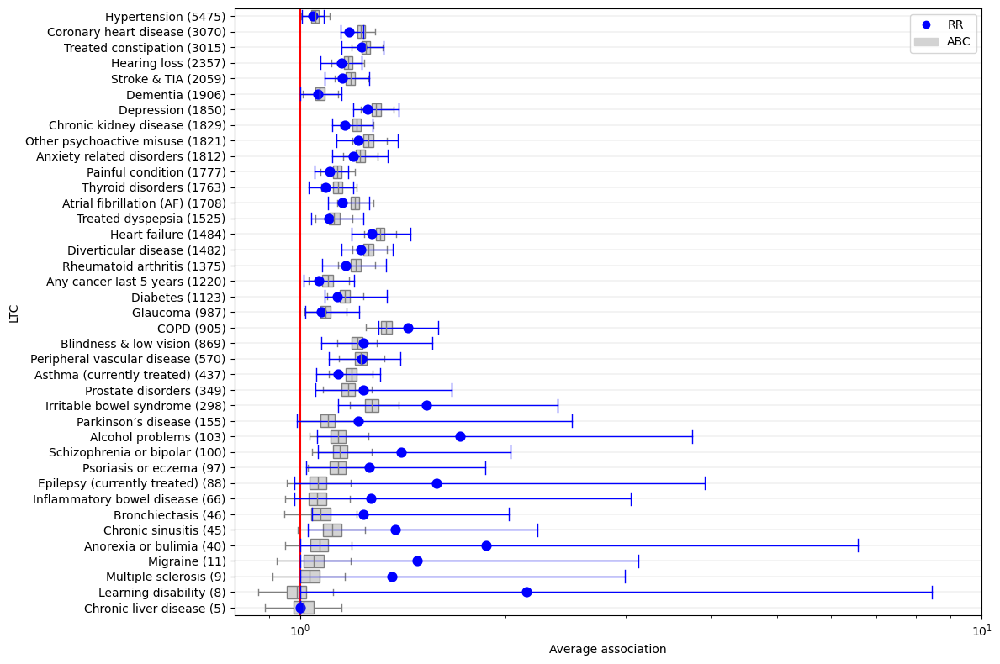

In [193]:
fig, ax = plt.subplots(figsize=(12, 8))
model.plot_node_degrees(ax, catch_all=True, log=True, bootstrapped_RR=bootstrapped_RR, xlim=(0.8,10), **node_deg_kwargs);
fig.tight_layout();
fig.savefig("figs/bootstraped_node_degrees.pdf");

### All associations

In [44]:
# Since all significant associations by ABC are also significant by RR, it's enough to get the 2nd
_, _, all_RR_assoc, _ = get_top_associations(dat_eld, top_N_positive=None, short=True)
print(all_RR_assoc.style.to_latex())

\begin{tabular}{lll}
 & RR_f_sig_CI & a_f_sig_CI \\
Alcohol problems - Learning disability & 29.1 (8.02 - 1.06e+02) & NS \\
Irritable bowel syndrome - Migraine & 11.0 (4.65 - 26.0) & NS \\
Schizophrenia or bipolar - Anorexia or bulimia & 9.01 (3.81 - 21.3) & NS \\
Irritable bowel syndrome - Chronic sinusitis & 5.37 (3.5 - 8.25) & NS \\
COPD - Bronchiectasis & 4.9 (4.22 - 5.71) & 2.22 (1.26 - 4.11) \\
Prostate disorders - Psoriasis or eczema & 4.26 (3.44 - 5.28) & NS \\
Asthma (currently treated) - COPD & 3.86 (3.78 - 3.93) & 3.52 (2.78 - 4.49) \\
Peripheral vascular disease - Anorexia or bulimia & 3.69 (2.55 - 5.33) & NS \\
Treated constipation - Multiple sclerosis & 3.54 (2.57 - 4.88) & NS \\
COPD - Chronic sinusitis & 3.54 (2.86 - 4.39) & NS \\
COPD - Alcohol problems & 3.35 (3.03 - 3.7) & 2.11 (1.36 - 3.61) \\
Depression - Schizophrenia or bipolar & 3.31 (3.15 - 3.48) & 2.64 (1.87 - 3.82) \\
Blindness & low vision - Anorexia or bulimia & 3.11 (2.34 - 4.14) & NS \\
Irritable bowel sy

## Results with other CIs

In [14]:
num_warmup = 500

models = {}
for pval in (0.99, 0.9, 0.5, 0.1, 0.05, 0.01, 0.005, 0.001):
    model = ABCModel(model_name="MLTC_atomic_hyp_mult")
    model.load_fit(df_eld, fname_eld + "0mu" + model.create_file_name(num_warmup), num_warmup=num_warmup, random_seed=1)
    
    triu = np.triu_indices(n=len(model.morb_names), k=1)
    bonferroni = False
    corrected_pval = pval if not bonferroni else pval / len(triu[0])
    print(f"Corrected p-value: {corrected_pval}, min # of samples for assessing: {1/corrected_pval}, required percentile: {corrected_pval * 100 / 2}")
    model.get_results_dataframe(pval, corrected_pval)
    
    models[CI] = model


heatmap_kwargs = dict(norm_kwargs={"extend":"both"}, boundaries=(0.25, 0.5, 0.66, 1, 1.5, 2, 4), cbar=False,
                         beautify_name_func=beautify_name, beautify_name_kwargs={"short":True})
for pval, model in models.items():
    print("Significant RR", model.RRs_signif[triu_l].sum(),
          "Significant RR (Fisher)", model.fishers_sig[triu_l].sum(),
          "Significant ABC", model.r_sig[triu_l].sum())
    print((model.RRs[model.fishers_sig] > max_val).sum())

    fig, axes = plt.subplots(1, 2, figsize=(18,)*2)
    model.plot_heatmap("ABC", title="Associations Beyond Chance (ABC)", ax=axes[0], **heatmap_kwargs)
    model.plot_heatmap("RR", title="Relative Risk (RR)", ax=axes[1], **heatmap_kwargs)
    for i, panel in enumerate("AB"):
        axes[i].annotate(panel, xy=(-0.1, 1.05), xycoords='axes fraction', fontweight='bold', fontsize=15)
    fig.tight_layout()

## Bonferroni correction (CI 95%)

In [9]:
bonf_model, res_bonf = load_model(df_eld, num_warmup=500, fname=fname_eld, pval=0.05, bonferroni=True)

Corrected p-value: 6.41025641025641e-05, min # of samples for assessing: 15600.0, required percentile: 0.003205128205128205


/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/utils.py:134: RuntimeWarning: divide by zero encountered in true_divide
  sigmas = 1 / X - 1 / M + 1 / P_abs[None, :] / P_abs[:, None] - 1 / M ** 2
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/utils.py:136: RuntimeWarning: invalid value encountered in multiply
  RRs_conf = RRs * np.exp(zs[0] * sigmas), RRs * np.exp(zs[1] * sigmas)


Significant associatons:   Fisher (RR): 111 (14.2%), ABC: 155 (19.9%)


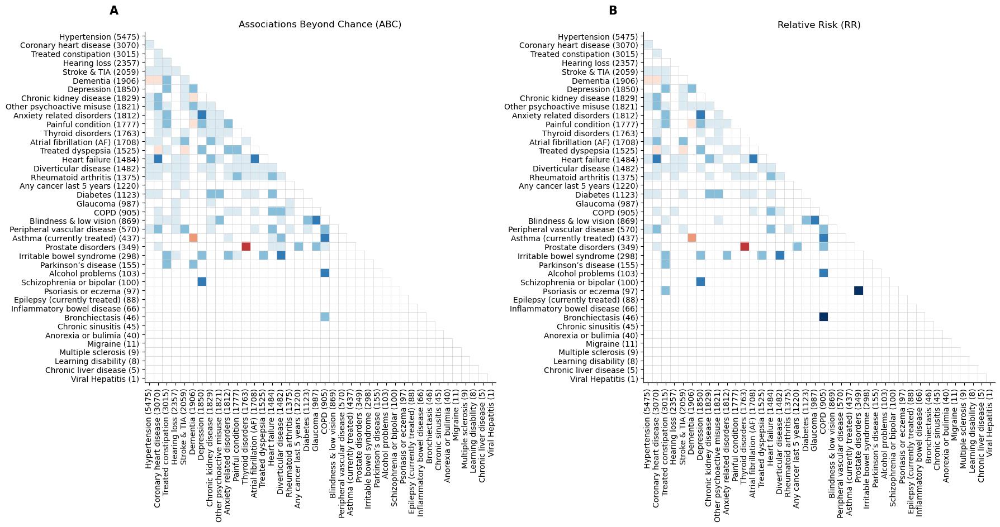

In [10]:
heatmap_kwargs = dict(norm_kwargs={"extend":"both"}, boundaries=(0.25, 0.5, 0.66, 1, 1.5, 2, 4), cbar=False,
                         beautify_name_func=beautify_name, beautify_name_kwargs={"short":True})

fig, axes = plt.subplots(1, 2, figsize=(18,)*2)
bonf_model.plot_heatmap("ABC", title="Associations Beyond Chance (ABC)", ax=axes[0], **heatmap_kwargs)
bonf_model.plot_heatmap("RR", title="Relative Risk (RR)", ax=axes[1], **heatmap_kwargs)
for i, panel in enumerate("AB"):
    axes[i].annotate(panel, xy=(-0.1, 1.05), xycoords='axes fraction', fontweight='bold', fontsize=15)
fig.tight_layout()

# Results WITH sex stratification

Here we stratify old patients (>90yo) into sex cohorts to find the potentially different patterns of multiple long-term conditions (MLTCs) among them.

In [45]:
dfs, labels, fnames, L, Xs, Ps, Ms = stratify(data, "Age-Sex")
fnames = [el for elo in fnames for el in elo]

indices = (18, 19)
ind_dict = {"male": indices[0], "female": indices[1]}
ind_dict_inv = {val: key for key, val in ind_dict.items()}

In [46]:
LTC_prev_df = pd.DataFrame(columns=["i"], index=names)
LTC_prev_df["i"] = range(len(LTC_prev_df))

for name, ind in ind_dict.items():
    LTC_prev_df["Counts_"+name] = Ps[ind]
    LTC_prev_df["Prev_"+name] = Ps[ind] / Ms[ind]
LTC_prev_df["Counts"] = LTC_prev_df["Counts_male"] + LTC_prev_df["Counts_female"]
LTC_prev_df["Prev"] = LTC_prev_df["Counts"] / (Ms[indices[0]] + Ms[indices[1]])
    
LTC_prev_df["diff_counts"] = LTC_prev_df["Counts_male"] - LTC_prev_df["Counts_female"]
LTC_prev_df["diff_prev"] = LTC_prev_df["Prev_male"] - LTC_prev_df["Prev_female"]
LTC_prev_df.sort_values(by="diff_prev")

,i,Counts_male,Prev_male,Counts_female,Prev_female,Counts,Prev,diff_counts,diff_prev
Hypertension,0,1142,0.375782,4333,0.483055,5475,0.455908,-3191,-0.107273
ThyroidDisorders,7,206,0.067785,1557,0.173579,1763,0.146807,-1351,-0.105793
AnxietyEtc,11,271,0.089174,1541,0.171795,1812,0.150887,-1270,-0.082621
Dementia,26,310,0.102007,1596,0.177926,1906,0.158714,-1286,-0.075919
Depression,1,299,0.098388,1551,0.172910,1850,0.154051,-1252,-0.074522
PainfulCondition,2,309,0.101678,1468,0.163657,1777,0.147972,-1159,-0.061978
OtherPsychoactiveMisuse,15,349,0.114840,1472,0.164103,1821,0.151636,-1123,-0.049262
TreatedConstipation,16,672,0.221125,2343,0.261204,3015,0.251062,-1671,-0.040079
TreatedDyspepsia,5,306,0.100691,1219,0.135897,1525,0.126988,-913,-0.035206
Diverticular,19,311,0.102336,1171,0.130546,1482,0.123407,-860,-0.028210


In [47]:
conds_display = LTC_prev_df.copy()

def display(x):
    return f" ({100*x:.2g}%)"

conds_display["Counts_t"] = LTC_prev_df["Counts"].astype(str) + LTC_prev_df["Prev"].apply(display)
conds_display["Counts_m"] = LTC_prev_df["Counts_male"].astype(str) + LTC_prev_df["Prev_male"].apply(display)
conds_display["Counts_f"] = LTC_prev_df["Counts_female"].astype(str) + LTC_prev_df["Prev_female"].apply(display)

conds_display.loc[(LTC_prev_df["Counts"] < 5) & (LTC_prev_df["Counts"] != 0), "Counts_t"] = "<5 (<0.04%)"
conds_display.loc[(LTC_prev_df["Counts_male"] < 5) & (LTC_prev_df["Counts_male"] != 0), "Counts_m"] = "<5 (<0.2%)"
conds_display.loc[(LTC_prev_df["Counts_female"] < 5) & (LTC_prev_df["Counts_female"] != 0), "Counts_f"] = "<5 (<0.06%)"
conds_display.sort_values(by="Counts", ascending=False).loc[:, ["Counts_t", "Counts_m", "Counts_f"]]

conds_display.index = [beautify_name(name) for name in conds_display.index]
conds_display.sort_values(by="Counts", ascending=False).loc[:, ["Counts_t", "Counts_m", "Counts_f"]]

,Counts_t,Counts_m,Counts_f
Hypertension,5475 (46%),1142 (38%),4333 (48%)
Coronary heart disease (CHD),3070 (26%),900 (30%),2170 (24%)
Treated constipation,3015 (25%),672 (22%),2343 (26%)
Hearing loss,2357 (20%),646 (21%),1711 (19%)
Stroke & transient ischaemic attack (TIA),2059 (17%),568 (19%),1491 (17%)
Dementia,1906 (16%),310 (10%),1596 (18%)
Depression,1850 (15%),299 (9.8%),1551 (17%)
Chronic kidney disease (CKD),1829 (15%),454 (15%),1375 (15%)
Other psychoactive misuse,1821 (15%),349 (11%),1472 (16%)
"Anxiety & other neurotic, stress related & somatoform disorders",1812 (15%),271 (8.9%),1541 (17%)


In [48]:
print(conds_display.sort_values(by="Counts", ascending=False).loc[:, ["Counts_t", "Counts_m", "Counts_f"]].to_latex())

\begin{tabular}{llll}
\toprule
{} &     Counts\_t &    Counts\_m &     Counts\_f \\
\midrule
Hypertension                                       &   5475 (46\%) &  1142 (38\%) &   4333 (48\%) \\
Coronary heart disease (CHD)                       &   3070 (26\%) &   900 (30\%) &   2170 (24\%) \\
Treated constipation                               &   3015 (25\%) &   672 (22\%) &   2343 (26\%) \\
Hearing loss                                       &   2357 (20\%) &   646 (21\%) &   1711 (19\%) \\
Stroke \& transient ischaemic attack (TIA)          &   2059 (17\%) &   568 (19\%) &   1491 (17\%) \\
Dementia                                           &   1906 (16\%) &   310 (10\%) &   1596 (18\%) \\
Depression                                         &   1850 (15\%) &  299 (9.8\%) &   1551 (17\%) \\
Chronic kidney disease (CKD)                       &   1829 (15\%) &   454 (15\%) &   1375 (15\%) \\
Other psychoactive misuse                          &   1821 (15\%) &   349 (11\%) &   1472 (16\%) 

/tmp/ipykernel_23694/3322290304.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(conds_display.sort_values(by="Counts", ascending=False).loc[:, ["Counts_t", "Counts_m", "Counts_f"]].to_latex())


## Survivorship bias

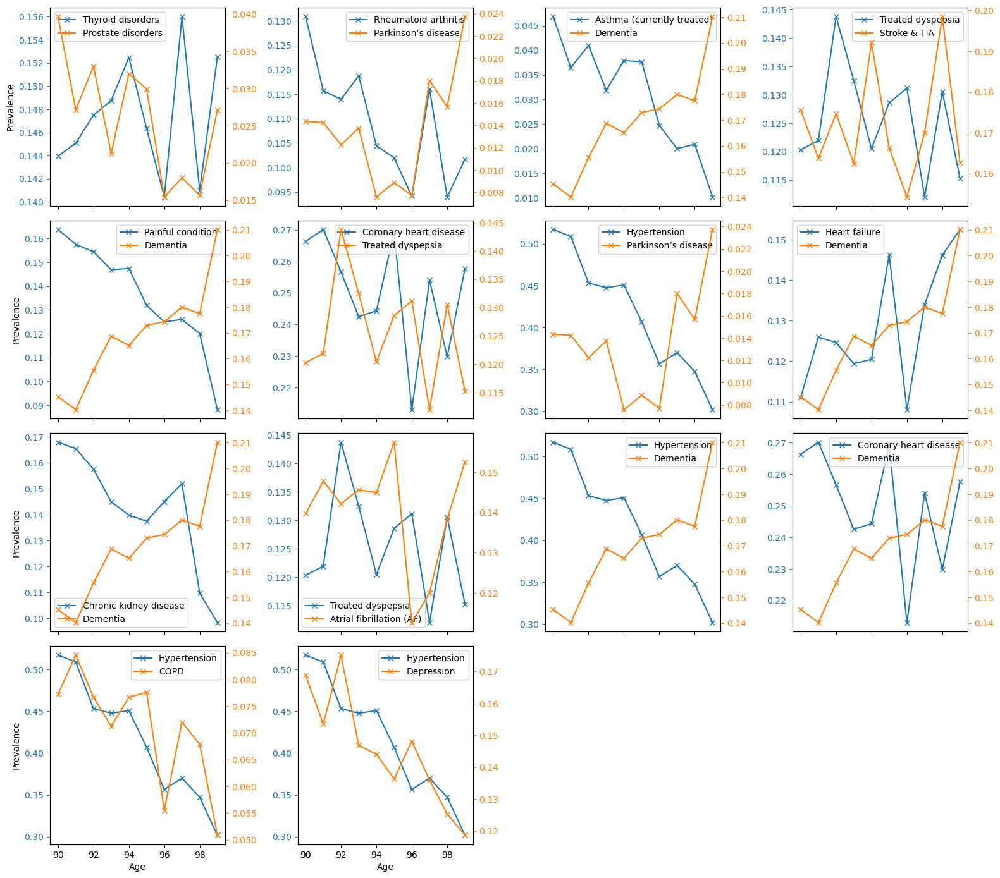

In [49]:
df_eld = data[data["Age"] >= 90]

pairs_list = [
    ["ThyroidDisorders", "Prostate"],
    ["RheumatoidArthritisEtc", "Parkinsons"],
    ["ActiveAsthma", "Dementia"],
    ["TreatedDyspepsia", "StrokeTIA"],
    ["PainfulCondition", "Dementia"],
    ["CHD", "TreatedDyspepsia"],
    ["Hypertension", "Parkinsons"],
    ["HeartFailure", "Dementia"],
    ["CKD", "Dementia"],
    ["TreatedDyspepsia", "AtrialFib"],
    ["Hypertension", "Dementia"],
    ["CHD", "Dementia"],
    ["Hypertension", "COPD"],
    ["Hypertension", "Depression"]
]

plots_per_line = 4
n_lines = int(np.ceil(len(pairs_list) / plots_per_line))

fig, axes = plt.subplots(n_lines, plots_per_line, figsize=(4*plots_per_line, 3.5*n_lines), sharex=True)
for l, pair in enumerate(pairs_list):
    ax = axes[int(l/plots_per_line)][l%plots_per_line]
    axos = ax, ax.twinx()
    
    marker, colors = "x", ("C0", "C1")
    for ax_morb, morb, color in zip(axos, pair, colors):
        # ax_morb = ax  # .twinx();
        counts = []
        ages = sorted(df_eld["Age"].unique())
        for age in ages:
            counts.append((dfo_age := df_eld[df_eld["Age"] == age])[morb].sum() / len(dfo_age))
        ax_morb.plot(ages, counts, label=morb, marker=marker, color=color);

    ax.legend(handles=[Line2D([], [], color=color, marker=marker, label=beautify_name(label, short=True)) for color, label in zip(colors, pair)])
    ax.set(xlabel="Age") if int(l/plots_per_line) == n_lines - 1 else None
    ax.set(ylabel="Prevalence") if l%plots_per_line == 0 else None  # , title=title);
    ax.spines["left"].set_color("C0")
    ax.spines["right"].set_color("C1")
    ax.tick_params(axis="y", colors='C0')
    axos[1].tick_params(axis="y", colors='C1')
    
[[fig.delaxes(axes[i][j]) for i in range(n_lines) if i*plots_per_line + j >= len(pairs_list)] for j in range(plots_per_line)]
fig.tight_layout();

## Loading results

In [18]:
num_warmup = 500
num_samples = 20000
num_chains = 5
pval = 0.01
corrected_pval = 0.01

models, dats = {}, {}
for l in range(len(dfs)):
    if l not in indices:
        continue
    print(l, end=" ")
    
    model = ABCModel()
    model.load_fit(dfs[l], fnames[l] + model.create_file_name(num_warmup), column_names=names,
                   num_warmup=num_warmup, random_seed=1, num_samples=int(num_samples/num_chains), num_chains=num_chains)
    
    dats[l] = model.get_results_dataframe(pval, corrected_pval)
    dats[l]["i_abs"] = dats[l]["namei"].apply(lambda x: identify_LTC(x, names)[0])
    dats[l]["j_abs"] = dats[l]["namej"].apply(lambda x: identify_LTC(x, names)[0])
    
    triu_l = np.triu_indices(n=len(model.morb_names), k=1)
    print(f"Significant ({ind_dict_inv[l]}):   Fisher: {(fish_sig:= dats[l]['fisher_sig'].sum()):.0f} ({100*fish_sig/len(triu_l[0]):.1f}%), "
      f"ABC: {(a_sig := dats[l]['a_sig'].sum()):3.0f} ({100*a_sig/len(triu_l[0]):.1f}%)")
    
    models[l] = model
    
dats = {name: dats[ind] for name, ind in ind_dict.items()}

18 Removing 1 LTCs without co-occurrences. Using 39 LTCs only.
Model '/disk/scratch/gromero/output/Age-Sex10-9-0_MLTC_atomic_hyp_mult_wu500' not found, fitting new model...
Shape of co-occurrence matrix: (39, 39)
Sampling with params: {num_chains: 5, num_samples: 4000, num_warmup: 500}


21:26:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

chain 5 |          | 00:00 Status

21:28:41 - cmdstanpy - INFO - CmdStan done processing.
21:28:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 36, column 6 to column 53)
	Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 36, column 6 to column 53)
	Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 36, column 6 to column 53)
	Exception: beta_lpdf: Second shape parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 28, column 4 to column 55)
Exception: lognormal_l


Elapsed time: 00 hours, 02 minutes, 45 seconds.
Processing csv files: /tmp/tmptdaxu7wa/MLTC_atomic_hyp_multky0w4t2d/MLTC_atomic_hyp_mult-20240401212600_1.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_multky0w4t2d/MLTC_atomic_hyp_mult-20240401212600_2.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_multky0w4t2d/MLTC_atomic_hyp_mult-20240401212600_3.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_multky0w4t2d/MLTC_atomic_hyp_mult-20240401212600_4.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_multky0w4t2d/MLTC_atomic_hyp_mult-20240401212600_5.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.

                       Mean      MCSE     StdDev            5%           50%  \
lp__          -1.132190e+06 

/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/utils.py:134: RuntimeWarning: divide by zero encountered in true_divide
  sigmas = 1 / X - 1 / M + 1 / P_abs[None, :] / P_abs[:, None] - 1 / M ** 2
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/utils.py:136: RuntimeWarning: invalid value encountered in multiply
  RRs_conf = RRs * np.exp(zs[0] * sigmas), RRs * np.exp(zs[1] * sigmas)


Significant (male):   Fisher: 113 (15.2%), ABC:  72 (9.7%)
19 Removing 2 LTCs without co-occurrences. Using 38 LTCs only.
Model '/disk/scratch/gromero/output/Age-Sex10-9-1_MLTC_atomic_hyp_mult_wu500' not found, fitting new model...
Shape of co-occurrence matrix: (38, 38)
Sampling with params: {num_chains: 5, num_samples: 4000, num_warmup: 500}


21:35:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

chain 5 |          | 00:00 Status

21:38:23 - cmdstanpy - INFO - CmdStan done processing.
21:38:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 36, column 6 to column 53)
	Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 36, column 6 to column 53)
	Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 36, column 6 to column 53)
	Exception: beta_lpdf: Second shape parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 28, column 4 to column 55)
	Exception: lognormal_


Elapsed time: 00 hours, 02 minutes, 47 seconds.
Processing csv files: /tmp/tmptdaxu7wa/MLTC_atomic_hyp_mult5iekqdze/MLTC_atomic_hyp_mult-20240401213541_1.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_mult5iekqdze/MLTC_atomic_hyp_mult-20240401213541_2.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_mult5iekqdze/MLTC_atomic_hyp_mult-20240401213541_3.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_mult5iekqdze/MLTC_atomic_hyp_mult-20240401213541_4.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_mult5iekqdze/MLTC_atomic_hyp_mult-20240401213541_5.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.

                       Mean      MCSE     StdDev            5%           50%  \
lp__          -3.327790e+06 

/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/utils.py:134: RuntimeWarning: divide by zero encountered in true_divide
  sigmas = 1 / X - 1 / M + 1 / P_abs[None, :] / P_abs[:, None] - 1 / M ** 2
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/utils.py:136: RuntimeWarning: invalid value encountered in multiply
  RRs_conf = RRs * np.exp(zs[0] * sigmas), RRs * np.exp(zs[1] * sigmas)


Significant (female):   Fisher: 155 (22.0%), ABC: 124 (17.6%)


### Top associations

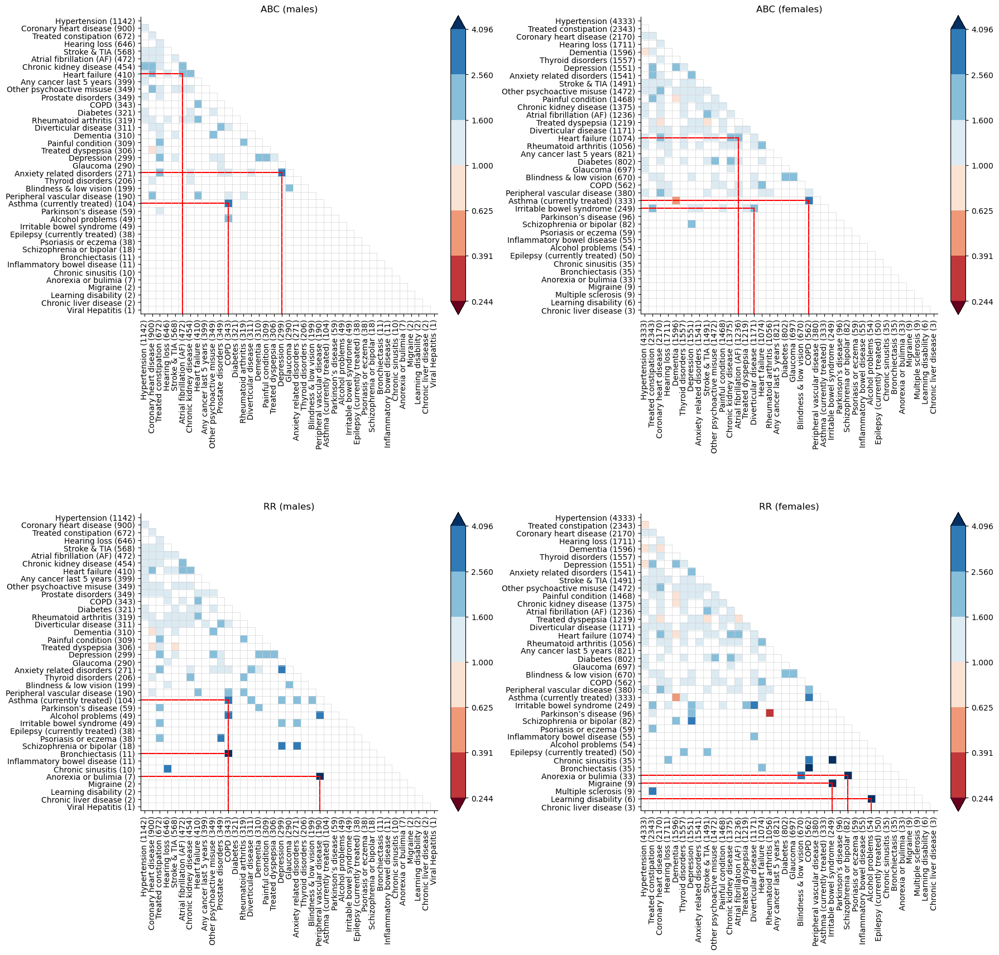

In [51]:
# heatmap_kwargs = {"norm_kwargs": {"extend":"both"}, "max_val": max_val, "cbar_ticklabels": ["0.3", "0.5", "0.7", "1", "2", "3", "4", "5"]}#[""]*8 + [f"${el}\cdot 10^0" for el in (1, 2, 3, 4, 5)], }
heatmap_kwargs = dict(norm_kwargs={"extend":"both"}, boundaries=np.power(1.6, np.arange(-3, 4)), highlight_top=True,
                         beautify_name_func=beautify_name, beautify_name_kwargs={"short":True})

fig, axes = plt.subplots(2, 2, figsize=(18,)*2)
models[ind_dict["male"]].plot_heatmap("ABC", title="ABC (males)", ax=axes[0, 0], **heatmap_kwargs)
models[ind_dict["female"]].plot_heatmap("ABC", title="ABC (females)", ax=axes[0, 1], **heatmap_kwargs)
models[ind_dict["male"]].plot_heatmap("RR", title="RR (males)", ax=axes[1, 0], **heatmap_kwargs)
models[ind_dict["female"]].plot_heatmap("RR", title="RR (females)", ax=axes[1, 1], **heatmap_kwargs)
fig.tight_layout()

In [52]:
tops_male, tops_female = [get_top_associations(dats[index]) for index in ind_dict.keys()]

In [53]:
tops_male[0]

,a_f_sig_CI,RR_f_sig_CI
"Depression - Anxiety & other neurotic, stress related & somatoform disorders",3.32 (2.59 - 4.4),3.64 (3.55 - 3.73)
Asthma (currently treated) - Chronic obstructive pulmonary disease (COPD),3.01 (2.13 - 4.64),4.0 (3.79 - 4.23)
Atrial fibrillation (AF) - Heart failure,2.24 (1.84 - 2.8),2.26 (2.22 - 2.3)
Chronic kidney disease (CKD) - Heart failure,2.22 (1.77 - 2.76),2.2 (2.16 - 2.24)
Depression - Dementia,2.19 (1.61 - 2.94),2.36 (2.28 - 2.44)
Coronary heart disease (CHD) - Heart failure,2.07 (1.76 - 2.44),2.0 (1.98 - 2.02)
"Anxiety & other neurotic, stress related & somatoform disorders - Treated constipation",2.04 (1.64 - 2.57),2.07 (2.03 - 2.11)
Depression - Treated constipation,1.99 (1.58 - 2.48),1.98 (1.94 - 2.02)
Depression - Painful condition,1.98 (1.44 - 2.73),2.14 (2.06 - 2.22)
Glaucoma - Blindness & low vision,1.94 (1.34 - 2.9),2.32 (2.19 - 2.45)


In [54]:
tops_female[0]

,a_f_sig_CI,RR_f_sig_CI
Asthma (currently treated) - Chronic obstructive pulmonary disease (COPD),3.29 (2.38 - 4.32),3.83 (3.71 - 3.96)
Irritable bowel syndrome (IBS) - Diverticular disease of intestine,2.47 (1.87 - 3.26),2.74 (2.66 - 2.82)
Atrial fibrillation (AF) - Heart failure,2.37 (2.07 - 2.73),2.32 (2.3 - 2.33)
Coronary heart disease (CHD) - Heart failure,2.31 (2.05 - 2.54),2.17 (2.17 - 2.18)
Depression - Schizophrenia (and related non-organic psychosis) or bipolar disorder,2.31 (1.62 - 3.54),3.1 (2.93 - 3.29)
Glaucoma - Blindness & low vision,2.23 (1.72 - 2.76),2.3 (2.26 - 2.35)
"Depression - Anxiety & other neurotic, stress related & somatoform disorders",2.22 (2.0 - 2.47),2.14 (2.13 - 2.14)
Diabetes - Chronic kidney disease (CKD),2.0 (1.67 - 2.32),1.94 (1.92 - 1.96)
Chronic obstructive pulmonary disease (COPD) - Heart failure,1.92 (1.49 - 2.33),1.89 (1.85 - 1.93)
Coronary heart disease (CHD) - Other psychoactive misuse,1.86 (1.67 - 2.04),1.76 (1.75 - 1.76)


In [55]:
tops_male[2]

,RR_f_sig_CI,a_f_sig_CI
Peripheral vascular disease - Anorexia or bulimia,6.85 (2.9 - 16.2),NS
Chronic obstructive pulmonary disease (COPD) - Bronchiectasis,5.64 (3.9 - 8.14),NS
Asthma (currently treated) - Chronic obstructive pulmonary disease (COPD),4.0 (3.79 - 4.23),3.01 (2.13 - 4.64)
Depression - Schizophrenia (and related non-organic psychosis) or bipolar disorder,3.95 (2.74 - 5.71),NS
"Anxiety & other neurotic, stress related & somatoform disorders - Schizophrenia (and related non-organic psychosis) or bipolar disorder",3.74 (2.43 - 5.74),NS
"Depression - Anxiety & other neurotic, stress related & somatoform disorders",3.64 (3.55 - 3.73),3.32 (2.59 - 4.4)
Chronic obstructive pulmonary disease (COPD) - Alcohol problems,3.25 (2.82 - 3.75),1.93 (1.14 - 3.58)
Hearing loss - Chronic sinusitis,2.82 (1.84 - 4.33),NS
Prostate disorders - Psoriasis or eczema,2.75 (2.22 - 3.41),NS
Alcohol problems - Peripheral vascular disease,2.61 (1.89 - 3.6),NS


In [56]:
print(tops_male[2].to_latex())

\begin{tabular}{lll}
\toprule
{} &         RR\_f\_sig\_CI &          a\_f\_sig\_CI \\
\midrule
Peripheral vascular disease - Anorexia or bulimia  &   6.85 (2.9 - 16.2) &                  NS \\
Chronic obstructive pulmonary disease (COPD) - ... &   5.64 (3.9 - 8.14) &                  NS \\
Asthma (currently treated) - Chronic obstructiv... &   4.0 (3.79 - 4.23) &  3.01 (2.13 - 4.64) \\
Depression - Schizophrenia (and related non-org... &  3.95 (2.74 - 5.71) &                  NS \\
Anxiety \& other neurotic, stress related \& soma... &  3.74 (2.43 - 5.74) &                  NS \\
Depression - Anxiety \& other neurotic, stress r... &  3.64 (3.55 - 3.73) &   3.32 (2.59 - 4.4) \\
Chronic obstructive pulmonary disease (COPD) - ... &  3.25 (2.82 - 3.75) &  1.93 (1.14 - 3.58) \\
Hearing loss - Chronic sinusitis                   &  2.82 (1.84 - 4.33) &                  NS \\
Prostate disorders - Psoriasis or eczema           &  2.75 (2.22 - 3.41) &                  NS \\
Alcohol problems - P

/tmp/ipykernel_23694/2585172274.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(tops_male[2].to_latex())


In [57]:
tops_female[2]

,RR_f_sig_CI,a_f_sig_CI
Alcohol problems - Learning disability,55.4 (15.2 - 2.02e+02),NS
Irritable bowel syndrome (IBS) - Migraine,12.0 (5.08 - 28.4),NS
Schizophrenia (and related non-organic psychosis) or bipolar disorder - Anorexia or bulimia,9.94 (4.21 - 23.5),NS
Irritable bowel syndrome (IBS) - Chronic sinusitis,5.15 (3.07 - 8.61),NS
Chronic obstructive pulmonary disease (COPD) - Bronchiectasis,4.56 (3.53 - 5.9),NS
Asthma (currently treated) - Chronic obstructive pulmonary disease (COPD),3.83 (3.71 - 3.96),3.29 (2.38 - 4.32)
Chronic obstructive pulmonary disease (COPD) - Chronic sinusitis,3.65 (2.64 - 5.03),NS
Treated constipation - Multiple sclerosis,3.4 (2.47 - 4.69),NS
Depression - Schizophrenia (and related non-organic psychosis) or bipolar disorder,3.1 (2.93 - 3.29),2.31 (1.62 - 3.54)
Blindness & low vision - Anorexia or bulimia,2.84 (1.97 - 4.1),NS


In [58]:
print(tops_female[2].to_latex())

\begin{tabular}{lll}
\toprule
{} &             RR\_f\_sig\_CI &          a\_f\_sig\_CI \\
\midrule
Alcohol problems - Learning disability             &  55.4 (15.2 - 2.02e+02) &                  NS \\
Irritable bowel syndrome (IBS) - Migraine          &      12.0 (5.08 - 28.4) &                  NS \\
Schizophrenia (and related non-organic psychosi... &      9.94 (4.21 - 23.5) &                  NS \\
Irritable bowel syndrome (IBS) - Chronic sinusitis &      5.15 (3.07 - 8.61) &                  NS \\
Chronic obstructive pulmonary disease (COPD) - ... &       4.56 (3.53 - 5.9) &                  NS \\
Asthma (currently treated) - Chronic obstructiv... &      3.83 (3.71 - 3.96) &  3.29 (2.38 - 4.32) \\
Chronic obstructive pulmonary disease (COPD) - ... &      3.65 (2.64 - 5.03) &                  NS \\
Treated constipation - Multiple sclerosis          &       3.4 (2.47 - 4.69) &                  NS \\
Depression - Schizophrenia (and related non-org... &       3.1 (2.93 - 3.29) &  2.31 

/tmp/ipykernel_23694/142246805.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(tops_female[2].to_latex())


In [59]:
tops_male[3]

,RR_f_sig_CI,a_f_sig_CI
Coronary heart disease (CHD) - Treated dyspepsia,0.629 (0.602 - 0.658),0.67 (0.482 - 0.905)
Treated dyspepsia - Stroke & transient ischaemic attack (TIA),0.647 (0.604 - 0.693),NS
Coronary heart disease (CHD) - Dementia,0.784 (0.757 - 0.812),NS


In [60]:
print(tops_male[3].to_latex())

\begin{tabular}{lll}
\toprule
{} &            RR\_f\_sig\_CI &            a\_f\_sig\_CI \\
\midrule
Coronary heart disease (CHD) - Treated dyspepsia   &  0.629 (0.602 - 0.658) &  0.67 (0.482 - 0.905) \\
Treated dyspepsia - Stroke \& transient ischaemi... &  0.647 (0.604 - 0.693) &                    NS \\
Coronary heart disease (CHD) - Dementia            &  0.784 (0.757 - 0.812) &                    NS \\
\bottomrule
\end{tabular}



/tmp/ipykernel_23694/352419149.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(tops_male[3].to_latex())


In [61]:
tops_female[3]

,RR_f_sig_CI,a_f_sig_CI
"Rheumatoid arthritis, other inflammatory polyarthropathies & systematic connective tissue disorders - Parkinson’s disease",0.265 (0.113 - 0.626),NS
Asthma (currently treated) - Dementia,0.456 (0.414 - 0.501),0.564 (0.384 - 0.836)
Painful condition - Dementia,0.662 (0.653 - 0.672),0.682 (0.559 - 0.824)
Treated dyspepsia - Stroke & transient ischaemic attack (TIA),0.686 (0.674 - 0.699),0.705 (0.58 - 0.879)
Coronary heart disease (CHD) - Treated dyspepsia,0.8 (0.792 - 0.809),0.806 (0.694 - 0.971)
Treated dyspepsia - Atrial fibrillation (AF),0.804 (0.789 - 0.819),NS
Hypertension - Dementia,0.807 (0.804 - 0.81),0.788 (0.714 - 0.89)
Heart failure - Dementia,0.827 (0.814 - 0.84),NS
Chronic kidney disease (CKD) - Dementia,0.834 (0.824 - 0.844),NS
Coronary heart disease (CHD) - Dementia,0.868 (0.861 - 0.874),NS


In [62]:
print(tops_female[3].to_latex())

\begin{tabular}{lll}
\toprule
{} &            RR\_f\_sig\_CI &             a\_f\_sig\_CI \\
\midrule
Rheumatoid arthritis, other inflammatory polyar... &  0.265 (0.113 - 0.626) &                     NS \\
Asthma (currently treated) - Dementia              &  0.456 (0.414 - 0.501) &  0.564 (0.384 - 0.836) \\
Painful condition - Dementia                       &  0.662 (0.653 - 0.672) &  0.682 (0.559 - 0.824) \\
Treated dyspepsia - Stroke \& transient ischaemi... &  0.686 (0.674 - 0.699) &   0.705 (0.58 - 0.879) \\
Coronary heart disease (CHD) - Treated dyspepsia   &    0.8 (0.792 - 0.809) &  0.806 (0.694 - 0.971) \\
Treated dyspepsia - Atrial fibrillation (AF)       &  0.804 (0.789 - 0.819) &                     NS \\
Hypertension - Dementia                            &   0.807 (0.804 - 0.81) &   0.788 (0.714 - 0.89) \\
Heart failure - Dementia                           &   0.827 (0.814 - 0.84) &                     NS \\
Chronic kidney disease (CKD) - Dementia            &  0.834 (0.824

/tmp/ipykernel_23694/1960424146.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(tops_female[3].to_latex())


72/741 data points
0/741 data points
41/741 data points
628/741 data points


/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:170: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=data.sort_values(by="Pi"), x="RR", y=col, hue="Pi", ax=ax, palette="coolwarm")
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(xlim=lim if xlim is None else xlim, ylim=lim if ylim is None else ylim,
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(xlim=lim if xlim is None else xlim, ylim=lim if ylim is None else ylim,
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive left xlim on a log-scaled 

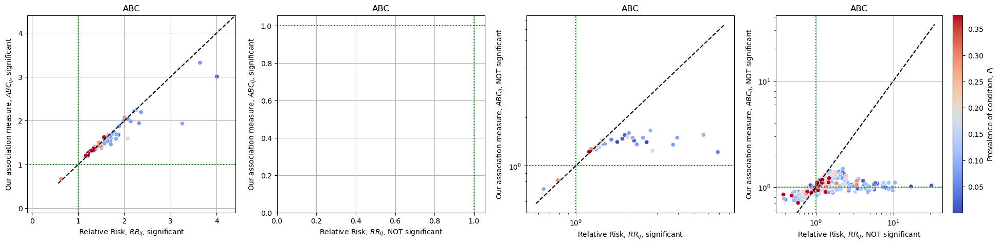

In [63]:
index = 18
dat = dats["male"]

fig, axes = plt.subplots(1,4, figsize=(24,5)) #, sharex=True) #, sharey=True)
plot_ABC_vs_RR(axes[0], dat, log=False)  # xlim=[0, 5.1], ylim=[0, 4])
plot_ABC_vs_RR(axes[1], dat, RR_conf=False, log=False, xlim=0, ylim=0)
plot_ABC_vs_RR(axes[2], dat, a_conf=False, log=True, xlim=0, ylim=0)
plot_ABC_vs_RR(axes[3], dat, RR_conf=False, a_conf=False, colorbar=True, log=True, xlim=0, ylim=0)

123/703 data points
1/703 data points
32/703 data points
547/703 data points


/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(xlim=lim if xlim is None else xlim, ylim=lim if ylim is None else ylim,
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(xlim=lim if xlim is None else xlim, ylim=lim if ylim is None else ylim,
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(xlim=lim if xlim is None else xlim, ylim=lim if ylim is None else ylim,
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive bottom ylim on a l

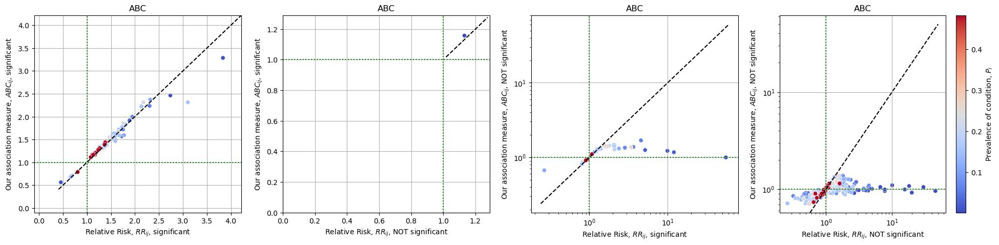

In [64]:
index = 19
dat = dats["female"]

fig, axes = plt.subplots(1,4, figsize=(24,5)) #, sharex=True) #, sharey=True)
plot_ABC_vs_RR(axes[0], dat, log=False)  # xlim=[0, 5.1], ylim=[0, 4])
plot_ABC_vs_RR(axes[1], dat, RR_conf=False, log=False, xlim=0, ylim=0)
plot_ABC_vs_RR(axes[2], dat, a_conf=False, log=True, xlim=0, ylim=0)
plot_ABC_vs_RR(axes[3], dat, RR_conf=False, a_conf=False, colorbar=True, log=True, xlim=0, ylim=0)

### Network visualisation and analysis

In [65]:
plot_kwargs = {"communities": False, "figsize":(600, 550), "interactive":True}
male_G_ABC, ax1, _ = build_and_plot_network(dats["male"], var="ABC", **plot_kwargs)
female_G_ABC, ax2, _ = build_and_plot_network(dats["female"], "ABC", **plot_kwargs)
male_G_RR, ax3, _ = build_and_plot_network(dats["male"], var="RR", title="RR males", **plot_kwargs)
female_G_RR, ax4, _ = build_and_plot_network(dats["female"], "RR", title="RR females", **plot_kwargs)

gr = grid([[ax1, ax2], [ax3, ax4]])
show(gr)

Original size: 72 edges, 27 nodes, filtered size: 72 edges, 27 nodes.
Original size: 124 edges, 26 nodes, filtered size: 124 edges, 26 nodes.
Original size: 113 edges, 33 nodes, filtered size: 113 edges, 33 nodes.
Original size: 155 edges, 37 nodes, filtered size: 155 edges, 37 nodes.


In [66]:
plot_kwargs = {"communities": False, "figsize":(600, 550), "layout":nx.circular_layout, "span":12}

male_G_ABC, ax1, _ = build_and_plot_network(dats["male"], var="ABC", **plot_kwargs)
female_G_ABC, ax2, _ = build_and_plot_network(dats["female"], "ABC", **plot_kwargs)
male_G_RR, ax3, _ = build_and_plot_network(dats["male"], var="RR", title="RR males", **plot_kwargs)
female_G_RR, ax4, _ = build_and_plot_network(dats["female"], "RR", title="RR females", **plot_kwargs)

gr = grid([[ax1, ax2], [ax3, ax4]])
show(gr)

Original size: 72 edges, 27 nodes, filtered size: 72 edges, 27 nodes.
Original size: 124 edges, 26 nodes, filtered size: 124 edges, 26 nodes.
Original size: 113 edges, 33 nodes, filtered size: 113 edges, 33 nodes.
Original size: 155 edges, 37 nodes, filtered size: 155 edges, 37 nodes.


In [67]:
plot_kwargs = {"communities": True, "layout":nx.circular_layout, "figsize":(600, 550), "build_kwargs":{"cutoff":0.25}, "span":12}

male_G_ABC, ax1, _ = build_and_plot_network(dats["male"], var="ABC", **plot_kwargs)
female_G_ABC, ax2, _ = build_and_plot_network(dats["female"], "ABC", **plot_kwargs)
male_G_RR, ax3, _ = build_and_plot_network(dats["male"], var="RR", title="RR males", **plot_kwargs)
female_G_RR, ax4, _ = build_and_plot_network(dats["female"], "RR", title="RR females", **plot_kwargs)

gr = grid([[ax1, ax2], [ax3, ax4]])
show(gr)

Original size: 72 edges, 27 nodes, filtered size: 67 edges, 26 nodes.
Modularity: 0.3982417504629121 coverage-performance (0.746268656716418, 0.7753846153846153)
Original size: 124 edges, 26 nodes, filtered size: 87 edges, 26 nodes.
Modularity: 0.39368790364077344 coverage-performance (0.6666666666666666, 0.8061538461538461)
Original size: 113 edges, 33 nodes, filtered size: 96 edges, 33 nodes.
Modularity: 0.45616413196050914 coverage-performance (0.6145833333333334, 0.8068181818181818)
Original size: 155 edges, 37 nodes, filtered size: 101 edges, 37 nodes.
Modularity: 0.5608824890058164 coverage-performance (0.7029702970297029, 0.8138138138138138)


In [68]:
plot_kwargs = {"communities": True, "figsize":(600, 550), "interactive":True, "prev_size":True, "community_weight":True, "span":9}

male_G_ABC, ax1, comm_male_ABC = build_and_plot_network(dats["male"], var="ABC", **plot_kwargs)
female_G_ABC, ax2, comm_female_ABC = build_and_plot_network(dats["female"], "ABC", **plot_kwargs)
male_G_RR, ax3, comm_male_RR = build_and_plot_network(dats["male"], var="RR", title="RR males", **plot_kwargs)
female_G_RR, ax4, comm_female_RR = build_and_plot_network(dats["female"], "RR", title="RR females", **plot_kwargs)

gr = grid([[ax1, ax2], [ax3, ax4]])
show(gr)

Original size: 72 edges, 27 nodes, filtered size: 72 edges, 27 nodes.
Modularity: 0.37946173742995504 coverage-performance (0.7222222222222222, 0.7549857549857549)
Original size: 124 edges, 26 nodes, filtered size: 124 edges, 26 nodes.
Modularity: 0.33614295815643735 coverage-performance (0.6209677419354839, 0.7907692307692308)
Original size: 113 edges, 33 nodes, filtered size: 113 edges, 33 nodes.
Modularity: 0.4475522988528121 coverage-performance (0.5929203539823009, 0.8049242424242424)
Original size: 155 edges, 37 nodes, filtered size: 155 edges, 37 nodes.
Modularity: 0.5008438444639234 coverage-performance (0.6129032258064516, 0.7447447447447447)


In [69]:
comm_male_ABC, comm_male_RR

([['Hypertension',
   'CHD',
   'Diabetes',
   'ThyroidDisorders',
   'RheumatoidArthritisEtc',
   'HearingLoss',
   'AnyCancer_Last5Yrs',
   'OtherPsychoactiveMisuse',
   'StrokeTIA',
   'CKD',
   'AtrialFib',
   'PeripheralVascularDisease',
   'HeartFailure'],
  ['Depression',
   'PainfulCondition',
   'Parkinsons',
   'TreatedDyspepsia',
   'AnxietyEtc',
   'TreatedConstipation',
   'Diverticular',
   'Prostate',
   'Dementia'],
  ['COPD', 'ActiveAsthma', 'AlcoholProblems'],
  ['Glaucoma', 'Blindness']],
 [['Hypertension',
   'CHD',
   'Diabetes',
   'ThyroidDisorders',
   'RheumatoidArthritisEtc',
   'OtherPsychoactiveMisuse',
   'StrokeTIA',
   'CKD',
   'AtrialFib',
   'HeartFailure'],
  ['Depression',
   'PainfulCondition',
   'Parkinsons',
   'TreatedDyspepsia',
   'AnxietyEtc',
   'IrritableBowelSyndrome',
   'TreatedConstipation',
   'Dementia',
   'SchizophreniaBipolar'],
  ['ChronicSinusitis',
   'HearingLoss',
   'AnyCancer_Last5Yrs',
   'Diverticular',
   'Prostate',
   '

In [70]:
comm_female_ABC, comm_female_RR

([['Hypertension',
   'CHD',
   'Diabetes',
   'ThyroidDisorders',
   'RheumatoidArthritisEtc',
   'OtherPsychoactiveMisuse',
   'StrokeTIA',
   'CKD',
   'AtrialFib',
   'PeripheralVascularDisease',
   'HeartFailure'],
  ['Depression',
   'PainfulCondition',
   'TreatedDyspepsia',
   'AnxietyEtc',
   'IrritableBowelSyndrome',
   'TreatedConstipation',
   'Diverticular',
   'Dementia',
   'SchizophreniaBipolar'],
  ['HearingLoss', 'COPD', 'ActiveAsthma', 'AnyCancer_Last5Yrs'],
  ['Glaucoma', 'Blindness']],
 [['Hypertension',
   'ActiveAsthma',
   'CHD',
   'Bronchiectasis',
   'Diabetes',
   'ThyroidDisorders',
   'RheumatoidArthritisEtc',
   'COPD',
   'OtherPsychoactiveMisuse',
   'StrokeTIA',
   'CKD',
   'AtrialFib',
   'PeripheralVascularDisease',
   'HeartFailure',
   'Epilepsy'],
  ['Depression',
   'PainfulCondition',
   'AnorexiaBulimia',
   'Parkinsons',
   'TreatedDyspepsia',
   'MultipleSclerosis',
   'AnxietyEtc',
   'TreatedConstipation',
   'Glaucoma',
   'Dementia',
   

/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/model.py:1006: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(sorted_labels)
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/model.py:1006: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(sorted_labels)


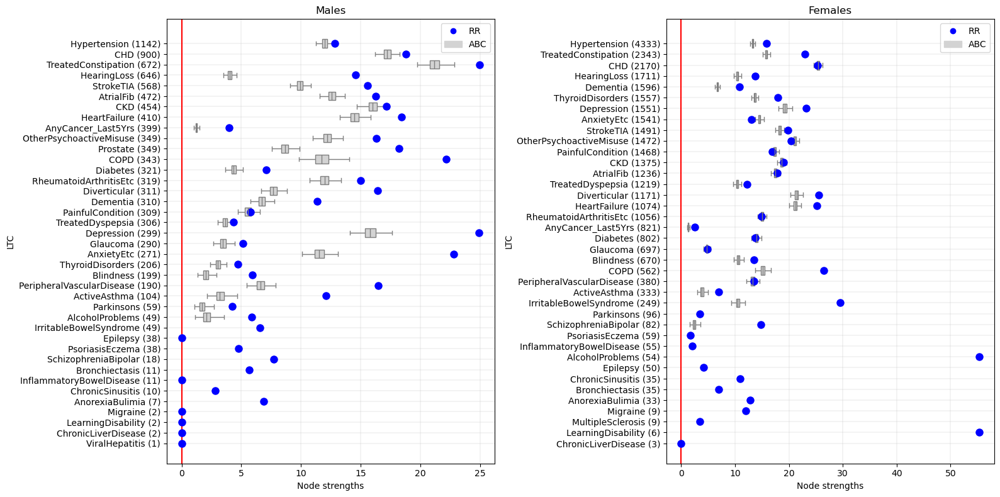

In [71]:
node_deg_kwargs = dict(pvalue=pval, beautify_name_func=beautify_name, beautify_name_kwargs={"short":True})

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
models[ind_dict["male"]].plot_node_degrees(axes[0], title="Males", **node_deg_kwargs);
models[ind_dict["female"]].plot_node_degrees(axes[1], title="Females", **node_deg_kwargs);
fig.tight_layout();

/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/model.py:1006: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(sorted_labels)
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/model.py:1006: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(sorted_labels)


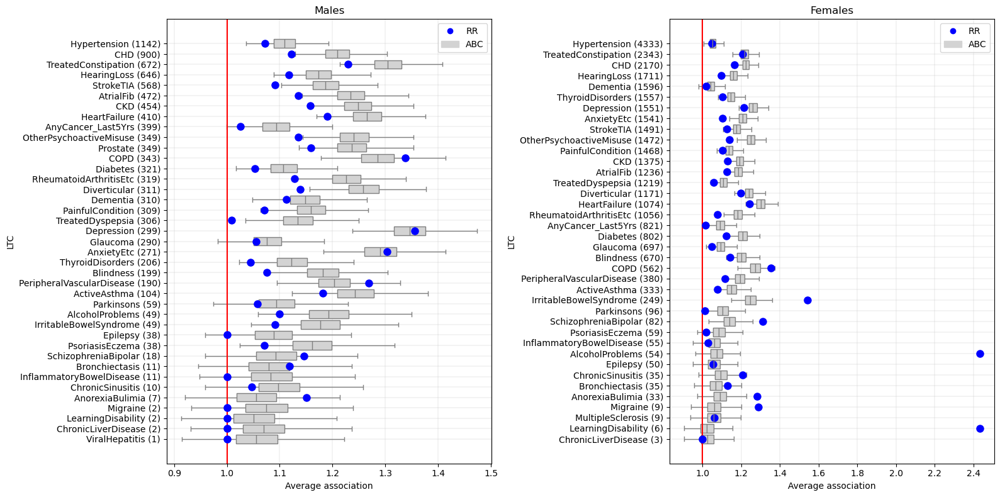

In [72]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
models[ind_dict["male"]].plot_node_degrees(axes[0], title="Males", catch_all=True, **node_deg_kwargs);
deg, _, _, _ = models[ind_dict["female"]].plot_node_degrees(axes[1], title="Females", catch_all=True, **node_deg_kwargs);
fig.tight_layout();

/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/model.py:1006: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(sorted_labels)
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/model.py:1006: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(sorted_labels)


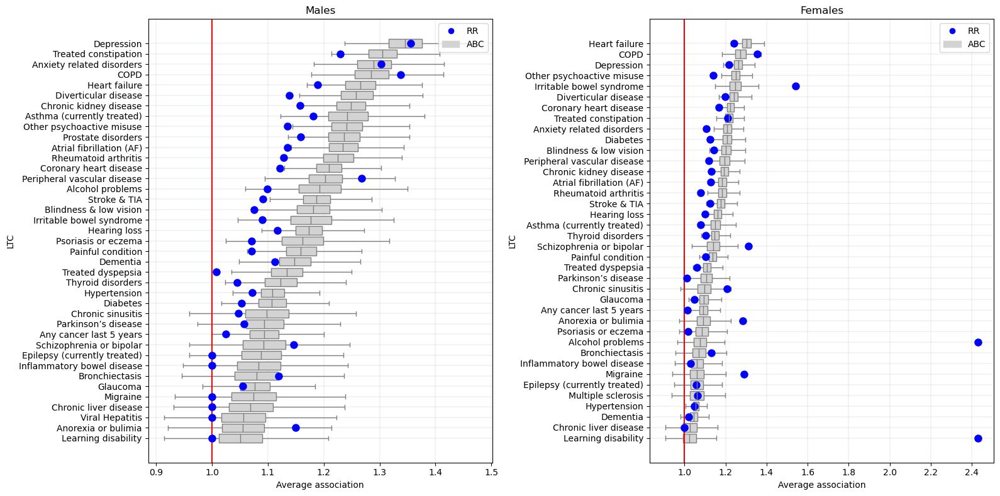

In [73]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
models[ind_dict["male"]].plot_node_degrees(axes[0], title="Males", catch_all=True, sort_by="degree", **node_deg_kwargs);
deg, _, _, _ = models[ind_dict["female"]].plot_node_degrees(axes[1], title="Females", catch_all=True, sort_by="degree", **node_deg_kwargs);
fig.tight_layout();

In [74]:
degs = {key:val.mean() for key, val in deg.items()}
{list(degs.keys())[el]: degs[list(degs.keys())[el]] for el in np.argsort(list(degs.values()))[::-1]}

{'HeartFailure': 1.3021142479968246,
 'COPD': 1.2727286018358357,
 'Depression': 1.2619424127522771,
 'OtherPsychoactiveMisuse': 1.2497411853992642,
 'IrritableBowelSyndrome': 1.2475595652090135,
 'Diverticular': 1.2402650187425988,
 'CHD': 1.2235239164879492,
 'TreatedConstipation': 1.2178349750595472,
 'AnxietyEtc': 1.2090248486692825,
 'Diabetes': 1.2078236721691495,
 'Blindness': 1.2030286572850288,
 'PeripheralVascularDisease': 1.1952996762026917,
 'CKD': 1.1936355289896292,
 'AtrialFib': 1.1846246405188963,
 'RheumatoidArthritisEtc': 1.1837824474903258,
 'StrokeTIA': 1.1770642711038315,
 'HearingLoss': 1.160480116363163,
 'ActiveAsthma': 1.150858300754774,
 'ThyroidDisorders': 1.1479121010906017,
 'SchizophreniaBipolar': 1.1403469870319316,
 'PainfulCondition': 1.1373904005560314,
 'TreatedDyspepsia': 1.1092956929221827,
 'Parkinsons': 1.1063935989691498,
 'ChronicSinusitis': 1.0968026106926176,
 'Glaucoma': 1.0944616790040946,
 'AnyCancer_Last5Yrs': 1.0924535250739804,
 'Anorexi

### Comparisons between sex groups

For performing comparisons between sex, we will first build a single dataframe that unifies results from both subgroups and compute their differeces.

In [75]:
def get_val(group, col, LTC1, LTC2):
    dat = dats[group]
    if ((row_mask := ((dat["namei"] == LTC1) & (dat["namej"] == LTC2))).sum() > 0):
        return dat[row_mask][col].values[0]
    elif ((row_mask := ((dat["namei"] == LTC2) & (dat["namej"] == LTC1))).sum() > 0):
        return dat[row_mask][col]
    else:
        return None if var not in ("a_sig", "fisher_sig") else False

    
dat_comp = []
for i, j in it.combinations(range(N), 2):
    row = {"i": i, "j": j, "namei": names[i], "namej": names[j], "names": f"{names[i]}-{names[j]}",
           "conf_ABC_diff": np.NaN, "conf_RR_diff": np.NaN,}
    
    for group in ("male", "female"):
        for var in ("ABC", "a_sig", "RR", "fisher_sig", "Xi", "Xj", "Xij", "a_f_sig_CI", "RR_f_sig_CI"):
            row[f"{var}_{group}"] = get_val(group, var, names[i], names[j])
            
    dat_comp.append(row)

dat_comp = pd.DataFrame(dat_comp)
dat_comp["diff_ABC"] = dat_comp["ABC_male"] - dat_comp["ABC_female"]
dat_comp["diff_RR"] = dat_comp["RR_male"] - dat_comp["RR_female"]
dat_comp["diff_ABC_abs"] = dat_comp["diff_ABC"].abs()
dat_comp["diff_RR_abs"] = dat_comp["diff_RR"].abs()
dat_comp = dat_comp.set_index(dat_comp["names"])

We then need to compute the probabilities of the distributions being different.

In [76]:
def compute_overlap_between_normals(m01,m02,std01,std02):
    # https://stackoverflow.com/questions/32551610/overlapping-probability-of-two-normal-distribution-with-scipy
    # Alternatively: https://rpsychologist.com/calculating-the-overlap-of-two-normal-distributions-using-monte-carlo-integration
    if m01 < m02:
        m1, m2 = m01, m02
        std1, std2 = std01, std02
    else:
        m1, m2 = m02, m01
        std1, std2 = std02, std01
    a = 1/(2*std1**2) - 1/(2*std2**2)
    b = m2/(std2**2) - m1/(std1**2)
    c = m1**2 /(2*std1**2) - m2**2 / (2*std2**2) - np.log(std2/std1)
    r = np.roots([a,b,c])
    return min(sp.stats.norm.cdf(r,m2,std2) + (1. - sp.stats.norm.cdf(r,m1,std1)))


for i, row in dat_comp.iterrows():
    if np.isfinite([row[f"ABC_{group}"] for group in ind_dict]).all():
        _, pvalue = probability_of_larger(*[model._get_var("r", LTC1=row["namei"], LTC2=row["namej"]) for model in models.values()])
        dat_comp.loc[row["names"], "conf_ABC_diff"] = pvalue
        
    if np.isfinite((RRs_row := [row[f"RR_{group}"] for group in ind_dict])).all() and not np.isclose(RRs_row, 0).any():
        # print(np.isfinite(RRs_row).all(), end="")
        m1, m2 = np.log(RRs_row)
        std1, std2 = [1/row[f"Xij_{group}"] - 1/Ms[ind] + 1 / row[f"Xi_{group}"] / row[f"Xj_{group}"] - 1/Ms[ind]**2 for group, ind in ind_dict.items()]
        # print(row.name, m1, m2, std1, std2)
        dat_comp.loc[row["names"], "conf_RR_diff"] = compute_overlap_between_normals(m1,m2,std1,std2)
        # print(dat_comp.loc[row.name, "sig_RR_diff"])

And finally set a threshold for their significance.

In [77]:
a_thresh = 0.05
RR_thresh = 0.05
dat_comp["sig_ABC_diff"] = dat_comp["conf_ABC_diff"] < a_thresh
dat_comp["sig_RR_diff"] = dat_comp["conf_RR_diff"] < RR_thresh
dat_comp["sig_ABC"] = dat_comp["a_sig_male"] & dat_comp["a_sig_female"] & dat_comp["sig_ABC_diff"]
dat_comp["sig_RR"] = dat_comp["fisher_sig_male"] & dat_comp["fisher_sig_female"] & dat_comp["sig_RR_diff"]
dat_comp

,i,j,namei,namej,names,conf_ABC_diff,conf_RR_diff,ABC_male,a_sig_male,RR_male,...,a_f_sig_CI_female,RR_f_sig_CI_female,diff_ABC,diff_RR,diff_ABC_abs,diff_RR_abs,sig_ABC_diff,sig_RR_diff,sig_ABC,sig_RR
names,,,,,,,,,,,,,,,,,,,,,
Hypertension-Depression,0,1,Hypertension,Depression,Hypertension-Depression,0.06315,1.093496e-51,1.100346,False,1.041308,...,NS,0.901 (0.898 - 0.904),0.190703,0.140368,0.190703,0.140368,False,True,False,False
Hypertension-PainfulCondition,0,2,Hypertension,PainfulCondition,Hypertension-PainfulCondition,0.25715,2.942051e-11,0.983091,False,0.964549,...,NS,NS,-0.070477,-0.064890,0.070477,0.064890,False,True,False,False
Hypertension-ActiveAsthma,0,3,Hypertension,ActiveAsthma,Hypertension-ActiveAsthma,0.14600,2.610363e-09,0.914055,False,0.921157,...,NS,NS,-0.228659,-0.197848,0.228659,0.197848,False,True,False,False
Hypertension-CHD,0,4,Hypertension,CHD,Hypertension-CHD,0.33495,6.794006e-21,1.197300,True,1.162023,...,1.17 (1.09 - 1.27),1.13 (1.13 - 1.13),0.030393,0.031544,0.030393,0.031544,False,True,False,True
Hypertension-TreatedDyspepsia,0,5,Hypertension,TreatedDyspepsia,Hypertension-TreatedDyspepsia,0.49005,6.468880e-01,0.969364,False,0.956612,...,NS,NS,-0.001180,0.000501,0.001180,0.000501,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Parkinsons-ViralHepatitis,36,38,Parkinsons,ViralHepatitis,Parkinsons-ViralHepatitis,NaN,NaN,0.879419,False,0.000000,...,None,None,NaN,NaN,NaN,NaN,False,False,False,False
Parkinsons-ChronicLiverDisease,36,39,Parkinsons,ChronicLiverDisease,Parkinsons-ChronicLiverDisease,0.49910,NaN,0.921279,False,0.000000,...,NS,NS,-0.048363,0.000000,0.048363,0.000000,False,False,False,False
MultipleSclerosis-ViralHepatitis,37,38,MultipleSclerosis,ViralHepatitis,MultipleSclerosis-ViralHepatitis,NaN,NaN,NaN,False,NaN,...,None,None,NaN,NaN,NaN,NaN,False,False,False,False


#### Associations only found in one sex

This section analysis how many associations are only found in one of the sexes, by method.

Let's look at ABC first.

In [78]:
ABC_only_males = dat_comp[dat_comp["a_sig_male"] & ~ dat_comp["a_sig_female"]].sort_values(by="ABC_male", ascending=False).loc[:, ["ABC_male","RR_male", "fisher_sig_male", "fisher_sig_female"]] # "a_f","a CI (99%)", "RR_f", "RR CI (99%)", "Xi", "Xj", "Xij", "RR/a"]]
ABC_only_females = dat_comp[dat_comp["a_sig_female"] & ~ dat_comp["a_sig_male"]].sort_values(by="ABC_female", ascending=False).loc[:, ["ABC_female","RR_female", "fisher_sig_female", "fisher_sig_male", "a_sig_male"]] # "a_f","a CI (99%)", "RR_f", "RR CI (99%)", "Xi", "Xj", "Xij", "RR/a"]]
ABC_both = dat_comp[dat_comp["a_sig_female"] & dat_comp["a_sig_male"]].sort_values(by="diff_ABC", ascending=False).loc[:, ["ABC_female","ABC_male", "diff_ABC"]]

"Only men", len(ABC_only_males), "only women", len(ABC_only_females), "both", len(ABC_both)

('Only men', 14, 'only women', 66, 'both', 58)

So by ABC, there are around double associations found in women than in men.

How about RR?

In [79]:
RR_only_males = dat_comp[dat_comp["fisher_sig_male"] & ~ dat_comp["fisher_sig_female"]].sort_values(by="RR_male", ascending=False).loc[:, ["RR_male","ABC_male", "a_sig_male", "a_sig_female"]] # "a_f","a CI (99%)", "RR_f", "RR CI (99%)", "Xi", "Xj", "Xij", "RR/a"]]
RR_only_females = dat_comp[dat_comp["fisher_sig_female"] & ~ dat_comp["fisher_sig_male"]].sort_values(by="RR_female", ascending=False).loc[:, ["RR_female","ABC_female", "a_sig_female", "a_sig_male"]] # "a_f","a CI (99%)", "RR_f", "RR CI (99%)", "Xi", "Xj", "Xij", "RR/a"]]
RR_both = dat_comp[dat_comp["fisher_sig_female"] & dat_comp["fisher_sig_male"]].sort_values(by="diff_RR", ascending=False).loc[:, ["RR_female","RR_male", "diff_RR"]]

"Only men", len(RR_only_males), "only women", len(RR_only_females), "both", len(RR_both)

('Only men', 34, 'only women', 76, 'both', 79)

The disparity is more nuanced.

Are all associations found in both sexes by ABC also among the ones found by RR in both sexes?

In [80]:
for association in ABC_both.index:
    if association not in RR_both.index:
        print("No")
        break
else:
    print("Yes")

No


Let's look now at which associations are specific to each subgroup, by method.

In [81]:
ABC_only_males

,ABC_male,RR_male,fisher_sig_male,fisher_sig_female
names,,,,
COPD-AlcoholProblems,1.934983,3.254715,True,False
Diverticular-Prostate,1.604391,1.707948,True,False
TreatedConstipation-Parkinsons,1.594118,2.069537,True,True
AnxietyEtc-Prostate,1.502614,1.574462,True,False
Depression-Prostate,1.427272,1.485266,True,False
Prostate-Glaucoma,1.401792,1.501334,True,False
COPD-AnxietyEtc,1.377815,1.503921,True,False
StrokeTIA-Dementia,1.375245,1.415254,True,False
TreatedConstipation-AtrialFib,1.336492,1.303042,True,False


4 associations relate to *Prostate* (expected) and 4 others relate to *Treated constipation*. Two of them was deemed as also present in females by RR: *Treated constipation* with *Parkinsons*, and *Thyroid Disorders* with *CKD*.

How about RR?

In [82]:
RR_only_males

,RR_male,ABC_male,a_sig_male,a_sig_female
names,,,,
PeripheralVascularDisease-AnorexiaBulimia,6.854887,1.215871,False,False
AnxietyEtc-SchizophreniaBipolar,3.738007,1.351930,False,False
COPD-AlcoholProblems,3.254715,1.934983,True,False
Prostate-PsoriasisEczema,2.749811,1.652832,False,False
AlcoholProblems-PeripheralVascularDisease,2.611386,1.399660,False,False
ActiveAsthma-Blindness,2.202600,1.433933,False,False
Dementia-Parkinsons,2.160033,1.492228,False,False
Depression-ActiveAsthma,2.052322,1.595548,False,False
ActiveAsthma-AnxietyEtc,1.940888,1.549101,False,False


In [83]:
RR_only_males["a_sig_male"].sum()

14

34 associations, out of which 14 were also found to be significant by ABC. Two of them were also considered to be significant in women by ABC.

Let's look now at which associations are specific to women, first by ABC.

In [84]:
ABC_only_females

,ABC_female,RR_female,fisher_sig_female,fisher_sig_male,a_sig_male
names,,,,,
IrritableBowelSyndrome-Diverticular,2.465425,2.737954,True,False,False
Depression-SchizophreniaBipolar,2.313385,3.103269,True,True,False
Diabetes-Blindness,1.719202,1.752801,True,False,False
IrritableBowelSyndrome-TreatedConstipation,1.620526,1.645147,True,True,False
TreatedDyspepsia-IrritableBowelSyndrome,1.595948,1.773130,True,False,False
...,...,...,...,...,...
Hypertension-OtherPsychoactiveMisuse,1.113144,1.078677,True,True,False
Hypertension-Dementia,0.788185,0.806791,True,False,False
TreatedDyspepsia-StrokeTIA,0.705300,0.686003,True,True,False


And by RR

In [85]:
RR_only_females

,RR_female,ABC_female,a_sig_female,a_sig_male
names,,,,
AlcoholProblems-LearningDisability,55.370370,0.995898,False,False
IrritableBowelSyndrome-Migraine,12.008032,1.169231,False,False
SchizophreniaBipolar-AnorexiaBulimia,9.944568,1.220184,False,False
IrritableBowelSyndrome-ChronicSinusitis,5.146299,1.250899,False,False
COPD-ChronicSinusitis,3.648195,1.376908,False,False
...,...,...,...,...
Hypertension-Dementia,0.806791,0.788185,True,False
TreatedDyspepsia-AtrialFib,0.803719,0.815231,False,False
PainfulCondition-Dementia,0.662338,0.682334,True,False


Not as big a discrepancy, although a more thorough analysis is needed.

#### Associations found in both sexes and differences significant (by method)

Number of associations found by both methods in both sexes:

In [86]:
dat_comp_by_both_both = dat_comp[dat_comp["a_sig_male"] & dat_comp["a_sig_female"] & dat_comp["fisher_sig_male"] & dat_comp["fisher_sig_female"]]
len(dat_comp_by_both_both)

57

Associations found by ABC with significant differences in ABC:

In [87]:
beautify_index(dat_comp[(dat_comp["a_sig_male"] | dat_comp["a_sig_female"]) & dat_comp["sig_ABC_diff"]].sort_values(by="diff_ABC", ascending=False).loc[:, ["a_f_sig_CI_male", "a_f_sig_CI_female", "conf_ABC_diff"]]) # , "diff_ABC", "sig_a1", "sig_a2"]]

,a_f_sig_CI_male,a_f_sig_CI_female,conf_ABC_diff
"Depression - Anxiety & other neurotic, stress related & somatoform disorders",3.32 (2.59 - 4.4),2.22 (2.0 - 2.47),0.00015
Depression - Painful condition,1.98 (1.44 - 2.73),1.53 (1.35 - 1.76),0.02720
Depression - Dementia,2.19 (1.61 - 2.94),1.77 (1.57 - 1.99),0.04300
"Anxiety & other neurotic, stress related & somatoform disorders - Treated constipation",2.04 (1.64 - 2.57),1.63 (1.46 - 1.8),0.00705
Chronic kidney disease (CKD) - Heart failure,2.22 (1.77 - 2.76),1.83 (1.61 - 2.16),0.04435
Other psychoactive misuse - Dementia,1.68 (1.24 - 2.36),1.35 (1.2 - 1.57),0.04455
Treated constipation - Atrial fibrillation (AF),1.34 (1.07 - 1.67),NS,0.00405
Thyroid disorders - Chronic kidney disease (CKD),1.52 (1.08 - 2.17),1.23 (1.02 - 1.38),0.03765
Depression - Stroke & transient ischaemic attack (TIA),1.47 (1.12 - 1.94),1.19 (1.04 - 1.4),0.04580
Painful condition - Treated constipation,1.88 (1.49 - 2.34),1.6 (1.43 - 1.76),0.04435


In [88]:
beautify_index(dat_comp[dat_comp["a_sig_male"] & dat_comp["a_sig_female"] & dat_comp["sig_ABC_diff"]].sort_values(by="diff_ABC", ascending=False).loc[:, ["a_f_sig_CI_male", "a_f_sig_CI_female", "conf_ABC_diff"]]) # , "diff_ABC", "sig_a1", "sig_a2"]]

,a_f_sig_CI_male,a_f_sig_CI_female,conf_ABC_diff
"Depression - Anxiety & other neurotic, stress related & somatoform disorders",3.32 (2.59 - 4.4),2.22 (2.0 - 2.47),0.00015
Depression - Painful condition,1.98 (1.44 - 2.73),1.53 (1.35 - 1.76),0.02720
Depression - Dementia,2.19 (1.61 - 2.94),1.77 (1.57 - 1.99),0.04300
"Anxiety & other neurotic, stress related & somatoform disorders - Treated constipation",2.04 (1.64 - 2.57),1.63 (1.46 - 1.8),0.00705
Chronic kidney disease (CKD) - Heart failure,2.22 (1.77 - 2.76),1.83 (1.61 - 2.16),0.04435
Other psychoactive misuse - Dementia,1.68 (1.24 - 2.36),1.35 (1.2 - 1.57),0.04455
Thyroid disorders - Chronic kidney disease (CKD),1.52 (1.08 - 2.17),1.23 (1.02 - 1.38),0.03765
Depression - Stroke & transient ischaemic attack (TIA),1.47 (1.12 - 1.94),1.19 (1.04 - 1.4),0.04580
Painful condition - Treated constipation,1.88 (1.49 - 2.34),1.6 (1.43 - 1.76),0.04435
Hypertension - Chronic kidney disease (CKD),1.62 (1.38 - 1.89),1.44 (1.32 - 1.57),0.04600


Associations found in both and with significant differences by ABC:

In [89]:
sig_diff_by_ABC = beautify_index(dat_comp_by_both_both[dat_comp_by_both_both["sig_ABC_diff"]].sort_values(by="diff_ABC", ascending=False).loc[:, ["a_f_sig_CI_male", "a_f_sig_CI_female", "conf_ABC_diff"]]) # , "diff_ABC", "sig_a1", "sig_a2"]]
sig_diff_by_ABC

,a_f_sig_CI_male,a_f_sig_CI_female,conf_ABC_diff
"Depression - Anxiety & other neurotic, stress related & somatoform disorders",3.32 (2.59 - 4.4),2.22 (2.0 - 2.47),0.00015
Depression - Painful condition,1.98 (1.44 - 2.73),1.53 (1.35 - 1.76),0.02720
Depression - Dementia,2.19 (1.61 - 2.94),1.77 (1.57 - 1.99),0.04300
"Anxiety & other neurotic, stress related & somatoform disorders - Treated constipation",2.04 (1.64 - 2.57),1.63 (1.46 - 1.8),0.00705
Chronic kidney disease (CKD) - Heart failure,2.22 (1.77 - 2.76),1.83 (1.61 - 2.16),0.04435
Other psychoactive misuse - Dementia,1.68 (1.24 - 2.36),1.35 (1.2 - 1.57),0.04455
Thyroid disorders - Chronic kidney disease (CKD),1.52 (1.08 - 2.17),1.23 (1.02 - 1.38),0.03765
Depression - Stroke & transient ischaemic attack (TIA),1.47 (1.12 - 1.94),1.19 (1.04 - 1.4),0.04580
Painful condition - Treated constipation,1.88 (1.49 - 2.34),1.6 (1.43 - 1.76),0.04435
Hypertension - Chronic kidney disease (CKD),1.62 (1.38 - 1.89),1.44 (1.32 - 1.57),0.04600


In [90]:
print(sig_diff_by_ABC.loc[:, ["a_f_sig_CI_male", "a_f_sig_CI_female"]].to_latex())

\begin{tabular}{lll}
\toprule
{} &     a\_f\_sig\_CI\_male &   a\_f\_sig\_CI\_female \\
\midrule
Depression - Anxiety \& other neurotic, stress r... &   3.32 (2.59 - 4.4) &   2.22 (2.0 - 2.47) \\
Depression - Painful condition                     &  1.98 (1.44 - 2.73) &  1.53 (1.35 - 1.76) \\
Depression - Dementia                              &  2.19 (1.61 - 2.94) &  1.77 (1.57 - 1.99) \\
Anxiety \& other neurotic, stress related \& soma... &  2.04 (1.64 - 2.57) &   1.63 (1.46 - 1.8) \\
Chronic kidney disease (CKD) - Heart failure       &  2.22 (1.77 - 2.76) &  1.83 (1.61 - 2.16) \\
Other psychoactive misuse - Dementia               &  1.68 (1.24 - 2.36) &   1.35 (1.2 - 1.57) \\
Thyroid disorders - Chronic kidney disease (CKD)   &  1.52 (1.08 - 2.17) &  1.23 (1.02 - 1.38) \\
Depression - Stroke \& transient ischaemic attac... &  1.47 (1.12 - 1.94) &   1.19 (1.04 - 1.4) \\
Painful condition - Treated constipation           &  1.88 (1.49 - 2.34) &   1.6 (1.43 - 1.76) \\
Hypertension - Ch

/tmp/ipykernel_23694/3003106734.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(sig_diff_by_ABC.loc[:, ["a_f_sig_CI_male", "a_f_sig_CI_female"]].to_latex())


In [91]:
print(sig_diff_by_ABC.loc[:, ["a_f_sig_CI_male", "a_f_sig_CI_female"]].to_latex())

\begin{tabular}{lll}
\toprule
{} &     a\_f\_sig\_CI\_male &   a\_f\_sig\_CI\_female \\
\midrule
Depression - Anxiety \& other neurotic, stress r... &   3.32 (2.59 - 4.4) &   2.22 (2.0 - 2.47) \\
Depression - Painful condition                     &  1.98 (1.44 - 2.73) &  1.53 (1.35 - 1.76) \\
Depression - Dementia                              &  2.19 (1.61 - 2.94) &  1.77 (1.57 - 1.99) \\
Anxiety \& other neurotic, stress related \& soma... &  2.04 (1.64 - 2.57) &   1.63 (1.46 - 1.8) \\
Chronic kidney disease (CKD) - Heart failure       &  2.22 (1.77 - 2.76) &  1.83 (1.61 - 2.16) \\
Other psychoactive misuse - Dementia               &  1.68 (1.24 - 2.36) &   1.35 (1.2 - 1.57) \\
Thyroid disorders - Chronic kidney disease (CKD)   &  1.52 (1.08 - 2.17) &  1.23 (1.02 - 1.38) \\
Depression - Stroke \& transient ischaemic attac... &  1.47 (1.12 - 1.94) &   1.19 (1.04 - 1.4) \\
Painful condition - Treated constipation           &  1.88 (1.49 - 2.34) &   1.6 (1.43 - 1.76) \\
Hypertension - Ch

/tmp/ipykernel_23694/3003106734.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(sig_diff_by_ABC.loc[:, ["a_f_sig_CI_male", "a_f_sig_CI_female"]].to_latex())


They are the same.

Associations found by RR and with significant differences by RR:

In [92]:
sig_diff_by_RR = beautify_index(dat_comp[dat_comp["fisher_sig_male"] & dat_comp["fisher_sig_female"] & dat_comp["sig_RR_diff"]].sort_values(by="diff_RR", ascending=False).loc[:, ["RR_f_sig_CI_male", "RR_f_sig_CI_female", "conf_RR_diff", "sig_ABC"]])  # "a_sig_male", "a_sig_female", "sig_a_diff"]]
sig_diff_by_RR.iloc[:10]

,RR_f_sig_CI_male,RR_f_sig_CI_female,conf_RR_diff,sig_ABC
"Depression - Anxiety & other neurotic, stress related & somatoform disorders",3.64 (3.55 - 3.73),2.14 (2.13 - 2.14),0.000000e+00,True
Depression - Irritable bowel syndrome (IBS),2.49 (2.01 - 3.08),1.67 (1.61 - 1.73),2.993421e-05,False
"Anxiety & other neurotic, stress related & somatoform disorders - Irritable bowel syndrome (IBS)",2.29 (1.77 - 2.96),1.59 (1.53 - 1.65),1.036508e-03,False
Depression - Painful condition,2.14 (2.06 - 2.22),1.5 (1.49 - 1.51),1.714426e-91,True
Depression - Dementia,2.36 (2.28 - 2.44),1.73 (1.72 - 1.74),2.231931e-88,True
"Anxiety & other neurotic, stress related & somatoform disorders - Treated constipation",2.07 (2.03 - 2.11),1.55 (1.55 - 1.56),1.018421e-212,True
Treated constipation - Parkinson’s disease,2.07 (1.88 - 2.27),1.56 (1.46 - 1.66),4.407795e-06,False
Other psychoactive misuse - Dementia,1.83 (1.76 - 1.9),1.34 (1.33 - 1.35),1.262933e-66,True
Thyroid disorders - Chronic kidney disease (CKD),1.62 (1.54 - 1.71),1.15 (1.14 - 1.16),8.450268e-50,True
"Thyroid disorders - Rheumatoid arthritis, other inflammatory polyarthropathies & systematic connective tissue disorders",1.62 (1.5 - 1.74),1.2 (1.19 - 1.21),3.741849e-20,False


In [93]:
print(sig_diff_by_RR.loc[:, ["RR_f_sig_CI_male", "RR_f_sig_CI_female", "sig_ABC"]].to_latex())

\begin{tabular}{llll}
\toprule
{} &       RR\_f\_sig\_CI\_male &     RR\_f\_sig\_CI\_female &  sig\_ABC \\
\midrule
Depression - Anxiety \& other neurotic, stress r... &     3.64 (3.55 - 3.73) &     2.14 (2.13 - 2.14) &     True \\
Depression - Irritable bowel syndrome (IBS)        &     2.49 (2.01 - 3.08) &     1.67 (1.61 - 1.73) &    False \\
Anxiety \& other neurotic, stress related \& soma... &     2.29 (1.77 - 2.96) &     1.59 (1.53 - 1.65) &    False \\
Depression - Painful condition                     &     2.14 (2.06 - 2.22) &      1.5 (1.49 - 1.51) &     True \\
Depression - Dementia                              &     2.36 (2.28 - 2.44) &     1.73 (1.72 - 1.74) &     True \\
Anxiety \& other neurotic, stress related \& soma... &     2.07 (2.03 - 2.11) &     1.55 (1.55 - 1.56) &     True \\
Treated constipation - Parkinson’s disease         &     2.07 (1.88 - 2.27) &     1.56 (1.46 - 1.66) &    False \\
Other psychoactive misuse - Dementia               &      1.83 (1.76 - 1.9

/tmp/ipykernel_23694/2963078158.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(sig_diff_by_RR.loc[:, ["RR_f_sig_CI_male", "RR_f_sig_CI_female", "sig_ABC"]].to_latex())


Associations found in both and with significant differences by RR:

In [94]:
len(dat_comp_by_both_both[dat_comp_by_both_both["sig_RR_diff"]].sort_values(by="diff_RR", ascending=False).loc[:, ["RR_male", "RR_female", "conf_RR_diff", "sig_ABC"]])  # 1", "sig_a2", "sig_a_diff"]]

48

In [95]:
dat_comp[dat_comp["fisher_sig_male"] & dat_comp["fisher_sig_female"] & ~ dat_comp["sig_RR_diff"] & dat_comp["sig_ABC_diff"]].sort_values(by="diff_RR", ascending=False).loc[:, ["RR_male", "RR_female", "conf_RR_diff", "sig_ABC"]]  # 1", "sig_a2", "sig_a_diff"]]

,RR_male,RR_female,conf_RR_diff,sig_ABC
names,,,,


All of the significant differences found by ABC were also found by RR.

#### Comparisons of comparisons

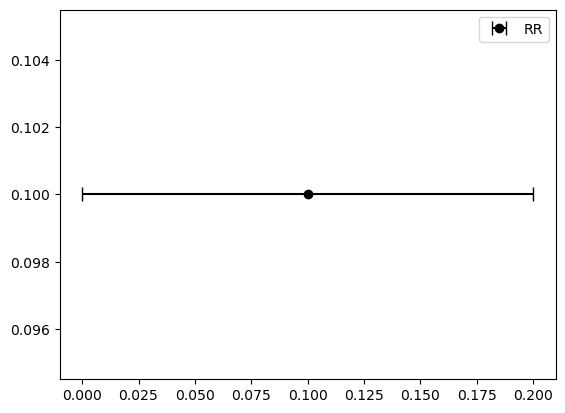

In [96]:
from scipy.stats import kstest, mannwhitneyu, ttest_ind
import matplotlib as mpl

_, black_ax = plt.subplots()
black_ax.errorbar(y=0.1, x=0.1, xerr=0.1, color="k", label="RR", fmt="o", capsize=5);
black_ax.legend();
black_handle, _ = black_ax.get_legend_handles_labels()

# def compare_overlap(sample1, sample2):
#     conf1 = compute_num_interval(sample1, pval)
#     conf2 = compute_num_interval(sample2, pval)
    
    
def compute_overlap_between_normals(m01,m02,std01,std02):
    # https://stackoverflow.com/questions/32551610/overlapping-probability-of-two-normal-distribution-with-scipy
    # Alternatively: https://rpsychologist.com/calculating-the-overlap-of-two-normal-distributions-using-monte-carlo-integration
    if m01 < m02:
        m1, m2 = m01, m02
        std1, std2 = std01, std02
    else:
        m1, m2 = m02, m01
        std1, std2 = std02, std01
    a = 1/(2*std1**2) - 1/(2*std2**2)
    b = m2/(std2**2) - m1/(std1**2)
    c = m1**2 /(2*std1**2) - m2**2 / (2*std2**2) - np.log(std2/std1)
    r = np.roots([a,b,c])
    return min(sp.stats.norm.cdf(r,m2,std2) + (1. - sp.stats.norm.cdf(r,m1,std1)))

In [97]:
def plot_comparison(pairs, kmin=0, kmax=9, labels=labels, tests=False, loc=None, xlim=None, sharex=False, figsize=None, panel_labels=False, log=False):
    k_range = range(kmin, kmax+1)
    # max_label_len = max([len(x) for x in labels])
    
    fig, axes = plt.subplots(len(pairs), 1, figsize=(13, (3 if not sharex else 2) * len(pairs)) if figsize is None else figsize, sharex=sharex)
    for l, pair in enumerate(pairs):
        # cond_names = [identify_LTC(cond, models[kmin].morb_names)[1] for cond in pair]
        # pair = [identify_LTC(cond, names)[0] for cond in pair]
        
        if tests:
            for k_pair in it.combinations(k_range, 2):
                sample_1, sample_2 = [models[k]._get_var("r", LTC1=pair[0], LTC2=pair[1]) for k in k_pair]
                pvalues = [f"{test_name} {test(sample_1, sample_2)[1]:.2}" for test_name, test in zip(("KS", "MW", "T", ""), (kstest, mannwhitneyu, ttest_ind, probability_of_larger))]  # , compare_overlap))]
                
                assert type(pair[0]) == str
                normal_params = [models[k].compute_RR_normal_params(*pair) for k in k_pair]
                if all([params[2] for params in normal_params]):
                    RR_overlap = compute_overlap_between_normals(*[params[0] for params in normal_params], *[params[1] for params in normal_params])
                    pvalues.append(f" {RR_overlap:.2}")
                
                # print(f"{labels[k_pair[0]]} - {labels[k_pair[1]]:21}: " + ", ".join(pvalues))
            # print("")
        
        ax = axes[l] if type(axes) == np.ndarray else axes
        for k in k_range:
            with warnings.catch_warnings():
                warnings.simplefilter("ignore")  # To avoid the annoying warning about distplots
                assert type(pair[0]) == str, f"{type(pair[0])}, {pair[0]}"
                sns.distplot(1 + models[k]._get_var("r", LTC1=pair[0], LTC2=pair[1]), kde=False, bins=50, ax=ax, label=f"ABC ({labels[k]})", norm_hist=True)
        
        # ax = axes[l,1]
        ax2 = ax.twinx()
        for k in k_range:
            assert type(pair[0]) == str, f"{type(pair[0])}, {pair[0]}"
            ij = tuple(identify_LTC(cond, models[k].morb_names)[0] for cond in pair)
            
            rr_ij = models[k].RRs[ij]
            kwargs = {"fmt":"o" if models[k].fishers_sig[ij] else "x"}
            ax2.errorbar(y=k, x=rr_ij, xerr=np.array([rr_ij - models[k].RRs_conf[0][ij], models[k].RRs_conf[1][ij] - rr_ij])[:,None], color=f"C{k-kmin}", label=f"RR ({labels[k]})", elinewidth=2.5, capthick=2.5, capsize=10, ms=10, **kwargs);
        ax2.set(ylim=[kmin - 0.5 * (kmax - kmin), kmax + 0.5 * (kmax - kmin)])
        # ax2.legend(loc="upper left");
                
        ax.axvline(1, ls="--", c="k")
        assert type(pair[0]) == str, f"{type(pair[0])}, {pair[0]}"
        ax.set(title=f"{beautify_name(pair[0], short=True)} - {beautify_name(pair[1], short=True)}")
        
        ax.text(0.03, 0.82, "ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz"[l], transform=ax.transAxes, ha="center", va="center", fontsize=20) if panel_labels else None
        
        handles, _ = ax.get_legend_handles_labels()
        RR_ABC_labels = ["RR" + (f" (p={pvalues[4]})" if tests else ""), "ABC" + (f" (p={pvalues[3]})" if tests else "")]
        ax2.legend(handles + black_handle + [mpl.patches.Patch(color="k")], [lbl for k, lbl in enumerate(labels) if k in k_range] + RR_ABC_labels, ncol=2, loc=loc)  # loc="lower left")  # ncol=2)
        ax.set(xlim=xlim) if xlim is not None else None
        ax.yaxis.set(ticks=[], ticklabels=[]),ax2.yaxis.set(ticks=[], ticklabels=[])
        
        if log:
            ax.set_xscale("log")
            ax2.set_xscale("log")
            
    ax.set(xlabel="Association measure")
    fig.tight_layout();

Highest differences in RR for associations that are present in both cohorts by both methods (note that differences may also be significant by ABC):

In [98]:
dat_comp_by_both_both.sort_values(by="diff_RR_abs", ascending=False).iloc[:5].loc[:, ["RR_f_sig_CI_male", "RR_f_sig_CI_female", "conf_ABC_diff", "conf_RR_diff"]]#, "Xi", "Xj", "Xij"]]  # , "RR1", "RR2"]]

,RR_f_sig_CI_male,RR_f_sig_CI_female,conf_ABC_diff,conf_RR_diff
names,,,,
Depression-AnxietyEtc,3.64 (3.55 - 3.73),2.14 (2.13 - 2.14),0.00015,0.000000e+00
Depression-PainfulCondition,2.14 (2.06 - 2.22),1.5 (1.49 - 1.51),0.02720,1.714426e-91
Depression-Dementia,2.36 (2.28 - 2.44),1.73 (1.72 - 1.74),0.04300,2.231931e-88
AnxietyEtc-TreatedConstipation,2.07 (2.03 - 2.11),1.55 (1.55 - 1.56),0.00705,1.018421e-212
OtherPsychoactiveMisuse-Dementia,1.83 (1.76 - 1.9),1.34 (1.33 - 1.35),0.04455,1.262933e-66


In [99]:
labels_as = ["Men", "Women"] * int(len(fnames) / 2)
comp_kwargs = {"kmin": 18, "kmax": 19, "labels": labels_as, "xlim":(0.7, 3.1), "sharex":True}

Highest differences in RR for associations that are present in both cohorts by both methods and that are significant by RR but NOT significant by ABC:

In [100]:
comp_table = dat_comp[dat_comp["a_sig_male"] & dat_comp["a_sig_female"] & (dat_comp["conf_ABC_diff"] > 0.05) & dat_comp["sig_RR"]]
print(len(comp_table))
highest_diff_RR_not_sig_diff_ABC = comp_table.sort_values(by="diff_RR_abs", ascending=False).iloc[:5].loc[:, ["namei", "namej", "RR_f_sig_CI_male", "RR_f_sig_CI_female", "conf_ABC_diff", "conf_RR_diff"]]  # , "Xi", "Xj", "Xij"]] # , "diff_RR", "RR1", "RR2"]]
highest_diff_RR_not_sig_diff_ABC.iloc[:, 2:]

36


,RR_f_sig_CI_male,RR_f_sig_CI_female,conf_ABC_diff,conf_RR_diff
names,,,,
AnxietyEtc-Diverticular,1.69 (1.61 - 1.79),1.35 (1.34 - 1.36),0.17545,2.108452e-20
PeripheralVascularDisease-HeartFailure,1.87 (1.78 - 1.97),1.54 (1.48 - 1.6),0.20615,1.458668e-08
Depression-TreatedConstipation,1.98 (1.94 - 2.02),1.66 (1.66 - 1.67),0.07975,9.440785e-92
PainfulCondition-RheumatoidArthritisEtc,1.73 (1.65 - 1.81),1.42 (1.41 - 1.44),0.19660,1.760980e-19
Depression-OtherPsychoactiveMisuse,1.63 (1.56 - 1.71),1.33 (1.32 - 1.34),0.16770,4.402622e-24


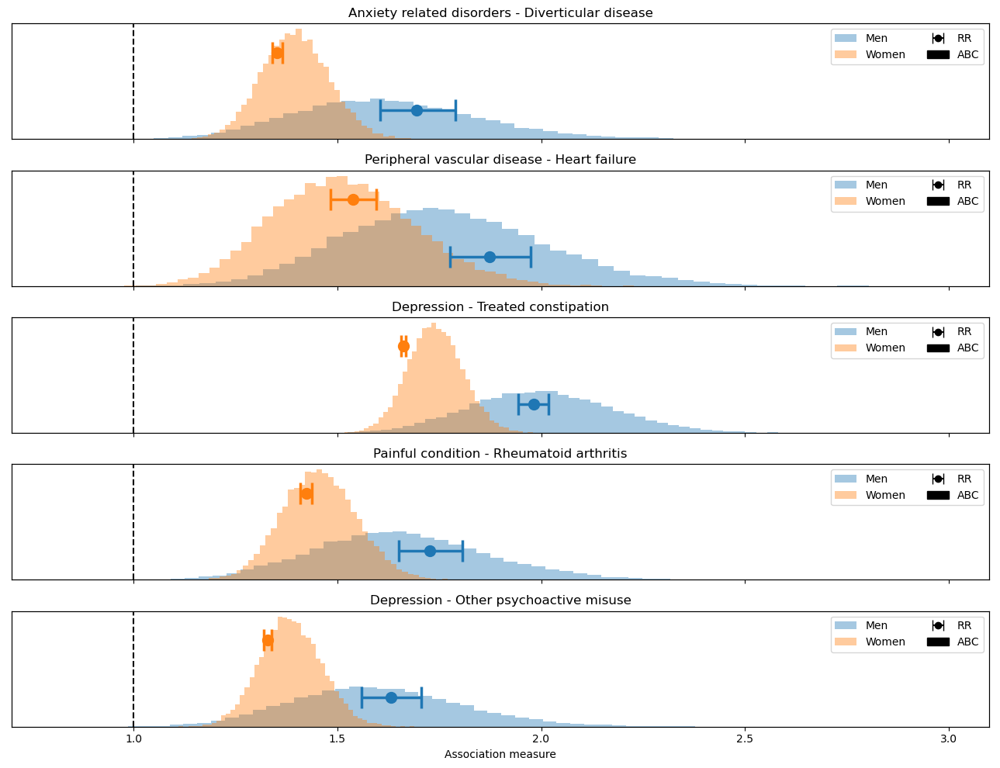

In [101]:
plot_comparison(highest_diff_RR_not_sig_diff_ABC.loc[:, ["namei","namej"]].values.tolist(), **comp_kwargs)

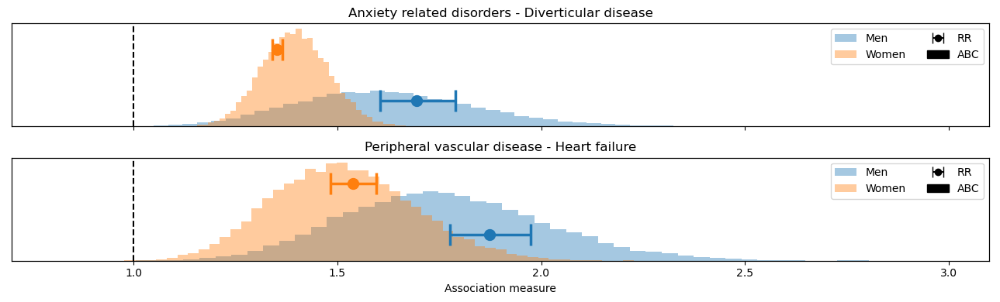

In [102]:
plot_comparison(highest_diff_RR_not_sig_diff_ABC.iloc[:2][["namei","namej"]].values.tolist(), **comp_kwargs)

Highest differences in RR for associations that are present in both cohorts by both methods and that are significant by RR but NOT significant by ABC:

In [103]:
comp_table = dat_comp[dat_comp["sig_RR"]].sort_values(by="conf_ABC_diff", ascending=False).iloc[:5]  # , "Xi", "Xj", "Xij"]] # , "sig_RR1", "sig_RR2"]]  # , "diff_RR", "RR1", "RR2"]]
comp_table.loc[:, ["conf_ABC_diff", "conf_RR_diff", "diff_RR"]]

,conf_ABC_diff,conf_RR_diff,diff_RR
names,,,
Depression-IrritableBowelSyndrome,0.4982,0.000030,0.816815
RheumatoidArthritisEtc-HeartFailure,0.4625,0.005197,0.082762
AnxietyEtc-IrritableBowelSyndrome,0.4498,0.001037,0.698934
CHD-TreatedConstipation,0.4361,0.001655,0.019415
StrokeTIA-Diverticular,0.4346,0.008236,0.055705


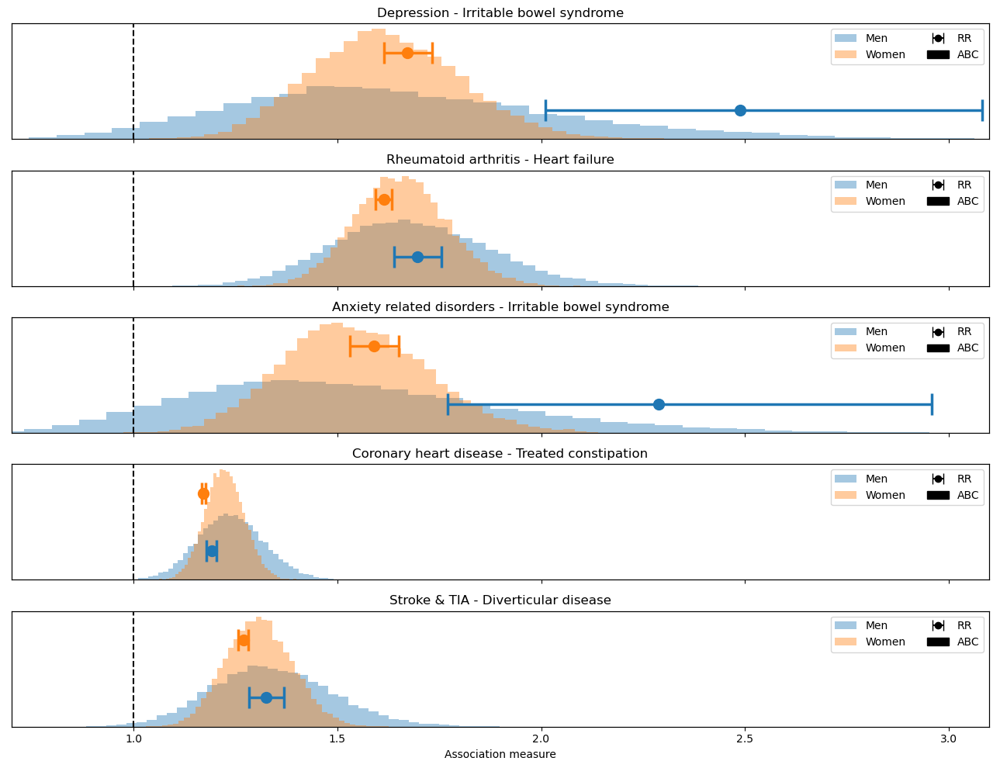

In [40]:
plot_comparison(comp_table.loc[:, ["namei","namej"]].values.tolist(), **comp_kwargs)

Highest signicant differences in RR for associations signifinat by RR in both sexes and whose differences are NOT significant by ABC:

In [104]:
comp_table = dat_comp[dat_comp["sig_RR"] & ~ dat_comp["sig_ABC_diff"]].sort_values(by="diff_RR_abs", ascending=False).iloc[:5]  # , "Xi", "Xj", "Xij"]] # , "sig_RR1", "sig_RR2"]]  # , "diff_RR", "RR1", "RR2"]]
top_RR_diff_not_ABC_sig = beautify_index(comp_table.loc[:, ["RR_f_sig_CI_male", "RR_f_sig_CI_female", "conf_RR_diff"]])  # , "diff_RR", "conf_ABC_diff"
top_RR_diff_not_ABC_sig

,RR_f_sig_CI_male,RR_f_sig_CI_female,conf_RR_diff
Depression - Irritable bowel syndrome (IBS),2.49 (2.01 - 3.08),1.67 (1.61 - 1.73),2.993421e-05
"Anxiety & other neurotic, stress related & somatoform disorders - Irritable bowel syndrome (IBS)",2.29 (1.77 - 2.96),1.59 (1.53 - 1.65),1.036508e-03
Treated constipation - Parkinson’s disease,2.07 (1.88 - 2.27),1.56 (1.46 - 1.66),4.407795e-06
"Thyroid disorders - Rheumatoid arthritis, other inflammatory polyarthropathies & systematic connective tissue disorders",1.62 (1.5 - 1.74),1.2 (1.19 - 1.21),3.741849e-20
"Anxiety & other neurotic, stress related & somatoform disorders - Diverticular disease of intestine",1.69 (1.61 - 1.79),1.35 (1.34 - 1.36),2.108452e-20


In [105]:
print(top_RR_diff_not_ABC_sig.to_latex())

\begin{tabular}{lllr}
\toprule
{} &    RR\_f\_sig\_CI\_male &  RR\_f\_sig\_CI\_female &  conf\_RR\_diff \\
\midrule
Depression - Irritable bowel syndrome (IBS)        &  2.49 (2.01 - 3.08) &  1.67 (1.61 - 1.73) &  2.993421e-05 \\
Anxiety \& other neurotic, stress related \& soma... &  2.29 (1.77 - 2.96) &  1.59 (1.53 - 1.65) &  1.036508e-03 \\
Treated constipation - Parkinson’s disease         &  2.07 (1.88 - 2.27) &  1.56 (1.46 - 1.66) &  4.407795e-06 \\
Thyroid disorders - Rheumatoid arthritis, other... &   1.62 (1.5 - 1.74) &   1.2 (1.19 - 1.21) &  3.741849e-20 \\
Anxiety \& other neurotic, stress related \& soma... &  1.69 (1.61 - 1.79) &  1.35 (1.34 - 1.36) &  2.108452e-20 \\
\bottomrule
\end{tabular}



/tmp/ipykernel_23694/2946497668.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(top_RR_diff_not_ABC_sig.to_latex())


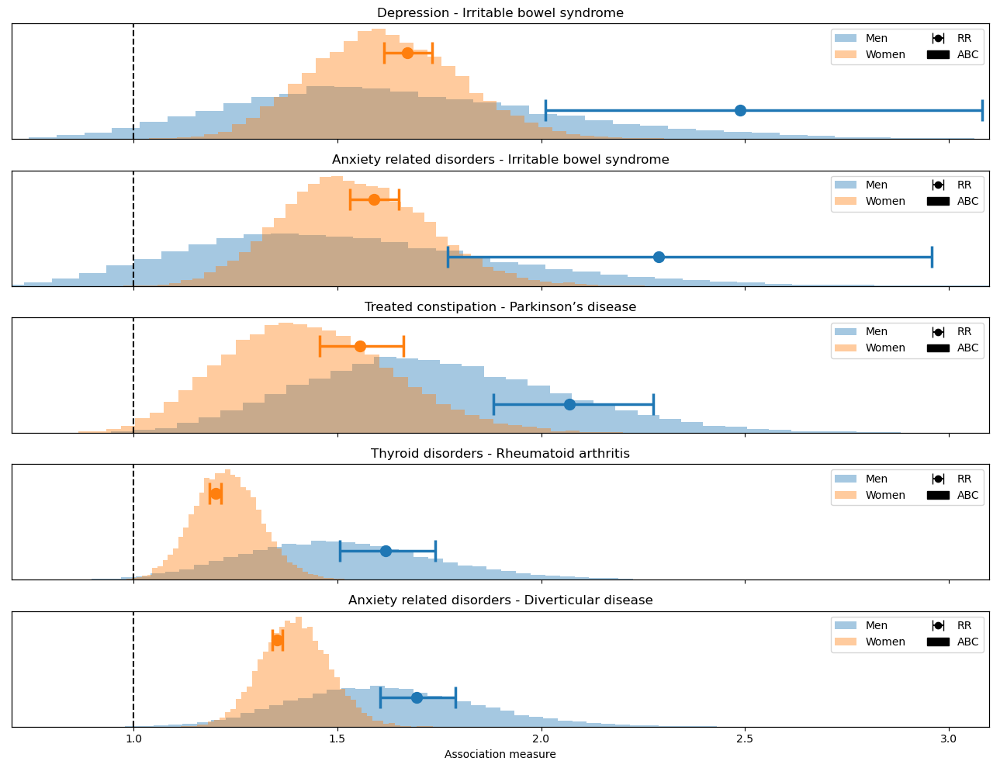

In [106]:
plot_comparison(comp_table.loc[:, ["namei","namej"]].values.tolist(), **comp_kwargs)

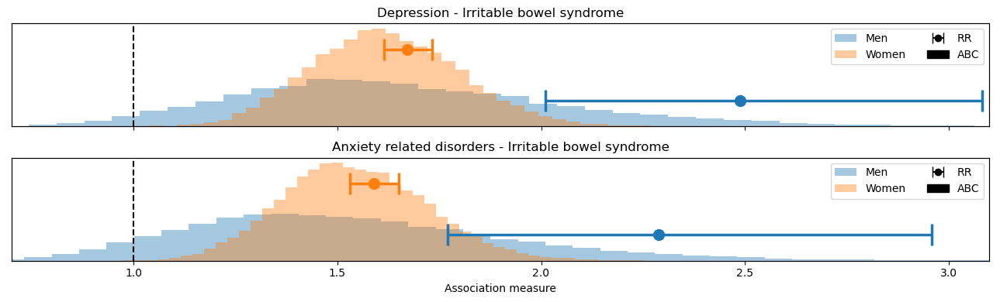

In [107]:
plot_comparison(comp_table.iloc[:2].loc[:, ["namei","namej"]].values.tolist(), **comp_kwargs)

In [108]:
comp_kwargs["xlim"] = (0.7, 4.5)  #, "sharex":True}

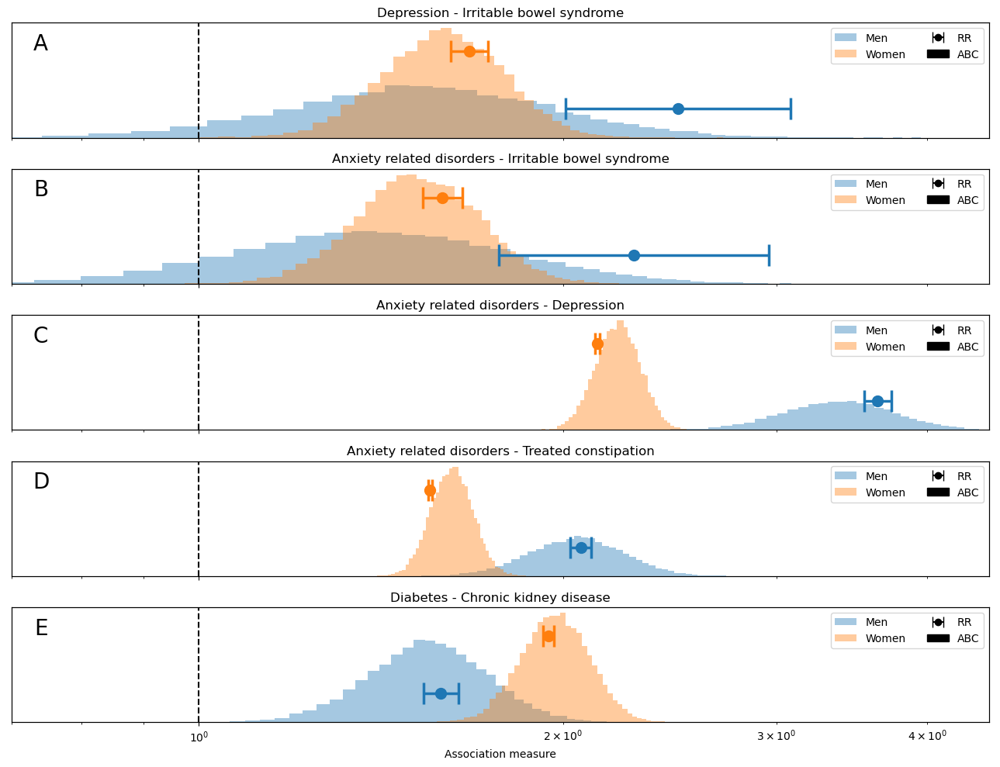

In [109]:
plot_comparison([("Depression", "IrritableBowelSyndrome"),
                 ("AnxietyEtc", "IrritableBowelSyndrome"),
                 ("AnxietyEtc", "Depression"), ("AnxietyEtc", "TreatedConstipation"), ("Diabetes", "CKD")], panel_labels=True, log=True, **comp_kwargs)

In [110]:
RR_both.max(), RR_both.min()

(RR_female    4.560244
 RR_male      5.638219
 diff_RR      1.502540
 dtype: float64,
 RR_female    0.686003
 RR_male      0.628987
 diff_RR     -0.359244
 dtype: float64)

In [111]:
comp_kwargs["log"] = True
comp_kwargs["xlim"] = (0.5, 9)  #, "sharex":True}

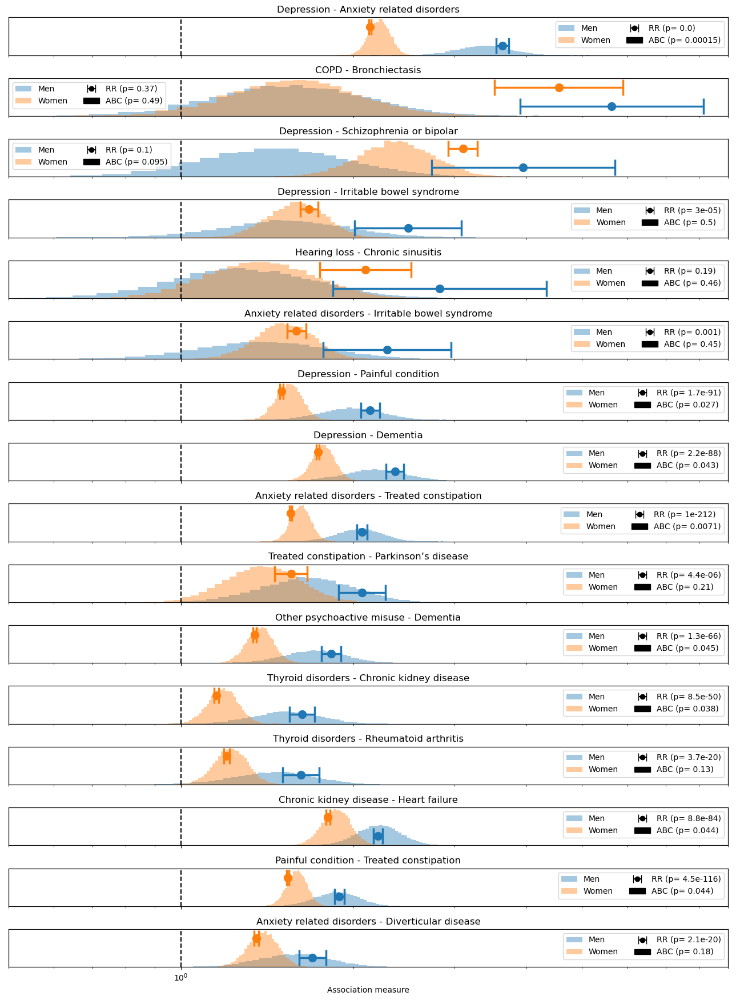

In [112]:
comp_table = dat_comp[dat_comp["fisher_sig_female"] & dat_comp["fisher_sig_male"]].sort_values(by="diff_RR", ascending=False).iloc[:16]
plot_comparison(comp_table.loc[:, ["namei","namej"]].values.tolist(), tests=True, figsize=(13, 1.1*len(comp_table)), **comp_kwargs)

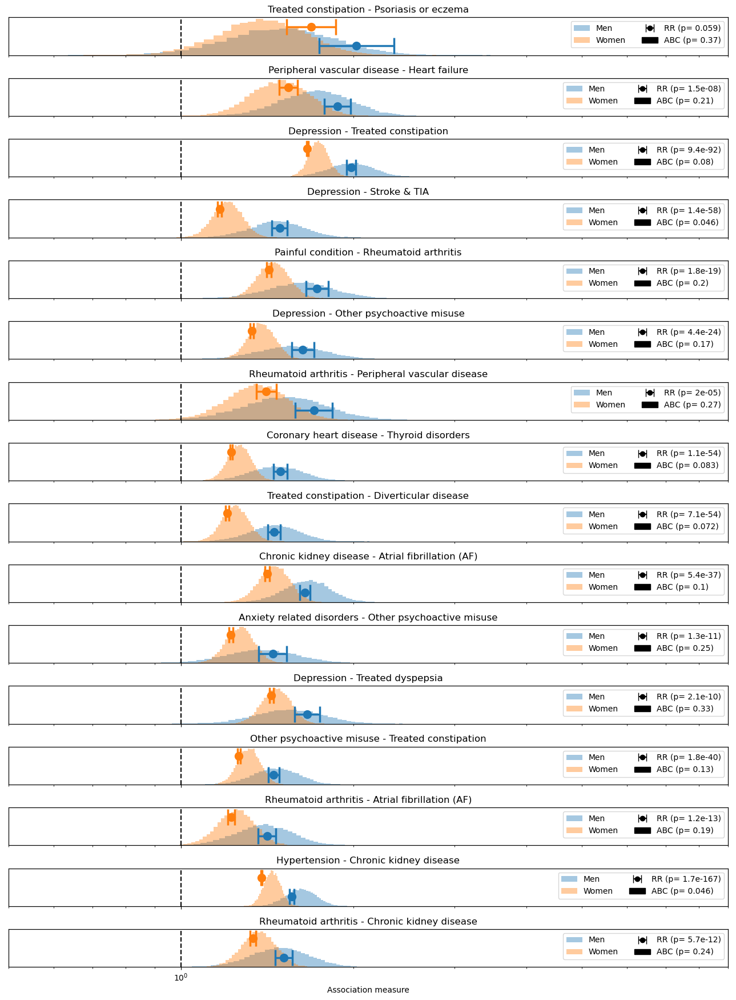

In [113]:
comp_table = dat_comp[dat_comp["fisher_sig_female"] & dat_comp["fisher_sig_male"]].sort_values(by="diff_RR", ascending=False).iloc[16:32]
plot_comparison(comp_table.loc[:, ["namei","namej"]].values.tolist(), tests=True, figsize=(13, 1.1*len(comp_table)), **comp_kwargs)

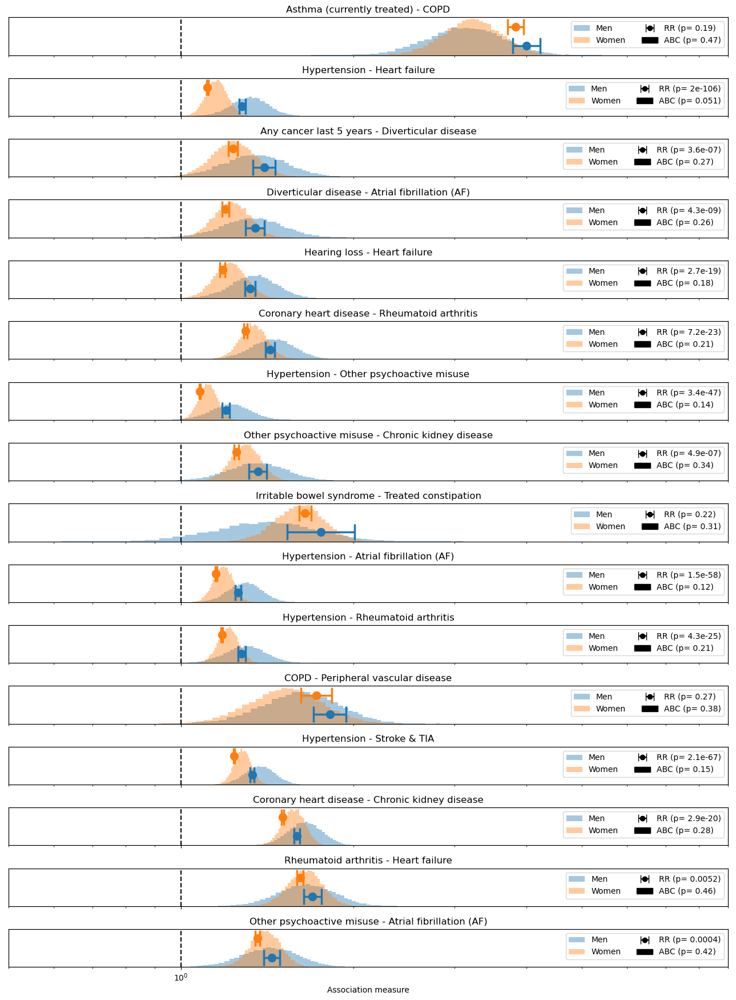

In [114]:
comp_table = dat_comp[dat_comp["fisher_sig_female"] & dat_comp["fisher_sig_male"]].sort_values(by="diff_RR", ascending=False).iloc[32:48]
plot_comparison(comp_table.loc[:, ["namei","namej"]].values.tolist(), tests=True, figsize=(13, 1.1*len(comp_table)), **comp_kwargs)

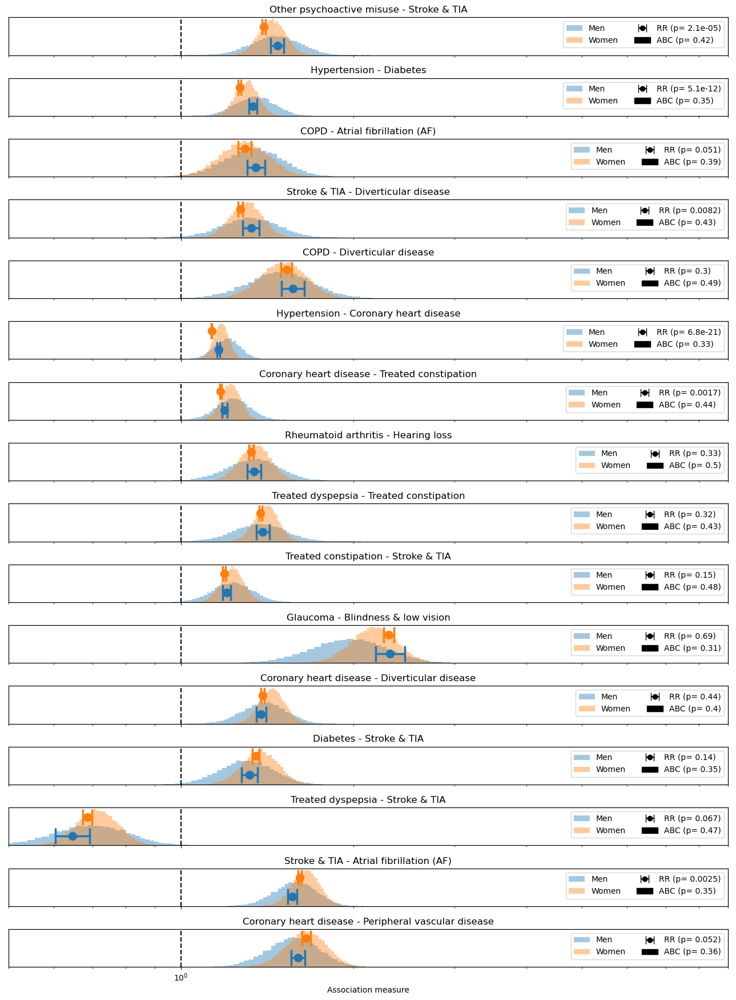

In [115]:
comp_table = dat_comp[dat_comp["fisher_sig_female"] & dat_comp["fisher_sig_male"]].sort_values(by="diff_RR", ascending=False).iloc[48:64]
plot_comparison(comp_table.loc[:, ["namei","namej"]].values.tolist(), tests=True, figsize=(13, 1.1*len(comp_table)), **comp_kwargs)

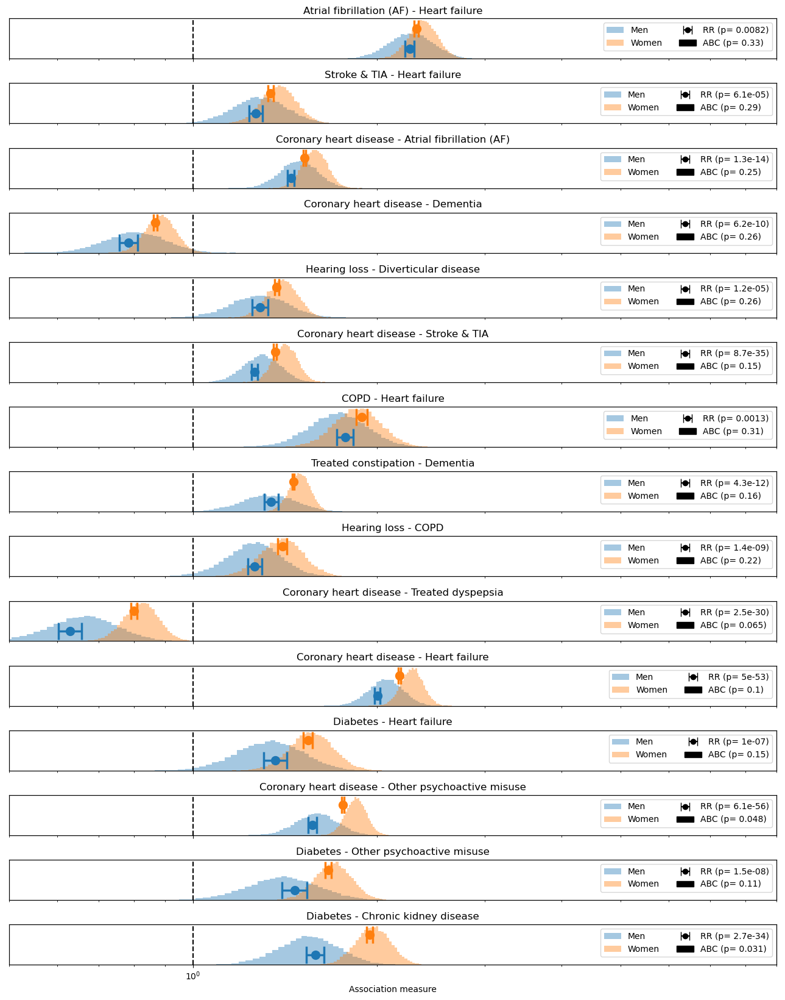

In [116]:
comp_table = dat_comp[dat_comp["fisher_sig_female"] & dat_comp["fisher_sig_male"]].sort_values(by="diff_RR", ascending=False).iloc[64:80]
plot_comparison(comp_table.loc[:, ["namei","namej"]].values.tolist(), tests=True, figsize=(13, 1.1*len(comp_table)), **comp_kwargs)

# Results 85yo+ population (without sex stratification)

Here, we include patients 85 years old and older to test the possibility of false positives.

In [117]:
dfs, labels, fnames, L, Xs, Ps, Ms = stratify(data, "Age85")
index = 4

## Describe subpopulation

In [118]:
def describe_subpopulation(index, lower_lim):
    df_eld = data[data["Age"] >= lower_lim]
    df_eld_male = df_eld[df_eld["Sex"]=="Men"]
    df_eld_female = df_eld[df_eld["Sex"]=="Women"]
    print(f"# of patients: Total {len(df_eld)}, males:{len(df_eld_male)} ({100 * len(df_eld_male)/len(df_eld):.2f}%), females:{len(df_eld_female)} ({100 * len(df_eld_female)/len(df_eld):.2f}%)")
    
    morb_cols = df_eld.columns[11:51]
    def describe_group(dfo, ax, label):
        counts, _ = np.histogram(dfo[morb_cols].values.sum(axis=1), bins=range(17))
        ax.bar(range(len(counts)), counts);
        ax.set(xlabel="# of diganosed LTCs", ylabel="# of patients >85yo", title=label)

        print(f"{label:7}| >=3 morb: {counts[3:].sum():5} ({100*counts[3:].sum()/len(dfo):.2f}%), >=2 morb: {100*counts[2:].sum()/len(dfo):.2f}%, mean morb: {(mean:= sum(i * count for i, count in enumerate(counts))/len(dfo)):.2f}+-{np.sqrt(sum((i - mean)**2 * count for i, count in enumerate(counts))/len(dfo)):.2f}")
        return list(zip(range(len(counts)), counts, counts/len(dfo)*100))
    
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))
    describe_group(df_eld, axes[0], "Total")
    describe_group(df_eld_male, axes[1], "Men")
    describe_group(df_eld_female, axes[2], "Women")
    
    LTC_prev_df = pd.DataFrame(index=names, columns=["Counts", "Prevalence"], data=np.array([Ps[index,:],Ps[index,:]/Ms[index]]).T).sort_values("Counts", ascending=False)
    LTC_prev_df["Counts"] = LTC_prev_df["Counts"].astype(int)
    LTC_prev_df["Prevalence"] = (100 * LTC_prev_df["Prevalence"]).apply(lambda x: f'{x:.2g}%')
    return LTC_prev_df

# of patients: Total 36569, males:11033 (30.17%), females:25536 (69.83%)
Total  | >=3 morb: 23653 (64.68%), >=2 morb: 81.48%, mean morb: 3.62+-2.30
Men    | >=3 morb:  6904 (62.58%), >=2 morb: 79.94%, mean morb: 3.52+-2.32
Women  | >=3 morb: 16749 (65.59%), >=2 morb: 82.15%, mean morb: 3.66+-2.29


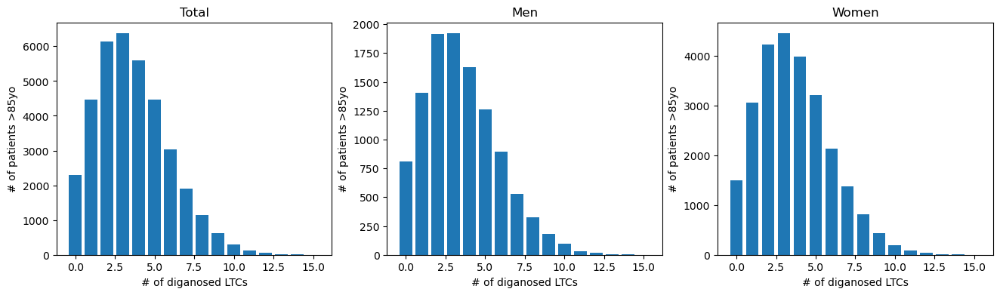

In [119]:
LTC_prev_df = describe_subpopulation(index=index, lower_lim=85)

In [120]:
LTC_prev_df

,Counts,Prevalence
Hypertension,18830,51%
CHD,9491,26%
TreatedConstipation,7414,20%
HearingLoss,6320,17%
PainfulCondition,6268,17%
CKD,6059,17%
StrokeTIA,5885,16%
Depression,5554,15%
ThyroidDisorders,5153,14%
AnxietyEtc,4887,13%


In [121]:
df_eldo = data[(data["Age"] >= 85) & (data["Age"] < 90)]
print(f"Total: {len(df_eldo)}")
morb_cols = df_eldo.columns[11:51]
for morb_col in morb_cols:
    print(morb_col, df_eldo[morb_col].sum(), f"{df_eldo[morb_col].mean() * 100:.2g}%")

Total: 24560
Hypertension 13355 54%
Depression 3704 15%
PainfulCondition 4491 18%
ActiveAsthma 1280 5.2%
CHD 6421 26%
TreatedDyspepsia 3126 13%
Diabetes 2860 12%
ThyroidDisorders 3390 14%
RheumatoidArthritisEtc 2998 12%
HearingLoss 3963 16%
COPD 2448 10%
AnxietyEtc 3075 13%
IrritableBowelSyndrome 848 3.5%
AnyCancer_Last5Yrs 2701 11%
AlcoholProblems 339 1.4%
OtherPsychoactiveMisuse 2653 11%
TreatedConstipation 4399 18%
StrokeTIA 3826 16%
CKD 4230 17%
Diverticular 3153 13%
AtrialFib 3127 13%
PeripheralVascularDisease 1570 6.4%
HeartFailure 2277 9.3%
Prostate 1037 4.2%
Glaucoma 1775 7.2%
Epilepsy 219 0.89%
Dementia 2575 10%
SchizophreniaBipolar 271 1.1%
PsoriasisEczema 249 1%
InflammatoryBowelDisease 197 0.8%
Migraine 40 0.16%
Blindness 1113 4.5%
ChronicSinusitis 135 0.55%
LearningDisability 24 0.098%
AnorexiaBulimia 69 0.28%
Bronchiectasis 122 0.5%
Parkinsons 371 1.5%
MultipleSclerosis 31 0.13%
ViralHepatitis 2 0.0081%
ChronicLiverDisease 17 0.069%


We will use a p-value of 0.01 for claiming significance and for computing confidence intervals. As the significance test, we will use [Fisher's exact test](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.fisher_exact.html), as we have many pairs of conditions with very few observations.

## Results

In [59]:
l = 4
model, dat_85 = load_model(dfs[l], num_warmup=500, num_samples=20000, fname=fnames[l], pval=0.01)

Model '/disk/scratch/gromero/output/Age85-4_MLTC_atomic_hyp_mult_wu500' not found, fitting new model...
Shape of co-occurrence matrix: (40, 40)
Sampling with params: {num_chains: 5, num_samples: 4000, num_warmup: 500}


23:07:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

chain 5 |          | 00:00 Status

23:10:21 - cmdstanpy - INFO - CmdStan done processing.
23:10:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 36, column 6 to column 53)
	Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 36, column 6 to column 53)
	Exception: beta_lpdf: Second shape parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 28, column 4 to column 55)
	Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/models/MLTC_atomic_hyp_mult.stan', line 36, column 6 to column 53)
Exception: lognormal_l


Elapsed time: 00 hours, 02 minutes, 51 seconds.
Processing csv files: /tmp/tmptdaxu7wa/MLTC_atomic_hyp_multuhm2v2m3/MLTC_atomic_hyp_mult-20240401230736_1.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_multuhm2v2m3/MLTC_atomic_hyp_mult-20240401230736_2.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_multuhm2v2m3/MLTC_atomic_hyp_mult-20240401230736_3.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_multuhm2v2m3/MLTC_atomic_hyp_mult-20240401230736_4.csv, /tmp/tmptdaxu7wa/MLTC_atomic_hyp_multuhm2v2m3/MLTC_atomic_hyp_mult-20240401230736_5.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.

                       Mean      MCSE     StdDev            5%           50%  \
lp__          -1.429650e+07 

/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/utils.py:134: RuntimeWarning: divide by zero encountered in true_divide
  sigmas = 1 / X - 1 / M + 1 / P_abs[None, :] / P_abs[:, None] - 1 / M ** 2
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/utils.py:136: RuntimeWarning: invalid value encountered in multiply
  RRs_conf = RRs * np.exp(zs[0] * sigmas), RRs * np.exp(zs[1] * sigmas)


Significant associatons:   Fisher (RR): 297 (38.1%), ABC: 274 (35.1%)


In [123]:
assoc_90yo = pd.DataFrame({'RR': {'IrritableBowelSyndrome-Migraine': 10.990543014032946, 'SchizophreniaBipolar-AnorexiaBulimia': 9.00675, 'IrritableBowelSyndrome-ChronicSinusitis': 5.373154362416107, 'COPD-Bronchiectasis': 4.903987509007926, 'Prostate-PsoriasisEczema': 4.25687531385697, 'ActiveAsthma-COPD': 3.856386462191992, 'PeripheralVascularDisease-AnorexiaBulimia': 3.6869736842105256, 'COPD-ChronicSinusitis': 3.538563535911602, 'Depression-SchizophreniaBipolar': 3.3105891891891894, 'COPD-AlcoholProblems': 3.220779917395269},
                           'ABC': {'IrritableBowelSyndrome-Migraine': 1.1389073824005118, 'SchizophreniaBipolar-AnorexiaBulimia': 1.0473079828536456, 'IrritableBowelSyndrome-ChronicSinusitis': 1.3354070599875318, 'COPD-Bronchiectasis': 2.3833554037525673, 'Prostate-PsoriasisEczema': 1.5823041304888856, 'ActiveAsthma-COPD': 3.539388441906116, 'PeripheralVascularDisease-AnorexiaBulimia': 1.2881376792089787, 'COPD-ChronicSinusitis': 1.7064407810873226, 'Depression-SchizophreniaBipolar': 2.628905905039449, 'COPD-AlcoholProblems': 2.2523997990930895},
                           'a_sig': {'IrritableBowelSyndrome-Migraine': False, 'SchizophreniaBipolar-AnorexiaBulimia': False, 'IrritableBowelSyndrome-ChronicSinusitis': False, 'COPD-Bronchiectasis': True, 'Prostate-PsoriasisEczema': False, 'ActiveAsthma-COPD': True, 'PeripheralVascularDisease-AnorexiaBulimia': False, 'COPD-ChronicSinusitis': False, 'Depression-SchizophreniaBipolar': True, 'COPD-AlcoholProblems': True},
                           'RR_f_sig_CI': {'IrritableBowelSyndrome-Migraine': '11.0 (4.65 - 26.0)', 'SchizophreniaBipolar-AnorexiaBulimia': '9.01 (3.81 - 21.3)', 'IrritableBowelSyndrome-ChronicSinusitis': '5.37 (3.5 - 8.25)', 'COPD-Bronchiectasis': '4.9 (4.22 - 5.71)', 'Prostate-PsoriasisEczema': '4.26 (3.44 - 5.28)', 'ActiveAsthma-COPD': '3.86 (3.78 - 3.93)', 'PeripheralVascularDisease-AnorexiaBulimia': '3.69 (2.55 - 5.33)', 'COPD-ChronicSinusitis': '3.54 (2.86 - 4.39)', 'Depression-SchizophreniaBipolar': '3.31 (3.15 - 3.48)', 'COPD-AlcoholProblems': '3.22 (2.91 - 3.57)'},
                           'a_f_sig_CI': {'IrritableBowelSyndrome-Migraine': 'NS', 'SchizophreniaBipolar-AnorexiaBulimia': 'NS', 'IrritableBowelSyndrome-ChronicSinusitis': 'NS', 'COPD-Bronchiectasis': '2.38 (1.24 - 4.24)', 'Prostate-PsoriasisEczema': 'NS', 'ActiveAsthma-COPD': '3.54 (2.87 - 4.43)', 'PeripheralVascularDisease-AnorexiaBulimia': 'NS', 'COPD-ChronicSinusitis': 'NS', 'Depression-SchizophreniaBipolar': '2.63 (1.89 - 3.84)', 'COPD-AlcoholProblems': '2.25 (1.28 - 3.4)'},
                           'fisher_sig': {'IrritableBowelSyndrome-Migraine': True, 'SchizophreniaBipolar-AnorexiaBulimia': True, 'IrritableBowelSyndrome-ChronicSinusitis': True, 'COPD-Bronchiectasis': True, 'Prostate-PsoriasisEczema': True, 'ActiveAsthma-COPD': True, 'PeripheralVascularDisease-AnorexiaBulimia': True, 'COPD-ChronicSinusitis': True, 'Depression-SchizophreniaBipolar': True, 'COPD-AlcoholProblems': True}})
assoc_90yo

,RR,ABC,a_sig,RR_f_sig_CI,a_f_sig_CI,fisher_sig
IrritableBowelSyndrome-Migraine,10.990543,1.138907,False,11.0 (4.65 - 26.0),NS,True
SchizophreniaBipolar-AnorexiaBulimia,9.006750,1.047308,False,9.01 (3.81 - 21.3),NS,True
IrritableBowelSyndrome-ChronicSinusitis,5.373154,1.335407,False,5.37 (3.5 - 8.25),NS,True
COPD-Bronchiectasis,4.903988,2.383355,True,4.9 (4.22 - 5.71),2.38 (1.24 - 4.24),True
Prostate-PsoriasisEczema,4.256875,1.582304,False,4.26 (3.44 - 5.28),NS,True
ActiveAsthma-COPD,3.856386,3.539388,True,3.86 (3.78 - 3.93),3.54 (2.87 - 4.43),True
PeripheralVascularDisease-AnorexiaBulimia,3.686974,1.288138,False,3.69 (2.55 - 5.33),NS,True
COPD-ChronicSinusitis,3.538564,1.706441,False,3.54 (2.86 - 4.39),NS,True
Depression-SchizophreniaBipolar,3.310589,2.628906,True,3.31 (3.15 - 3.48),2.63 (1.89 - 3.84),True
COPD-AlcoholProblems,3.220780,2.252400,True,3.22 (2.91 - 3.57),2.25 (1.28 - 3.4),True


In [124]:
dat_85.loc[assoc_90yo.index].loc[:, ["RR", "ABC", "RR_f_sig_CI", "a_f_sig_CI"]]

,RR,ABC,RR_f_sig_CI,a_f_sig_CI
IrritableBowelSyndrome-Migraine,5.631198,1.870610,5.63 (4.23 - 7.5),NS
SchizophreniaBipolar-AnorexiaBulimia,2.712901,1.095676,NS,NS
IrritableBowelSyndrome-ChronicSinusitis,3.368291,2.116805,3.37 (2.94 - 3.86),2.12 (1.19 - 3.72)
COPD-Bronchiectasis,4.349557,3.628225,4.35 (4.19 - 4.52),3.63 (2.63 - 5.04)
Prostate-PsoriasisEczema,2.668958,2.088550,2.67 (2.48 - 2.87),2.09 (1.38 - 3.29)
ActiveAsthma-COPD,3.455478,3.547935,3.46 (3.44 - 3.47),3.55 (3.15 - 3.93)
PeripheralVascularDisease-AnorexiaBulimia,2.038056,1.503035,NS,NS
COPD-ChronicSinusitis,2.241861,1.987288,2.24 (2.09 - 2.4),1.99 (1.26 - 2.85)
Depression-SchizophreniaBipolar,3.584963,3.557950,3.58 (3.54 - 3.63),3.56 (2.94 - 4.24)
COPD-AlcoholProblems,2.393476,2.279035,2.39 (2.33 - 2.46),2.28 (1.73 - 2.95)


In [125]:
assoc_90yo_joint = pd.DataFrame({'RR (90yo+)': {'IrritableBowelSyndrome-Migraine': '11.0 (4.65 - 26.0)', 'SchizophreniaBipolar-AnorexiaBulimia': '9.01 (3.81 - 21.3)',
                                                'IrritableBowelSyndrome-ChronicSinusitis': '5.37 (3.5 - 8.25)', 'COPD-Bronchiectasis': '4.9 (4.22 - 5.71)',
                                                'Prostate-PsoriasisEczema': '4.26 (3.44 - 5.28)', 'ActiveAsthma-COPD': '3.86 (3.78 - 3.93)',
                                                'PeripheralVascularDisease-AnorexiaBulimia': '3.69 (2.55 - 5.33)', 'COPD-ChronicSinusitis': '3.54 (2.86 - 4.39)',
                                                'Depression-SchizophreniaBipolar': '3.31 (3.15 - 3.48)', 'COPD-AlcoholProblems': '3.22 (2.91 - 3.57)'},
                                 'ABC (90yo+)': {'IrritableBowelSyndrome-Migraine': 'NS', 'SchizophreniaBipolar-AnorexiaBulimia': 'NS',
                                                 'IrritableBowelSyndrome-ChronicSinusitis': 'NS', 'COPD-Bronchiectasis': '2.38 (1.24 - 4.24)', 'Prostate-PsoriasisEczema': 'NS',
                                                 'ActiveAsthma-COPD': '3.54 (2.87 - 4.43)', 'PeripheralVascularDisease-AnorexiaBulimia': 'NS', 'COPD-ChronicSinusitis': 'NS',
                                                 'Depression-SchizophreniaBipolar': '2.63 (1.89 - 3.84)', 'COPD-AlcoholProblems': '2.25 (1.28 - 3.4)'},})
assoc_85yo_joint = dat_85.loc[assoc_90yo.index].loc[:, ["RR_f_sig_CI", "a_f_sig_CI"]]
assoc_85yo_joint.columns = ['RR (85yo+)', 'ABC (85yo+)']
assoc_joint = pd.concat([assoc_90yo_joint, assoc_85yo_joint], axis=1)
beautify_index(assoc_joint)

,RR (90yo+),ABC (90yo+),RR (85yo+),ABC (85yo+)
Irritable bowel syndrome (IBS) - Migraine,11.0 (4.65 - 26.0),NS,5.63 (4.23 - 7.5),NS
Schizophrenia (and related non-organic psychosis) or bipolar disorder - Anorexia or bulimia,9.01 (3.81 - 21.3),NS,NS,NS
Irritable bowel syndrome (IBS) - Chronic sinusitis,5.37 (3.5 - 8.25),NS,3.37 (2.94 - 3.86),2.12 (1.19 - 3.72)
Chronic obstructive pulmonary disease (COPD) - Bronchiectasis,4.9 (4.22 - 5.71),2.38 (1.24 - 4.24),4.35 (4.19 - 4.52),3.63 (2.63 - 5.04)
Prostate disorders - Psoriasis or eczema,4.26 (3.44 - 5.28),NS,2.67 (2.48 - 2.87),2.09 (1.38 - 3.29)
Asthma (currently treated) - Chronic obstructive pulmonary disease (COPD),3.86 (3.78 - 3.93),3.54 (2.87 - 4.43),3.46 (3.44 - 3.47),3.55 (3.15 - 3.93)
Peripheral vascular disease - Anorexia or bulimia,3.69 (2.55 - 5.33),NS,NS,NS
Chronic obstructive pulmonary disease (COPD) - Chronic sinusitis,3.54 (2.86 - 4.39),NS,2.24 (2.09 - 2.4),1.99 (1.26 - 2.85)
Depression - Schizophrenia (and related non-organic psychosis) or bipolar disorder,3.31 (3.15 - 3.48),2.63 (1.89 - 3.84),3.58 (3.54 - 3.63),3.56 (2.94 - 4.24)
Chronic obstructive pulmonary disease (COPD) - Alcohol problems,3.22 (2.91 - 3.57),2.25 (1.28 - 3.4),2.39 (2.33 - 2.46),2.28 (1.73 - 2.95)


In [126]:
print(assoc_joint.style.to_latex())

\begin{tabular}{lllll}
 & RR (90yo+) & ABC (90yo+) & RR (85yo+) & ABC (85yo+) \\
Irritable bowel syndrome (IBS) - Migraine & 11.0 (4.65 - 26.0) & NS & 5.63 (4.23 - 7.5) & NS \\
Schizophrenia (and related non-organic psychosis) or bipolar disorder - Anorexia or bulimia & 9.01 (3.81 - 21.3) & NS & NS & NS \\
Irritable bowel syndrome (IBS) - Chronic sinusitis & 5.37 (3.5 - 8.25) & NS & 3.37 (2.94 - 3.86) & 2.12 (1.19 - 3.72) \\
Chronic obstructive pulmonary disease (COPD) - Bronchiectasis & 4.9 (4.22 - 5.71) & 2.38 (1.24 - 4.24) & 4.35 (4.19 - 4.52) & 3.63 (2.63 - 5.04) \\
Prostate disorders - Psoriasis or eczema & 4.26 (3.44 - 5.28) & NS & 2.67 (2.48 - 2.87) & 2.09 (1.38 - 3.29) \\
Asthma (currently treated) - Chronic obstructive pulmonary disease (COPD) & 3.86 (3.78 - 3.93) & 3.54 (2.87 - 4.43) & 3.46 (3.44 - 3.47) & 3.55 (3.15 - 3.93) \\
Peripheral vascular disease - Anorexia or bulimia & 3.69 (2.55 - 5.33) & NS & NS & NS \\
Chronic obstructive pulmonary disease (COPD) - Chronic sinusi

/tmp/ipykernel_23694/475727994.py:79: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  sub_fig.tight_layout()


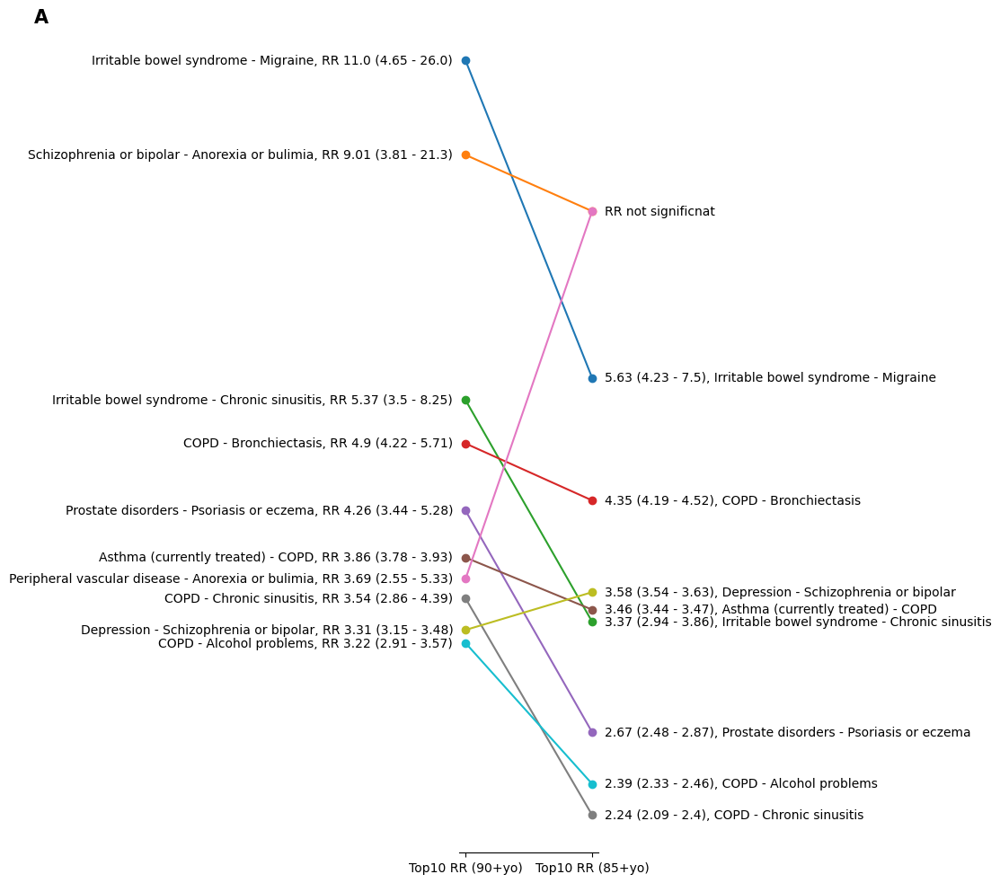

In [127]:
def plot_fig2(ax, panel):
    NS_pos = 8 if panel == "A" else 1
    y_dict = {"RR": {},#"COPD - Alcohol problems": -2,
        #              "Glaucoma - Blindness & low vision": -8,},
              "ABC": {},}#"COPD - Alcohol problems": 8,
        #              "Irritable bowel syndrome - Diverticular disease": 10,
        #              "Depression - Anxiety related disorders": 3,
        #              "Atrial fibrillation (AF) - Heart failure": -2,
        #              "Glaucoma - Blindness & low vision": -1}} if panel == "A" else {
        # "RR": {"Coronary heart disease - Dementia": 11,
        #             "Hypertension - Dementia": 3,
        #              "Treated dyspepsia - Atrial fibrillation (AF)": -2,
        #             "Chronic kidney disease - Dementia":-7,
        #             "Heart failure - Dementia": -4,},
        #       "ABC": {"Heart failure - Dementia": 6,
        #              "Chronic kidney disease - Dementia":-7}}

    if panel == "A":
        top_RRs_90s = assoc_90yo.sort_values("RR", ascending=False).iloc[:10].loc[:, ["RR", "ABC", "a_sig", "RR_f_sig_CI", "a_f_sig_CI"]]
        top_RRs_85s = dat_85.loc[assoc_90yo.index].sort_values("RR", ascending=False).iloc[:10].loc[:, ["RR", "ABC", "fisher_sig", "RR_f_sig_CI", "a_f_sig_CI"]]
        # assocs = pd.concat([top_RRs_90s, top_RRs_85s])
        # assocs = assocs[~assocs.index.duplicated(keep='first')]
    else:
        cols = ["RR", "ABC", "a_sig", "RR_conf_down", "RR_conf_up", "a_conf_down", "a_conf_up"]
        neg_RRs = dat_85[dat_85["fisher_sig"].astype(bool) & (dat_85["RR"] < 1)].sort_values("RR").loc[:, cols]
        neg_ABCs = dat_85[dat_85["a_sig"].astype(bool) & (dat_85["ABC"] < 1)].sort_values("ABC").loc[:, cols]

        for res in (neg_RRs, neg_ABCs):
            res["a_f"] = res["ABC"].apply(lambda x: f"{x:.2f}")
            res["a CI (99%)"] = res["a_conf_down"].apply(lambda x: f"{x:.2f}") + " - " + res["a_conf_up"].apply(lambda x: f"{x:.2f}")
            res["a_f_sig_CI"] = res["a_f"] + " (" + res["a CI (99%)"] + ")"

            res["RR_f"] = res["RR"].apply(lambda x: f"{x:.2f}")
            res["RR CI (99%)"] = res["RR_conf_down"].apply(lambda x: f"{x:.2f}") + " - " + res["RR_conf_up"].apply(lambda x: f"{x:.2f}")
            res["RR_f_sig_CI"] = res["RR_f"] + " (" + res["RR CI (99%)"] + ")"

        assocs = pd.concat([neg_RRs, neg_ABCs])


    def beautify_index(table):
        table.index = [" - ".join([beautify_name(nam, short=True) for nam in re.findall('[^-]+', name)]) for name in list(table.index)]
        return table

    # assocs = assocs[~assocs.index.duplicated(keep='first')]
    # assocs = beautify_index(assocs) 
    top_RRs_90s = beautify_index(top_RRs_90s) 
    top_RRs_85s = beautify_index(top_RRs_85s) 

    anno_kwargs = {"va":"center", "textcoords":"offset points"}
    for i, (label, row) in enumerate(top_RRs_90s.iterrows()):
        row2 = top_RRs_85s.loc[label]
        ax.plot([0,1], [row["RR"], row2["RR"] if row2["fisher_sig"] else NS_pos], marker="o")

        ax.annotate(f'{label}, RR {row["RR_f_sig_CI"]}', (0, row["RR"]), xytext=(-10, y_dict["RR"][label] if label in y_dict["RR"] else 0), ha='right', 
                    color="black" if i < 10 or panel == "B" else "grey", **anno_kwargs)
        ax.annotate(f'{row2["RR_f_sig_CI"]}, {label}', (1, row2["RR"]), xytext=(10, y_dict["ABC"][label] if label in y_dict["ABC"] else 0), ha='left',
                    **anno_kwargs) if row2["fisher_sig"] else None
    ax.annotate("RR not significnat", (1, NS_pos), xytext=(10, 0), ha='left', **anno_kwargs)

    ax.set(yscale="log",ylim=[None,1] if panel == "B" else None);  # , ylim=1);
    ax.spines['top'].set_visible(False if panel == "A" else True)
    ax.spines['bottom'].set_visible(False if panel == "B" else True)
    ax.spines['left'].set_visible(False); ax.spines['right'].set_visible(False)
    ax.set_xticks([0, 1], ["Top10 RR (90+yo)", "Top10 RR (85+yo)"] if panel == "A" else ["Negative RR", "Negative ABC"]);
    ax.set_yticks([]);  # plt.tick_params(labelleft=False, left=False)
    ax.annotate(panel, xy=(-3.05, 1.), xycoords='axes fraction', fontweight='bold', fontsize=15)
    
    ax.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False) if panel == "B" else None  # labelleft=False, left=False)
    ax.minorticks_off();
    

# fig, axes = plt.subplots(2, 1, figsize=(2,12*2))
# for ax, panel in zip(axes, "AB"):

# plot_fig2(ax, panel)
panel="A"
sub_fig, ax = plt.subplots(figsize=(2,12))
plot_fig2(ax, panel)
sub_fig.tight_layout()
# sub_fig.savefig(f"figs/fig2{panel}.eps")
# break

# fig.tight_layout()
# fig.savefig("figs/fig2.eps")

How many pairs are marked as confident by either method?

In [128]:
f"Significant: Fisher: {dat_85['fisher_sig'].sum():.0f} ({100*dat_85['fisher_sig'].mean():.1f}%), ABC: {dat_85['a_sig'].sum():.0f} ({100*dat_85['a_sig'].mean():.1f}%)"

'Significant: Fisher: 297 (38.1%), ABC: 274 (35.1%)'

About one third of the links are not statistically significant from RR and about more than half of the links are not statistically significant from our association measure (99% confidence intervals).

Let's now look at the heatmaps.

<AxesSubplot:title={'center':'RR'}>

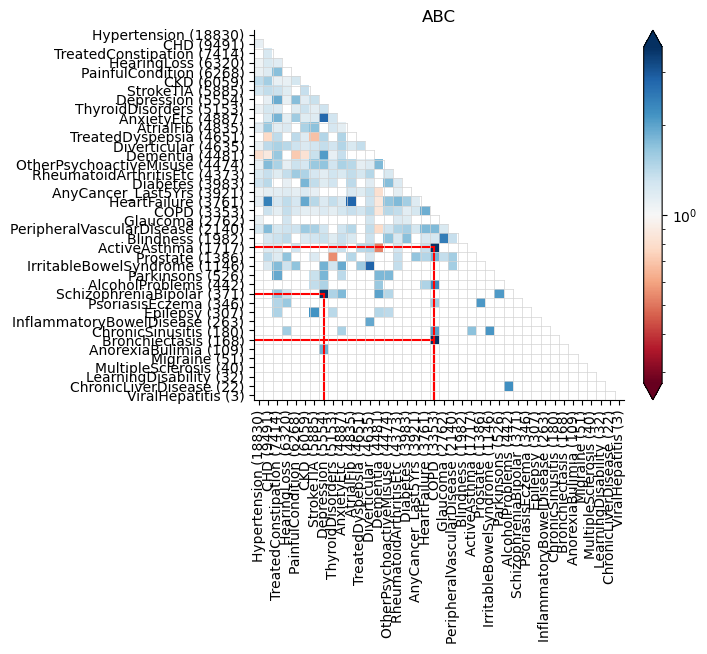

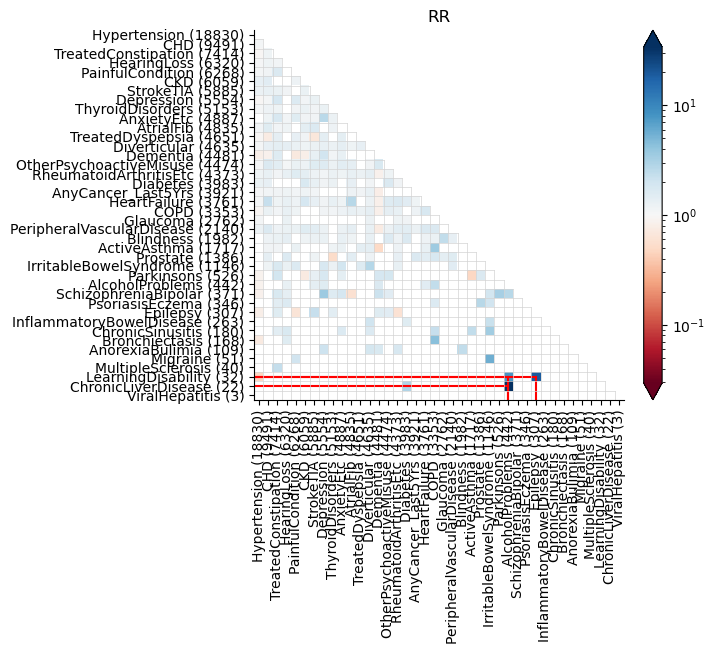

In [129]:
model.plot_heatmap("ABC", highlight_top=True)
model.plot_heatmap("RR", highlight_top=True)

The top 10 associations found by our method are

In [133]:
dat_85[dat_85["a_sig"].astype(bool)].sort_values("ABC", ascending=False).iloc[:10].loc[:, ["a_f", "a CI (99%)"]]

,a_f,a CI (99%)
names,,
COPD-Bronchiectasis,3.63,2.63 - 5.04
Depression-SchizophreniaBipolar,3.56,2.94 - 4.24
ActiveAsthma-COPD,3.55,3.15 - 3.93
IrritableBowelSyndrome-Diverticular,2.81,2.45 - 3.16
AtrialFib-HeartFailure,2.79,2.59 - 2.99
Depression-AnxietyEtc,2.75,2.58 - 2.9
Glaucoma-Blindness,2.44,2.12 - 2.77
CHD-HeartFailure,2.38,2.24 - 2.51
COPD-AlcoholProblems,2.28,1.73 - 2.95


The negative associations correspond to:

In [134]:
dat_85[dat_85["a_sig"].astype(bool) & (dat_85["ABC"] < 1)].sort_values("ABC", ascending=True).loc[:, ["a_f", "a CI (99%)"]]

,a_f,a CI (99%)
names,,
ActiveAsthma-Dementia,0.529,0.41 - 0.663
ThyroidDisorders-Prostate,0.549,0.432 - 0.704
TreatedDyspepsia-StrokeTIA,0.684,0.61 - 0.769
PainfulCondition-Dementia,0.711,0.641 - 0.803
CHD-TreatedDyspepsia,0.774,0.708 - 0.842
PeripheralVascularDisease-Dementia,0.788,0.649 - 0.93
Hypertension-Dementia,0.804,0.755 - 0.856
AnyCancer_Last5Yrs-Dementia,0.814,0.713 - 0.929
CKD-Dementia,0.834,0.746 - 0.919


The top 10 significant associations found by relative risk correspond to

In [136]:
dat_85[dat_85["fisher_sig"].astype(bool)].sort_values("RR", ascending=False).iloc[:10].loc[:, ["RR_f", "RR CI (99%)", "a_f_sig"]] #  "a_conf", "a_f"]]  # .reset_index(drop=True)

,RR_f,RR CI (99%),a_f_sig
names,,,
AlcoholProblems-ChronicLiverDisease,33.8,25.4 - 45.1,2.2
Epilepsy-LearningDisability,18.6,11.1 - 31.2,NS
AlcoholProblems-LearningDisability,7.76,3.29 - 18.3,NS
IrritableBowelSyndrome-Migraine,5.63,4.23 - 7.5,NS
COPD-Bronchiectasis,4.35,4.19 - 4.52,3.63
Depression-SchizophreniaBipolar,3.58,3.54 - 3.63,3.56
ActiveAsthma-COPD,3.46,3.44 - 3.47,3.55
IrritableBowelSyndrome-ChronicSinusitis,3.37,2.94 - 3.86,2.12
SchizophreniaBipolar-Parkinsons,3.19,2.74 - 3.71,2.08


The bottom 10 significant associations found by relative risk correspond to

In [137]:
dat_85[dat_85["fisher_sig"].astype(bool) & (dat_85["RR"] < 1)].sort_values("RR", ascending=True).iloc[:15].loc[:, ["RR_f", "RR CI (99%)", "a_f_sig"]]

,RR_f,RR CI (99%),a_f_sig
names,,,
Hypertension-LearningDisability,0.486,0.352 - 0.67,NS
ActiveAsthma-Parkinsons,0.486,0.392 - 0.602,NS
ActiveAsthma-Dementia,0.49,0.478 - 0.502,0.529
ThyroidDisorders-Prostate,0.517,0.504 - 0.53,0.549
AtrialFib-SchizophreniaBipolar,0.591,0.541 - 0.646,NS
RheumatoidArthritisEtc-Epilepsy,0.599,0.533 - 0.674,NS
PainfulCondition-Epilepsy,0.627,0.58 - 0.678,NS
TreatedDyspepsia-StrokeTIA,0.669,0.666 - 0.673,0.684
PainfulCondition-Dementia,0.706,0.702 - 0.709,0.711


261/780 data points
13/780 data points
36/780 data points
470/780 data points


/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(xlim=lim if xlim is None else xlim, ylim=lim if ylim is None else ylim,
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(xlim=lim if xlim is None else xlim, ylim=lim if ylim is None else ylim,
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(xlim=lim if xlim is None else xlim, ylim=lim if ylim is None else ylim,
/afs/inf.ed.ac.uk/user/g/gromero/Git/Multimorbidity-AIM-CISC/notebooks/../lib/results.py:191: UserWarning: Attempted to set non-positive bottom ylim on a l

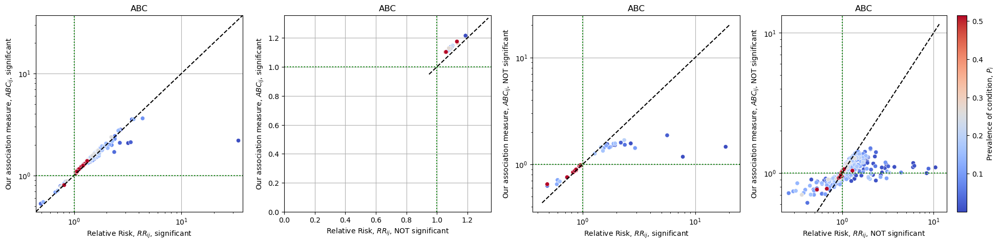

In [138]:
fig, axes = plt.subplots(1,4, figsize=(24,5)) #, sharex=True) #, sharey=True)
plot_ABC_vs_RR(axes[0], dat_85, log=True)  # xlim=[0, 5.1], ylim=[0, 4])
plot_ABC_vs_RR(axes[1], dat_85, RR_conf=False, log=False, xlim=0, ylim=0)
plot_ABC_vs_RR(axes[2], dat_85, a_conf=False, log=True, xlim=0, ylim=0)
plot_ABC_vs_RR(axes[3], dat_85, RR_conf=False, a_conf=False, colorbar=True, log=True, xlim=0, ylim=0)

# fig, ax = plt.subplots(figsize=(7, 5))
# plot_ABC_vs_RR(ax, ABC_type="mode", colorbar=True, log=True);